### Quantify image-based metrics of TB stain with single-cell segmentation geometries

In [1]:
import rasterio as rio
from rasterio.mask import mask
import geopandas as gpd
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import cv2
import scipy
import scipy.stats as stats
from scipy.stats import normaltest
from scipy import sparse
from sklearn.preprocessing import StandardScaler
from shapely.geometry import shape, box
from shapely.affinity import translate
from shapely.geometry import Polygon
from tqdm import tqdm
import scanpy as sc
import math
import scipy.io as sio
import gc


In [2]:
def concatenate_h5ad_folder(input_folder,
                            output_folder='None',
                            name = 'concatenated_10x_output',
                            regex = ['donor','tissue','anatomical_position','method','sample','replicate','notes'],
                            regex_sep = '_',
                            counts_threshold=1000,
                            genes_threshold=100,
                            adata_file = 'None',
                            save_frequency = 100):
    
    """
    Take output files from decontx processing and concatenate into anndata object
    """
    
    if output_folder=='None':
        output_folder=input_folder
    
    if not os.path.isdir(input_folder):
        raise SyntaxError('Input folder cannot be found')   
        
    if not os.path.isdir(output_folder):
        raise SyntaxError('output folder cannot be found')   
    
    adata = sc.AnnData()
        
    files = [i for i in os.listdir(input_folder) if i.endswith(('.h5ad','.h5ad.gz'))]
    print("first file: ",files[0])
    count = 0
    for file in tqdm(files):
        
        
        info = file.split(".")[0] #assuming information is present in the filename
        
        #add something to check whether a given sample is already present in the adata file
        if adata_file!='None':
            if info in list(adata.obs['10X_run']):
                print('The sample ', info,' is already in the object. Skipping.')
                continue
        info_split = info.split(regex_sep)
        if len(info_split)<len(regex):
            print('Warning: the sample ',info,' does not have enough metadata information, ',regex[len(info_split):],' will be excluded')
            regex_fix = regex[:len(info_split)]
        else:
            regex_fix = regex
            
            
        print('reading ',file)
        adata_interim = sc.read_h5ad(os.path.join(input_folder,file))
        
        #add in .obs - this depends on the actual metadata format
        print('adding .obs columns to anndata object')
        
        adata_interim.obs['full_sample'] = info
           
        for n in range(0,len(regex_fix)):
            adata_interim.obs[regex_fix[n]] = info.split(regex_sep)[n]
        
        adata_interim.obs['cell_id'] = adata_interim.obs['full_sample'] + "_" + adata_interim.obs.index.astype('str')
        adata_interim.obs.set_index('cell_id',inplace=True)
        
        try:
            del adata_interim.obsm
        except:
            adata_interim
        
        for obs_column in adata.obs.columns:
            if "." in obs_column:
                adata.obs[obs_column] = adata.obs[obs_column].astype('str')
            
        if adata.shape[0]>1:  
            adata = ad.concat([adata,adata_interim],join='outer',merge='unique')
            print('added to adata')
        else:
            adata = adata_interim.copy()
            print('copying interim')
            
        adata.obs = adata.obs.astype('str')
        count = count+1
        
        if count == save_frequency:
            adata.write_h5ad(os.path.join(output_folder,name+'.h5ad'))
            count=0
        
        gc.collect()
            
    
    adata.write_h5ad(os.path.join(output_folder,name+'.h5ad'))
    
    return adata

In [3]:
# Helper functions
def load_image_roi(file_name, window_coords):
    try:
        with rio.open(file_name) as aws_file:
            roi = aws_file.read(1, window=rio.windows.Window(*window_coords))
    except OSError:
        print(f"File read error on {file_name}")
        roi = np.zeros([window_coords[3],window_coords[2]])
        
    return np.squeeze(roi)

def convert_eight_bit(img):
    # Normalize contrast before reducing bit depth
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    norm_img = clahe.apply(img)    
    bg_subtract = norm_img - norm_img.min()
    
    if bg_subtract.max() == 0:
        return np.zeros(img.shape, dtype=np.uint8)
    else:
        range_norm = bg_subtract / bg_subtract.max()      
        return np.array(range_norm * 255, dtype=np.uint8)

In [4]:
def load_tb_image_information(dataPath, experimentName, region):
    
    #initialize a dataframe
    df = pd.DataFrame()

    #iterate through the z planes - in this case there are 7
    for z in range(0,7):
        z_level = str(z)
        print('z_level: ', z_level)
    
        # Segmentation boundaries
        geometries = gpd.read_parquet(
            os.path.join(dataPath, experimentName, 'region_' + region, 'cell_boundaries.parquet')).set_index('EntityID')
    #print('Segmentation geometries loaded.')

    # TB stain channel image, AKA cellbound3
        TBmosaicPath = os.path.join(
            dataPath, experimentName, 'region_' + region, 'images', 'mosaic_Cellbound3_z' + z_level + '.tif')

    # DAPI stain channel image
        DAPImosaicPath = os.path.join(
            dataPath, experimentName, 'region_' + region, 'images', 'mosaic_DAPI_z' + z_level + '.tif')
    
    # Cellbound2 stain channel image
        Cellbound2mosaicPath = os.path.join(
            dataPath, experimentName, 'region_' + region, 'images', 'mosaic_Cellbound2_z' + z_level + '.tif')

    #print('Mosaic filepaths loaded.')

    # Micron to mosaic pixel transform
        transformationMatrix = np.loadtxt(
            os.path.join(dataPath, experimentName, 'region_' + region, 'images', 'micron_to_mosaic_pixel_transform.csv'))
    
    # Convert transformation matrix to correct affine transformation format for Geopandas
        t = transformationMatrix
        affine_matrix = [t[0,0], t[0,1], t[1,0], t[1,1], t[0,2], t[1,2]]

    #print('Micron to mosaic pixel transform loaded.')

    # Create new geodataframe column with mosaic pixel units
        geometries_mosaic = geometries.copy()
        geometries_mosaic['Geometry'] = geometries['Geometry'].affine_transform(affine_matrix)

    #print('Mosaic geometries calculated.')

    # Check that we have the right coordinates by overlaying with DAPI channel
    # What are the dimensions of the overall experiment?
        s = rio.open(DAPImosaicPath)
        print('Dimensions of experiment are ' + str(s.width) + ' x ' + str(s.height) + ' in pixels.')

        gdf = geometries_mosaic.copy()
        gdf = gdf[gdf['ZIndex'] == int(z_level)]

        shapes = list(gdf['Geometry'])
        masks = []

        with rio.open(TBmosaicPath) as src:
            for shape in tqdm(shapes):
                out_image, _ = mask(src, shape.geoms, crop=True)
                masks.append(out_image)
        
    # Save array of pixel intensities for each cell
        gdf['TB_intensities'] = pd.Series(dtype='object')
    #for i in tqdm(range(len(gdf))):
        #gdf.loc[:,'TB_intensities'].loc[gdf.index[i]] = masks[i][np.nonzero(masks[i])]
    
    
    #all nonzero TB intensities for each cell
        gdf['TB_intensities'] = [masks[i][np.nonzero(masks[i])] for i in range(len(gdf))] 
    
    #all TB intensities for each cell, including zeros
        gdf['TB_spatial'] = [masks[i].squeeze() for i in range(len(gdf))] 

    # Calculate some metrics

    # Sum signal
        gdf['sum_signal'] = [gdf.iloc[i]['TB_intensities'].sum() for i in range(len(gdf))]

    # Mean (excluding zeros)
        gdf['mean_signal'] = [gdf.iloc[i]['TB_intensities'].mean() for i in range(len(gdf))]
    
    # Median (excluding zeros)
        gdf['median_signal'] = [np.median(gdf.iloc[i]['TB_intensities']) for i in range(len(gdf))]
    
    # Standard deviation (excluding zeros)
        gdf['std_signal'] = [gdf.iloc[i]['TB_intensities'].std() for i in range(len(gdf))]

    # Average of top 100 values
        gdf['top_avg_signal'] = [np.sort(gdf.iloc[i]['TB_spatial'])[::-1][:100].mean() for i in range(len(gdf))]

    #create a data frame we can add to for each z plane:
        add = gdf[['ZIndex','sum_signal','mean_signal','median_signal','std_signal','top_avg_signal']]
        df = pd.concat([df,add])
    return df
    
def make_average_gdf(df,adata):

#find the mean values for each entity across z positions
#add a binary classifier to adata
    avg_signal_df = pd.DataFrame(columns=df.columns)
    for ind in tqdm(list(set(df.index))):
        sub = df.loc[ind]
        avg = sub.mean(axis=0)
        avg_signal_df.loc[ind] = avg

    avg_signal_df.index = [str(i) for i in avg_signal_df.index]

    #subset to only cells that are included in the final object
    avg_signal_df['Entity_ID'] = avg_signal_df.index.astype('str').copy()
    avg_signal_df = avg_signal_df[avg_signal_df.Entity_ID.isin(list(adata.obs.index))].copy()
    avg_signal_df.set_index('Entity_ID',inplace=True)
    print(avg_signal_df.shape)

    return avg_signal_df


In [305]:
def load_vizgen_h5ad(processedDataPath,experimentName, filename, region,
                    min_volume=200, max_volume=5000, min_counts=20, min_dapi = 2000000, TB_threshold = 700000):
    
    #read in the h5ad file
    adata = sc.read_h5ad(processedDataPath+experimentName+'/'+filename)

    #print the number of cells, cells per region, and show the object
    print('number of cells in unfiltered dataset: ',adata.shape[0])
    print('cells per region: ', adata.obs.region.value_counts())

    #filter to one region at a time
    adata = adata[adata.obs.region==region].copy()
    adata

    # Calculate total counts
    adata.obs['total_counts'] = adata.X.toarray().sum(axis=1)
    adata.obs['log_total_counts'] = np.log(adata.obs['total_counts'] + 1)
    
    #print graphs
    #Create thresholds based on the plots above, and plot those lines onto the data. 
    fig, axes = plt.subplots(1,4, figsize=(12,4))

    # Cell volume
    bins = np.logspace(0,4,20)
    ax = axes[0]
    ax.hist(adata.obs['volume'], bins=bins,cumulative=True,density=True)
    ax.set_xlabel('cell volume (um^3)')
    ax.set_ylabel('count')
    ax.set_xscale('log')
    ax.axvline(min_volume,color='red')
    ax.axvline(max_volume,color='black')
    ax.axhline(0.05,color='red')

    # Total transcripts per cell
    bins = np.logspace(0,3.5,20)
    ax = axes[1]
    ax.hist(adata.obs['total_counts'], bins=bins,cumulative=True,density=True)
    ax.set_xlabel('total transcripts')
    ax.set_ylabel('count')
    ax.set_xscale('log')
    ax.axvline(min_counts,color='red')
    ax.axhline(0.20,color='red')


    # DAPI signal per cell
    bins = np.logspace(2,8,20)
    ax = axes[2]
    ax.hist(adata.obs['DAPI_high_pass'], bins=bins,cumulative=True,density=True)
    ax.set_xlabel('DAPI')
    ax.set_ylabel('fraction of cells')
    ax.set_xscale('log')
    #ax.set_yscale('log')
    ax.axvline(min_dapi,color='red')
    ax.axhline(0.1,color='red')

    # TB signal per cell
    bins = np.logspace(2,6,20)
    ax = axes[3]
    ax.hist(adata.obs['Cellbound3_high_pass'], bins=bins,cumulative=True,density=True)
    ax.set_xlabel('TB stain')
    ax.set_ylabel('count')
    ax.set_xscale('log')
    ax.axhline(0.95,color='black')
    ax.axvline(TB_threshold,color='black')

    print('saving figure')
    fig.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/'+experimentName+'region'+str(region)+'_basicQC.pdf')
    print("size of adata object: ", adata.shape)
    return adata

def filter_h5ad(adata,min_volume=200, max_volume=5000, min_counts=20, min_dapi = 2000000):
    #filter the object based on the thresholds above
    cells = adata.shape[0]
    adata = adata[(adata.obs['volume'] > min_volume) &
         (adata.obs['volume'] < max_volume) &
         (adata.obs['total_counts'] > min_counts) &
         (adata.obs['DAPI_high_pass'] > min_dapi)].copy()
    print('Filtering complete: ' + str(len(adata)) + ' cells remaining out of ' + str(cells) + ' original cells.')
    return adata

def show_spatial_plots(adata, clipx, experimentName, region,figsize = (10,10)):
    #Show the section and add lines for any removal of damage
    fig, ax = plt.subplots(figsize=figsize)
    sc.pl.spatial(adata, color='Cellbound3_high_pass', spot_size=50, ax=ax,color_map='OrRd',vmax=5000000)

    fig, ax = plt.subplots(figsize=figsize)
    ax.axvline(clipx,color='red')
    ax.axvline(clipx+1000,color='blue')

    if experimentName == '202309251210_20230925-RitwicqA-TB_VMSC02401' and region=='1':
        ax.axhline(6500,color='red')
        ax.axhline(7500,color='blue')
    sc.pl.spatial(adata, color='log_total_counts', spot_size=30, ax=ax)
    
def sc_preprocess(adata):
    # Basic scanpy preprocessing
    adata.X = adata.layers['counts'].copy()
    sc.pp.normalize_total(adata,target_sum=100)
    sc.pp.log1p(adata)

    #save normalized data
    adata.layers['log_normalized'] = adata.X.copy()
    print('log normalized')

    #scale data
    sc.pp.scale(adata)
    adata.layers['scale_data'] = adata.X.copy()
    print('scaled')

    #run dimensional reduction
    print('calculating pcs')
    sc.pp.pca(adata)

    print('calculating umap')
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=0.5)

    print('Scanpy processing complete.')
    #check that counts remain
    print(adata.layers['counts'][:1,:5])
    return adata

def tbcells_only_calculate_distance_to_tb(adata):
    adata.obs['distance_to_tb'] = -100
    #calculate euclidean distance from each of these cells to every other cell, find the minimum
    tb_cells = adata.obs.index[adata.obs.TB_class_from_images=='High']
    
    #iterate over all tb cells
    #find the location of the cell in space
    #X_spatial is not an x-coordinate, it's a point
    
    for cell in tqdm(list(tb_cells)):
        dist = []
        cell_loc = np.round(list([adata.obs.center_x[cell],adata.obs.center_y[cell]]),decimals=2)
    
        #iterate over all TB+ cells and find the distance from each one to the cell in question
        for tb_cell in tb_cells:
            tb_cell_loc = np.round(list([adata.obs.center_x[tb_cell],adata.obs.center_y[tb_cell]]),decimals=2)
            new_dist = np.round(math.dist(cell_loc,tb_cell_loc),decimals=2)
            dist.append(new_dist)

        #find the minimum distance to the 2nd tb+ cell
        try:
            min_dist = sorted(dist,reverse=False)[2]
        except:
            min_dist = 401
            print('not enough cells to calculate min distance')
        
        #add this to the object
        adata.obs.loc[cell,'distance_to_tb'] = min_dist
        
    #show any outliers in terms of cellbound 3 (tb) or distance to tb, print a graph
    print("cells with TB signal above 5 million:", adata[adata.obs.Cellbound3_high_pass>5e6].shape)
    sc.pl.scatter(adata[adata.obs.TB_class_from_images=='High'],x='center_x',y='distance_to_tb',color='Cellbound3_high_pass')
    
    return adata

#calculate euclidean distance from each of the tb+ cells to every other cell, find the minimum
def calculate_distance_to_tb(adata):
    if 'High' in set(adata.obs.TB_class_from_images):

        adata.obs['distance_to_tb'] = -100


        tb_cells = adata.obs.index[adata.obs.TB_class_from_images=='High']
        count=1
    #iterate over all cells
        for cell in tqdm(list(adata.obs.index)):
            dist = []
    
        #if the cell is TB+, distance = 0
            if adata.obs.loc[cell,'TB_class_from_images']=='High':
                adata.obs.loc[cell,'distance_to_tb'] = 0
                continue
        
            cell_loc = np.round(list([adata.obs.center_x[cell],adata.obs.center_y[cell]]),decimals=2)
    #if the cell is not TB+, calculate its distance from each TB+ cell
    #iterate over all TB+ cells and find the distance from each one to the cell in question
            for tb_cell in tb_cells:
                tb_cell_loc = np.round(list([adata.obs.center_x[tb_cell],adata.obs.center_y[tb_cell]]),decimals=2)
                new_dist = np.round(math.dist(cell_loc,tb_cell_loc),decimals=2)
                dist.append(new_dist)

    #find the minimum distance
            min_dist = min(dist)
    
    #add this to the object
            adata.obs.loc[cell,'distance_to_tb'] = min_dist
    else:
        adata.obs['distance_to_tb'] = 5000
    return adata

#run a permutation test comparing each transcript from within the binsize relative to a tb+ cell against all cells
def permutation_test_for_tb_loc(adata,layer='log_normalized',binsize=100,perm_iterations=1000):

    if isinstance(adata.layers[layer], scipy.sparse._csr.csr_matrix):
        adata_df = pd.DataFrame.sparse.from_spmatrix(adata.layers[layer])
        adata_df = adata_df.sparse.to_dense()
    else:
        adata_df = pd.DataFrame(adata.layers[layer])
    adata_df.columns = adata.var.index
    adata_df.index = adata.obs.index
    adata_df['distance_real'] = adata.obs['distance_to_tb'].copy()
    adata_df.columns = [i.replace('-','') for i in adata_df.columns]

    adata_df['Bin'] = 'Null'

    #for the first 4 bins, plot the distribution on top of this one in a different color
    adata_df.loc[(adata_df.distance_real>=6*binsize) & (adata_df.distance_real<7*binsize),'Bin'] = 'Bin7'
    adata_df.loc[(adata_df.distance_real>=3*binsize) & (adata_df.distance_real<4*binsize),'Bin'] = 'Bin4'
    adata_df.loc[(adata_df.distance_real>=2*binsize) & (adata_df.distance_real<3*binsize),'Bin'] = 'Bin3'
    adata_df.loc[(adata_df.distance_real>=binsize) & (adata_df.distance_real<2*binsize),'Bin'] = 'Bin2'
    adata_df.loc[adata_df.distance_real<binsize,'Bin'] = 'Bin1'
    adata_df.loc[adata_df.distance_real==0,'Bin'] = 'Bin0'
    print("number of cells per bin: ",adata_df.Bin.value_counts())
    adata_df = adata_df.sort_values('Bin',ascending=True)

    #permutation test ~43 iterations/second
    df_results = pd.DataFrame(columns=['sample_stat','average_stat','p_value'])
    for transcript in tqdm(adata_df.columns[:140]):
        ref_average = np.mean(adata_df.loc[~adata_df['Bin'].isin(['Bin1','Bin0']),transcript])
        #print(ref_average)
                              
        sample_stat = np.mean(adata_df.loc[adata_df['Bin']=='Bin1',transcript]) - ref_average #calculate the difference in means between your bin1 distribution and the null distribution
        stats = np.zeros(perm_iterations)
        for k in range(perm_iterations):
            labels = np.random.permutation((adata_df['Bin'] == 'Bin1').values) #randomly rearrange the bin labels so you get another sample in 'Bin1'
            stats[k] = np.mean(adata_df[transcript][labels]) - ref_average #for each of 1000 iterations, calculate the difference between the random Bin1 Nos2 values and the null distribution
    
        if sample_stat>=0:
            p_value = np.mean(stats > sample_stat)
        if sample_stat<0:
            p_value = np.mean(stats < sample_stat)
    #save the stat and p-value per transcript
        df_results.loc[transcript] = [sample_stat,np.mean(stats),p_value] 

    df_results = df_results.sort_values('p_value',ascending=True)
    return adata_df, df_results

In [334]:
def plot_tb_altered_transcripts(sc_data,pval_threshold, stat_threshold, df_results,experimentName, region,perm_iterations):
    top_hits = df_results[(df_results.p_value<pval_threshold)].sort_values('sample_stat',ascending=False)
    top_hits = list(top_hits[top_hits.sample_stat>stat_threshold].index)
    top_hits = [i for i in top_hits if not i.startswith('Blank')]

    bottom_hits =df_results[(df_results.p_value<pval_threshold) & (df_results.sample_stat< -stat_threshold)].index
    bottom_hits = [i for i in bottom_hits if not i.startswith('Blank')]

    #show violin or feature plots of these genes in the smartseq data
   
    if len(top_hits)>2:
        sc.pl.heatmap(sc_data,top_hits,groupby='leiden',show_gene_labels=True)
        #sc.pl.stacked_violin(sc_data,top_hits,groupby='leiden',rotation=90,title = 'Upregulated near TB')
    if len(bottom_hits)>2:
        sc.pl.heatmap(sc_data,bottom_hits,groupby='leiden',show_gene_labels=True)
        #sc.pl.stacked_violin(sc_data,bottom_hits,groupby='leiden',rotation=90,title='Downregulated near TB')
    
    allprobes = [i for i in list(df_results.index) if not i.startswith('Blank')]

    sc_data.var['UpNearTB'] = False
    sc_data.var.loc[sc_data.var.index.isin(top_hits),'UpNearTB'] = True

    sc_data.var['DownNearTB'] = False
    sc_data.var.loc[sc_data.var.index.isin(bottom_hits),'DownNearTB'] = True

    sc_data.var['UnchangedNearTB'] = False
    sc_data.var.loc[sc_data.var.index.isin(allprobes),'UnchangedNearTB'] = True
    sc_data.var.loc[sc_data.var['UpNearTB']==True,'UnchangedNearTB'] = False
    sc_data.var.loc[sc_data.var['DownNearTB']==True,'UnchangedNearTB'] = False

    print("up near TB: ", len(top_hits), "\ndown near TB:", len(bottom_hits))

    sc.pp.calculate_qc_metrics(sc_data,qc_vars=['UpNearTB','DownNearTB','UnchangedNearTB'],inplace=True)

    fig,ax = plt.subplots(figsize=(5,3))
    ax.set_ylim(0,7)
    #sc.pl.violin(sc_data,['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'],groupby='leiden',rotation=90)
    sc.pl.violin(sc_data,['pct_counts_UpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = experimentName+'region'+str(region)+'ViolinPlot_UP_TB.pdf',ax=ax)
    fig,ax = plt.subplots(figsize=(5,3))
    ax.set_ylim(0,7)
    sc.pl.violin(sc_data,['pct_counts_DownNearTB'],groupby='leiden',rotation=90,inner='quartile',save = experimentName+'region'+str(region)+experimentName+'region'+str(region)+'ViolinPlot_Down_TB.pdf',ax=ax)

    fig,ax = plt.subplots(figsize=(5,3))
    ax.set_ylim(0,7)
    sc.pl.violin(sc_data,['pct_counts_UnchangedNearTB'],groupby='leiden',rotation=90,inner='quartile',save = experimentName+'region'+str(region)+'ViolinPlot_NOCHANGE_TB.pdf',ax=ax)

    print(df_results.p_value[df_results.p_value>0].min())
    df_results.loc[df_results.p_value==0,'p_value'] = 0.9/perm_iterations
    df_results.to_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats'+experimentName+'_region'+str(region)+'.csv')

    plt.figure(figsize=(20,10))
    plt.scatter(x = df_results.sample_stat, y=-np.log10(df_results.p_value))
    plt.xlabel('difference in means, Bin1 - Null')
    plt.ylabel('-log p value')

    for i in range(df_results.shape[0]):
        plt.text(x=df_results.sample_stat[i],y=-np.log10(df_results.p_value[i]),s=df_results.index[i], 
              fontdict=dict(color='black',size=10))
    
    plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/volcano'+experimentName+'_region'+str(region)+'.pdf')
    return sc_data

def plot_cumulative_dist(marker_dict,adata_df,experimentName,region,ymax = 0):
#run for each set of marker genes
    for celltype in list(marker_dict.keys()):
   
        for transcript in marker_dict[celltype]:
            if ymax==0:
                ymax_new = max(adata_df[transcript])
            else:
                ymax_new=ymax
    #if transcript not in ['Nos2','C1qa','C1qb','C1qc','Fcgr4','Lyve1']:
        #continue
  
            fig,ax = plt.subplots(figsize=(5,3))
            sns.histplot(data = adata_df,
                 x=transcript, 
                 bins=10000, 
                 binrange=(0,ymax_new),
                 stat="density",
                 element="step", 
                 fill=False, 
                 cumulative=True,
                color='Grey',
                alpha=0.5)
        
    
            sns.histplot(data = adata_df[adata_df.Bin!='Null'],
                 x=transcript, 
                 hue='Bin', 
                 bins=10000, 
                 binrange=(0,ymax_new),
                 stat="density",
                 element="step", 
                 fill=False, 
                 cumulative=True, 
                 common_norm=False,
                 palette = ['Black','Red','Orange','Green','Teal','Blue'])
            ax.set_xlabel(celltype)
            ax.set_ylabel('Cumulative Distribution')
            ax.set_title(transcript)
            ax.set_ylim(0,1)
            fig.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/'+experimentName+'_region'+str(region)+'_'+transcript+'_histogram.pdf') 

In [8]:
def assign_tb_pos_cells(adata,avg_signal_df, threshold, std_threshold,experimentName, region):
    #add metrics to adata object
    adata.obs.loc[avg_signal_df.index,'TB_std'] = avg_signal_df.std_signal
    adata.obs.loc[avg_signal_df.index,'TB_mean'] = avg_signal_df.mean_signal
    adata.obs.loc[avg_signal_df.index,'TB_topaverage'] = avg_signal_df.top_avg_signal

    if experimentName=='202309251210_20230925-RitwicqA-TB_VMSC02401' and region=='2':
        threshold = 250
    
    adata.obs['TB_class_from_images'] = 'High'
    adata.obs.loc[adata.obs.TB_topaverage<=threshold,'TB_class_from_images'] = 'Low'
    print('initial thresholding',adata.obs.TB_class_from_images.value_counts(sort=False))
    adata.obs.loc[(adata.obs.TB_std<=std_threshold)&(adata.obs.TB_topaverage>threshold),'TB_class_from_images'] = 'Removed'
    print('with sd cutoff',adata.obs.TB_class_from_images.value_counts(sort=False))

    #run distance calculation
    adata = tbcells_only_calculate_distance_to_tb(adata)

    #print out initial counts, remove cells with high TB values and lone cells
    adata.obs.loc[adata.obs.Cellbound3_high_pass>5e6,'TB_class_from_images']='Removed'
    print('removed super high fluorescent cells', adata.obs.TB_class_from_images.value_counts(sort=False))
    adata.obs.loc[adata.obs.distance_to_tb>400,'TB_class_from_images']='Removed' 
    print("removed lone cells", adata.obs.TB_class_from_images.value_counts(sort=False))

    if experimentName=='202305261458_TB-TEST3-MB_VMSC02401':
        adata.obs.loc[adata.obs.center_x>4000,'TB_class_from_images'] = 'Removed'
        print(adata.obs.TB_class_from_images.value_counts())
    
    adata.obs.TB_class_from_images.to_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Cell_annotation_csvs/'+experimentName+'region'+str(region)+'TB_binary.csv')
    adata.obs.TB_class_from_images.value_counts()   
    
    fig, ax = plt.subplots(figsize=(20,10))
    sc.pl.spatial(adata,color='TB_class_from_images',spot_size=30,palette=['red','lightgrey','grey'],ax=ax)

    sc.pl.violin(adata,['center_x','center_y'],groupby='TB_class_from_images')
    sc.pl.violin(adata,['TB_std','TB_mean'],groupby='TB_class_from_images')
    sc.pl.violin(adata,['TB_topaverage','Cellbound3_high_pass'],groupby='TB_class_from_images')
    sc.pl.scatter(adata,x='TB_topaverage',y='TB_std',color='TB_class_from_images',size=30)

    fig,ax = plt.subplots(figsize=(10,10))
    ax.axvline(8000,color='black')
    ax.axvline(9000,color='black') #1 mm
    sc.pl.spatial(adata,spot_size=20,color = 'TB_class_from_images',palette=['red','lightgrey','grey'],ax=ax)
    fig.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/'+experimentName+'region'+str(region)+'1mmscale_TBclass.pdf')       
    return adata

****1. Load in Shoshana's final smartseq object, remove neutrophils, and edit gene names:****

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


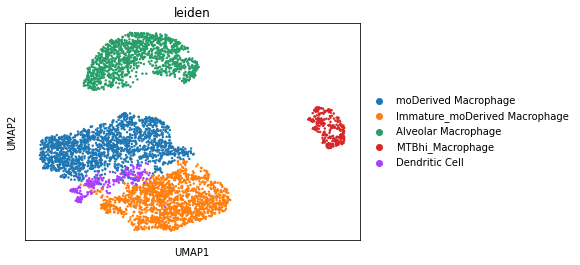

In [9]:
sc_data = sc.read_h5ad('/hpc/projects/data_lg/shoshana/Smartseq2nd/adataMNPNEW.h5ad')
sc_data = sc_data[sc_data.obs.leiden!='Neutrophil'].copy()
sc.pl.umap(sc_data,color = 'leiden')
sc_data.var_names = [i.replace('-','') for i in sc_data.var_names]

****2. Filter and QC the Vizgen h5ad file****

In [10]:
#make a table
experiment_df = pd.DataFrame(columns = ['experimentName','region','clipx'])
experiment_df.loc[0] = ['202305231432_TB-CTRL1-MB_VMSC02401','0',0]
experiment_df.loc[1] = ['202305231432_TB-CTRL1-MB_VMSC02401','1',0]
experiment_df.loc[2] = ['202305231432_TB-CTRL1-MB_VMSC02401','2',0]
experiment_df.loc[3] = ['202305251147_TB-CTRL2-MB_VMSC02401','0',0]
experiment_df.loc[4] = ['202305251147_TB-CTRL2-MB_VMSC02401','1',0]
experiment_df.loc[5] = ['202305261458_TB-TEST3-MB_VMSC02401','1',2000]
experiment_df.loc[7] = ['202309251210_20230925-RitwicqA-TB_VMSC02401','1',7500]
experiment_df.loc[8] = ['202309251210_20230925-RitwicqA-TB_VMSC02401','2',2500]
experiment_df.loc[9] = ['202310091253_AmandaS-TB-02_VMSC02401','0',0]
experiment_df.loc[10] = ['202310091253_AmandaS-TB-02_VMSC02401','1',0]
experiment_df.loc[11] = ['202310091253_AmandaS-TB-02_VMSC02401','2',0]
experiment_df.loc[12] = ['202310111428_RitwicqA-TB-4b_VMSC02401','1',0]
experiment_df.loc[13] = ['202310111428_RitwicqA-TB-4b_VMSC02401','2',0]
experiment_df

,experimentName,region,clipx
0,202305231432_TB-CTRL1-MB_VMSC02401,0,0
1,202305231432_TB-CTRL1-MB_VMSC02401,1,0
2,202305231432_TB-CTRL1-MB_VMSC02401,2,0
3,202305251147_TB-CTRL2-MB_VMSC02401,0,0
4,202305251147_TB-CTRL2-MB_VMSC02401,1,0
5,202305261458_TB-TEST3-MB_VMSC02401,1,2000
7,202309251210_20230925-RitwicqA-TB_VMSC02401,1,7500
8,202309251210_20230925-RitwicqA-TB_VMSC02401,2,2500
9,202310091253_AmandaS-TB-02_VMSC02401,0,0
10,202310091253_AmandaS-TB-02_VMSC02401,1,0


Set all variables

In [340]:
dataPath = '/hpc/projects/genomics/MERSCOPE/preprocessed_data'
processedDataPath = '/hpc/projects/genomics/MERSCOPE/postprocessed_data/ProcessedCounts/'

threshold = 300
std_threshold = 150 

layer = 'normalized_to_polyT'
binsize=100
perm_iterations=10000
pval_threshold = 0.001
stat_threshold = 0.15

marker_dict = {'High':['Nos2', 'H2Ab1', 'Irf1','C1qb'], 'Low':['Sparc','Jun','Lyve1'],'Neither':['Irf9','H2K1','Cxcr2']}

## Run all the code on each section

202305231432_TB-CTRL1-MB_VMSC02401 0 0
number of cells in unfiltered dataset:  64788
cells per region:  2    50074
1    12312
0     2402
Name: region, dtype: int64
saving figure
size of adata object:  (2402, 140)
Filtering complete: 1198 cells remaining out of 2402 original cells.


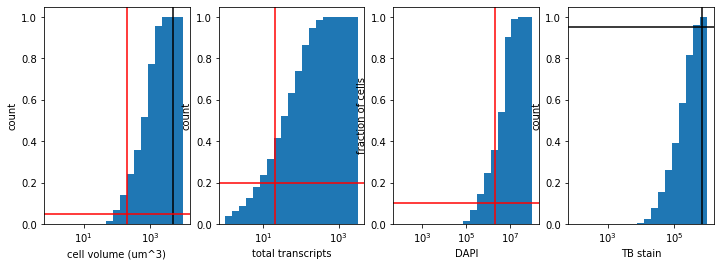

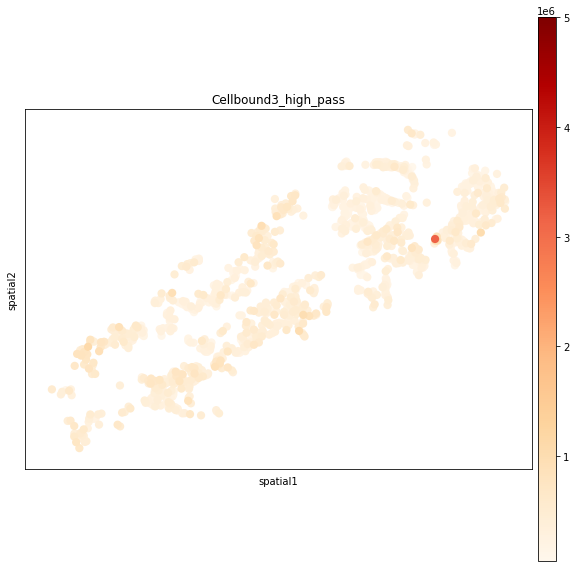

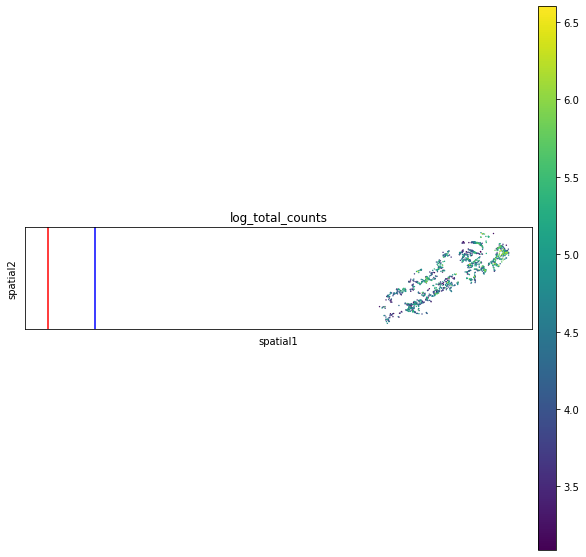

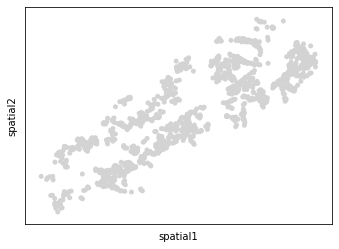

log normalized
scaled
calculating pcs
calculating umap
Scanpy processing complete.
  (0, 0)	1.0
  (0, 1)	2.0
z_level:  0
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:03<00:00, 748.33it/s] 


z_level:  1
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:03<00:00, 742.72it/s] 


z_level:  2
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:03<00:00, 747.74it/s] 


z_level:  3
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:03<00:00, 778.92it/s] 


z_level:  4
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:03<00:00, 785.16it/s] 


z_level:  5
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:02<00:00, 813.95it/s] 


z_level:  6
Dimensions of experiment are 26295 x 18621 in pixels.


100%|██████████| 2402/2402 [00:02<00:00, 982.05it/s]


(1198, 6)
(1198, 6) (1198, 140)
initial thresholding Low     1196
High       2
Name: TB_class_from_images, dtype: int64
with sd cutoff Low     1196
High       2
Name: TB_class_from_images, dtype: int64


100%|██████████| 2/2 [00:00<00:00, 3212.80it/s]


not enough cells to calculate min distance
not enough cells to calculate min distance
cells with TB signal above 5 million: (0, 140)


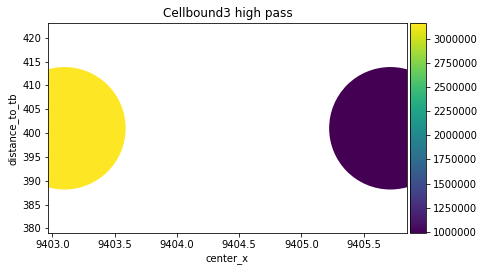

removed super high fluorescent cells Low     1196
High       2
Name: TB_class_from_images, dtype: int64
removed lone cells Low        1196
Removed       2
Name: TB_class_from_images, dtype: int64


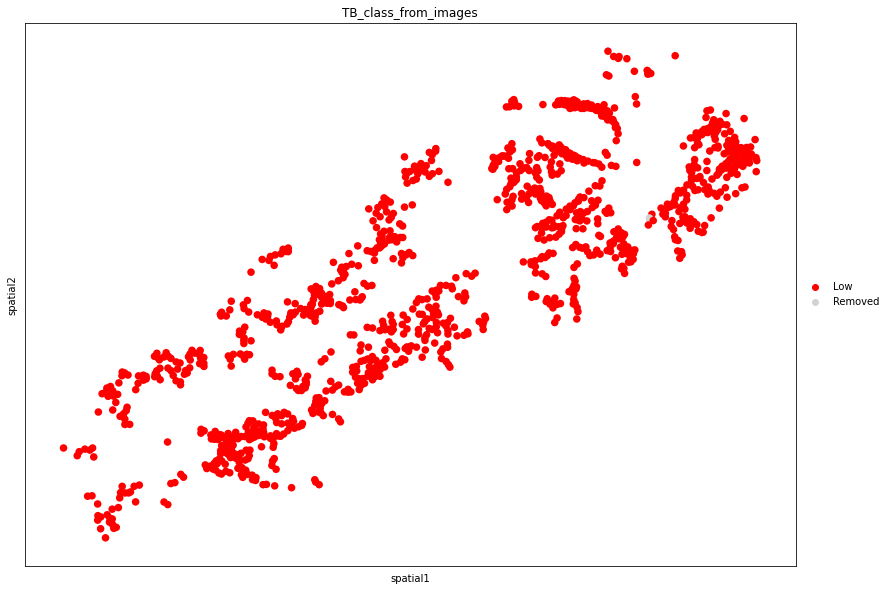

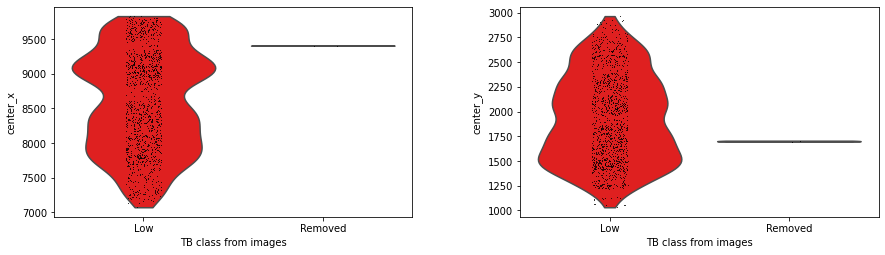

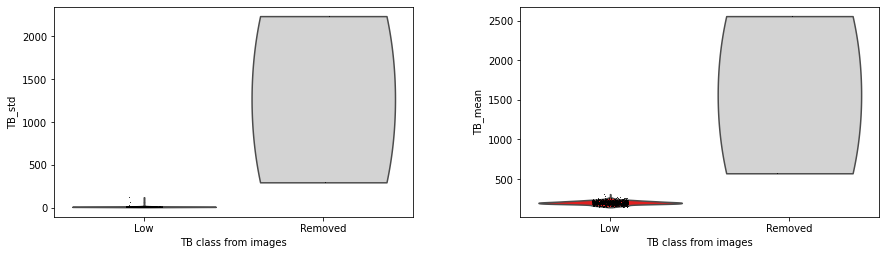

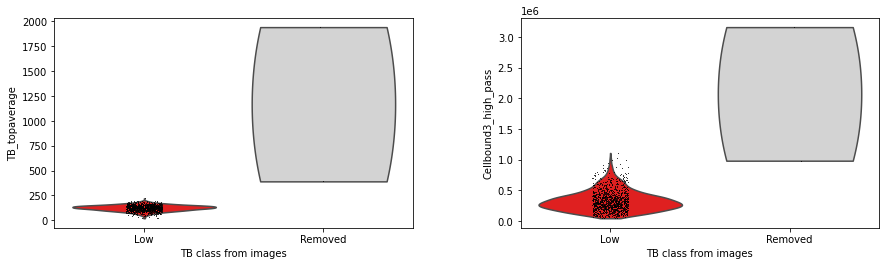

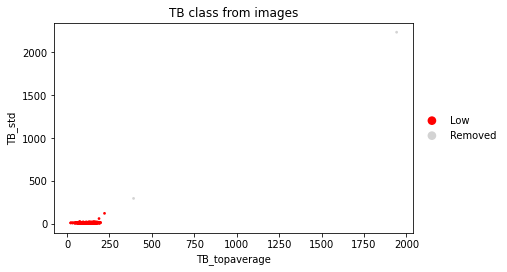

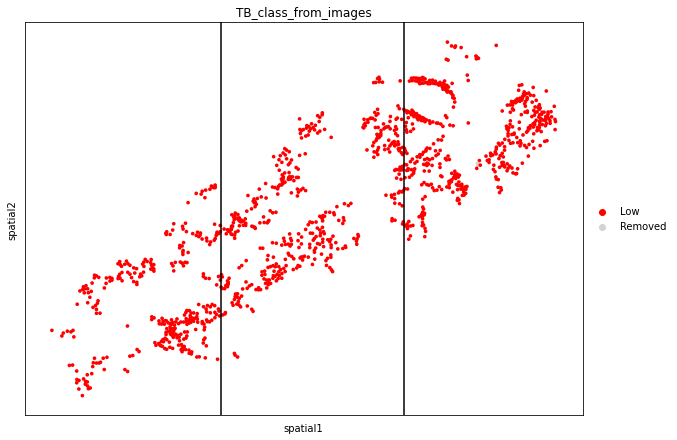

202305231432_TB-CTRL1-MB_VMSC02401 1 0
number of cells in unfiltered dataset:  64788
cells per region:  2    50074
1    12312
0     2402
Name: region, dtype: int64
saving figure
size of adata object:  (12312, 140)
Filtering complete: 8123 cells remaining out of 12312 original cells.


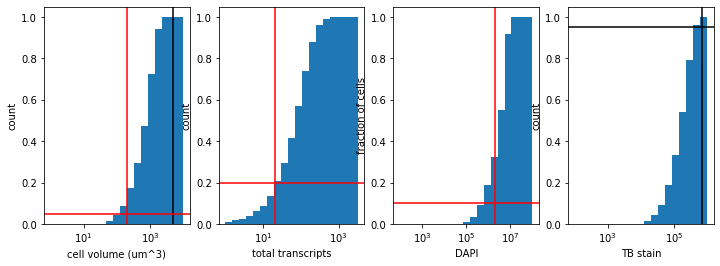

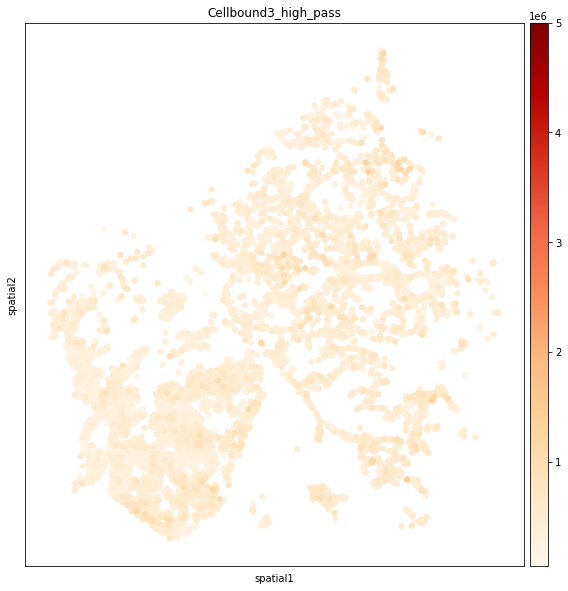

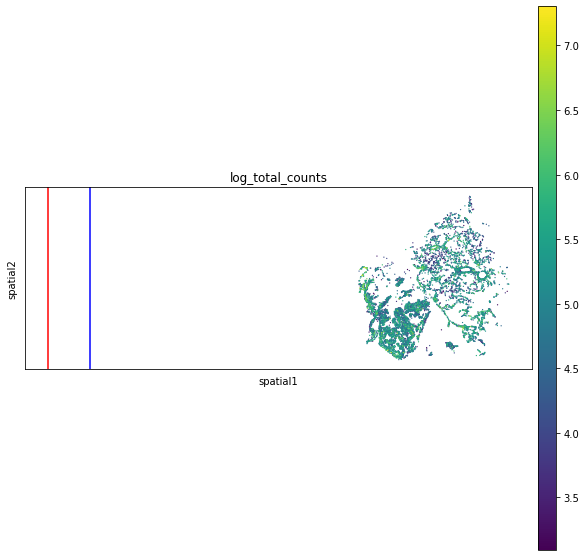

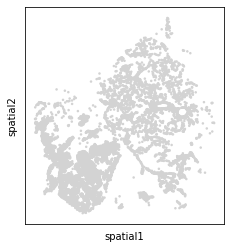

log normalized
scaled
calculating pcs
calculating umap
Scanpy processing complete.
  (0, 2)	1.0
  (0, 3)	1.0
z_level:  0
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:13<00:00, 912.86it/s] 


z_level:  1
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:13<00:00, 911.13it/s] 


z_level:  2
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:13<00:00, 942.05it/s] 


z_level:  3
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:13<00:00, 939.41it/s] 


z_level:  4
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:13<00:00, 927.77it/s] 


z_level:  5
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:13<00:00, 922.78it/s] 


z_level:  6
Dimensions of experiment are 33821 x 39035 in pixels.


100%|██████████| 12312/12312 [00:14<00:00, 852.64it/s]


(8123, 6)
(8123, 6) (8123, 140)
initial thresholding Low     8122
High       1
Name: TB_class_from_images, dtype: int64
with sd cutoff Low     8122
High       1
Name: TB_class_from_images, dtype: int64


100%|██████████| 1/1 [00:00<00:00, 3509.88it/s]


not enough cells to calculate min distance
cells with TB signal above 5 million: (0, 140)


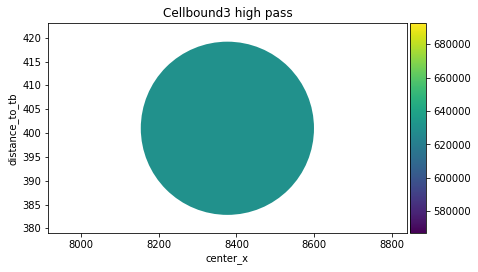

removed super high fluorescent cells Low     8122
High       1
Name: TB_class_from_images, dtype: int64
removed lone cells Low        8122
Removed       1
Name: TB_class_from_images, dtype: int64


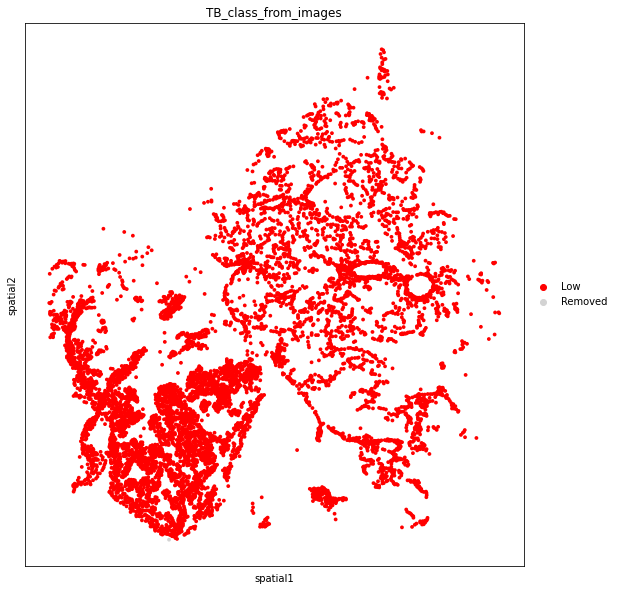

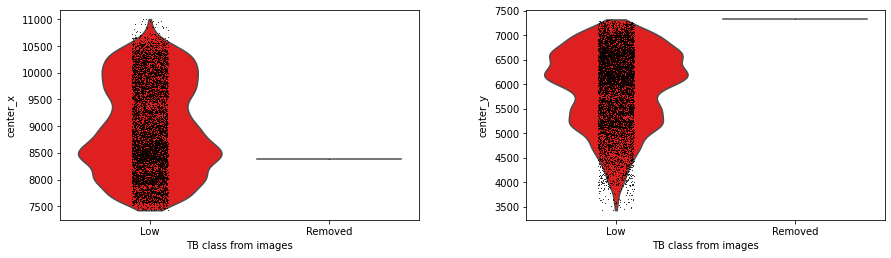

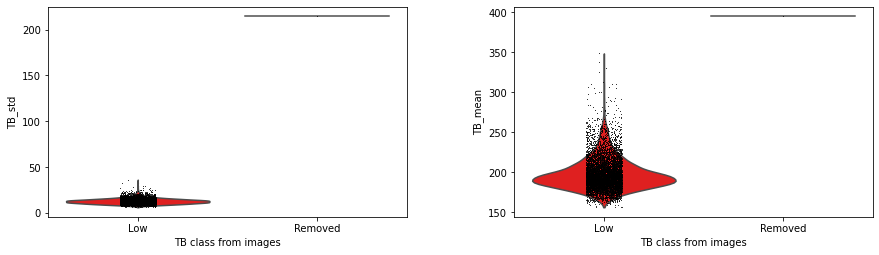

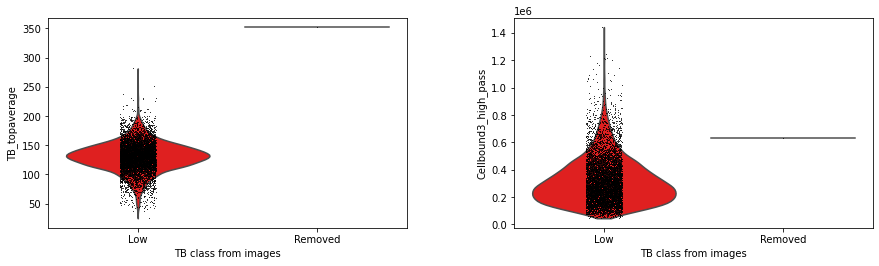

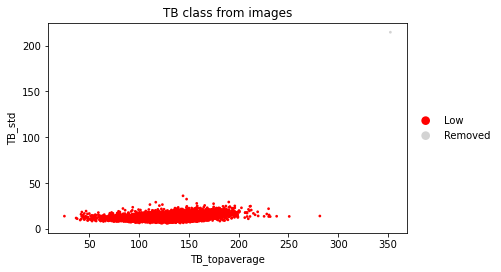

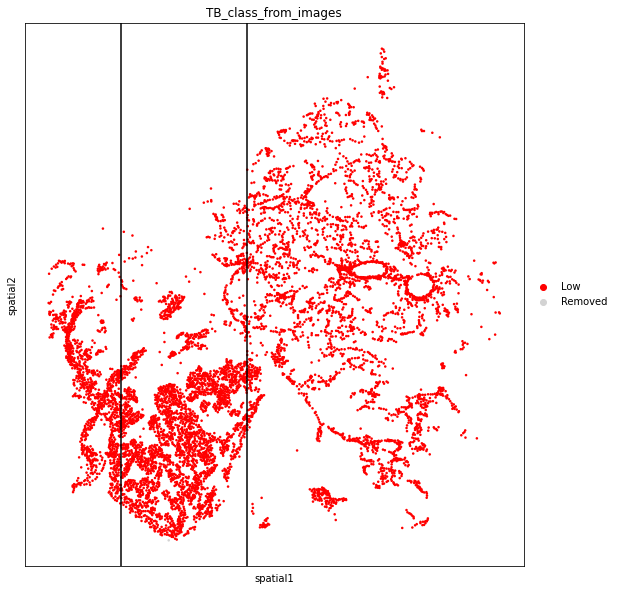

202305231432_TB-CTRL1-MB_VMSC02401 2 0
number of cells in unfiltered dataset:  64788
cells per region:  2    50074
1    12312
0     2402
Name: region, dtype: int64
saving figure
size of adata object:  (50074, 140)
Filtering complete: 39398 cells remaining out of 50074 original cells.


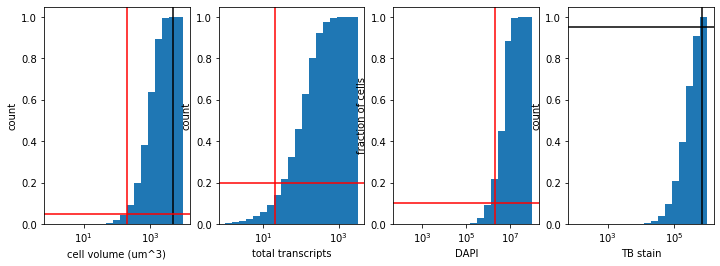

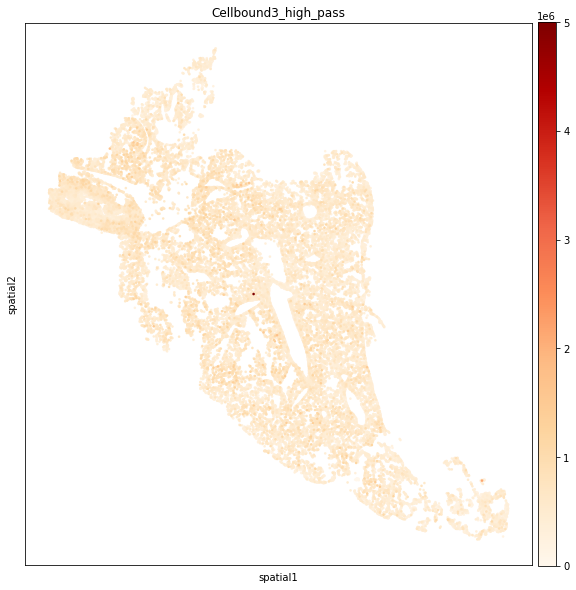

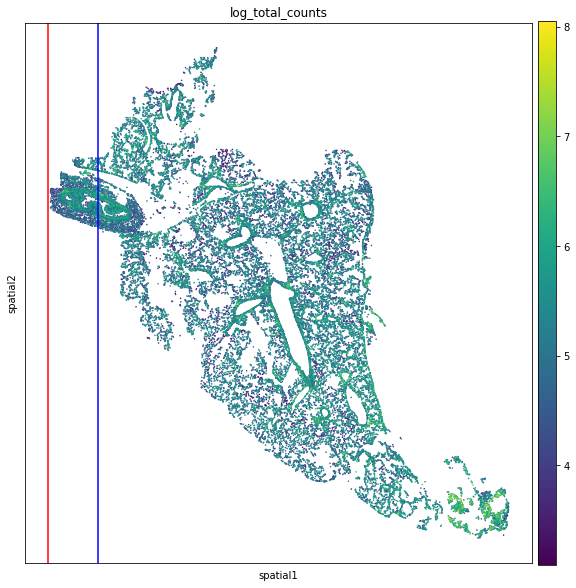

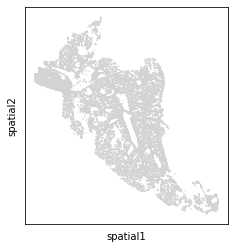

log normalized
scaled
calculating pcs
calculating umap
Scanpy processing complete.
  (0, 0)	7.0
  (0, 1)	22.0
  (0, 2)	2.0
  (0, 3)	5.0
z_level:  0
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:00<00:00, 821.89it/s] 


z_level:  1
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:00<00:00, 833.22it/s] 


z_level:  2
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:00<00:00, 827.44it/s] 


z_level:  3
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:01<00:00, 819.92it/s] 


z_level:  4
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:03<00:00, 784.94it/s] 


z_level:  5
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:02<00:00, 803.41it/s] 


z_level:  6
Dimensions of experiment are 85101 x 89777 in pixels.


100%|██████████| 50074/50074 [01:31<00:00, 545.99it/s]


(39398, 6)
(39398, 6) (39398, 140)
initial thresholding Low     39395
High        3
Name: TB_class_from_images, dtype: int64
with sd cutoff Low     39395
High        3
Name: TB_class_from_images, dtype: int64


100%|██████████| 3/3 [00:00<00:00, 2617.62it/s]


cells with TB signal above 5 million: (1, 140)


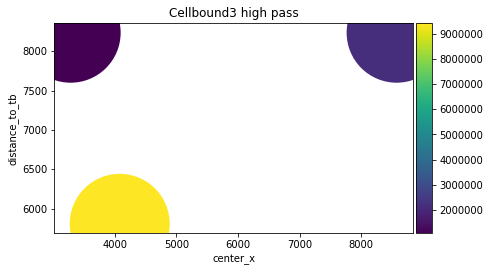

removed super high fluorescent cells Low        39395
High           2
Removed        1
Name: TB_class_from_images, dtype: int64
removed lone cells Low        39395
Removed        3
Name: TB_class_from_images, dtype: int64


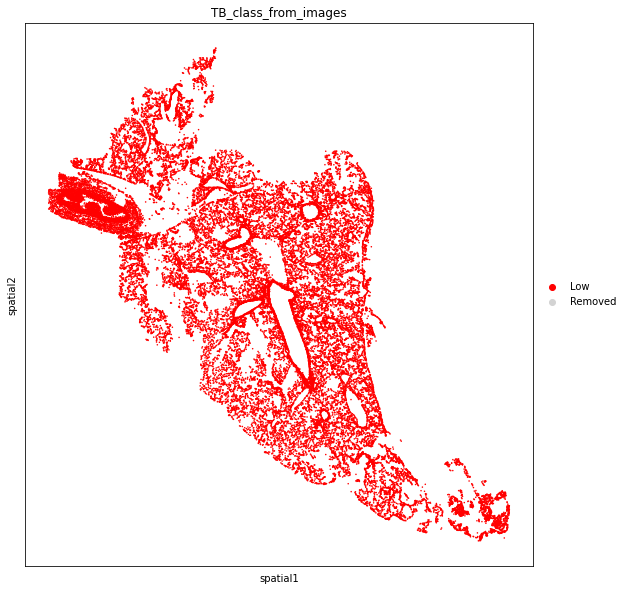

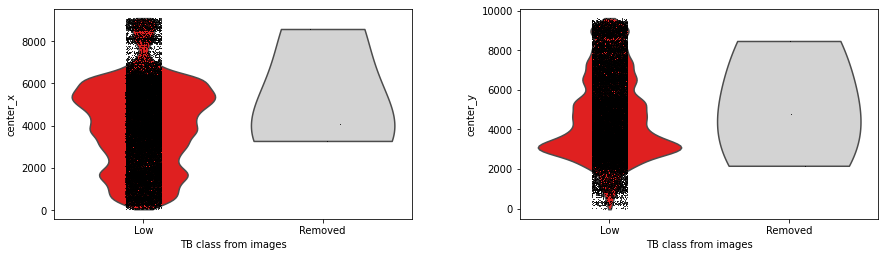

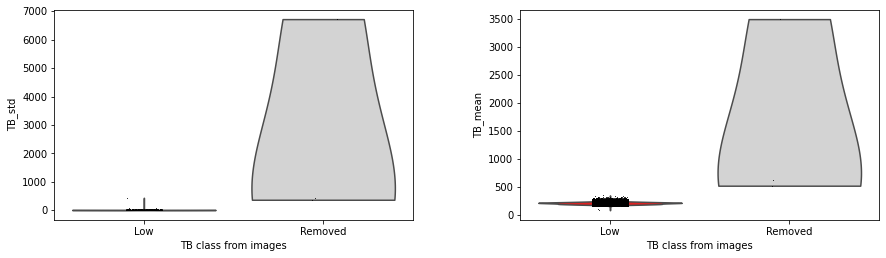

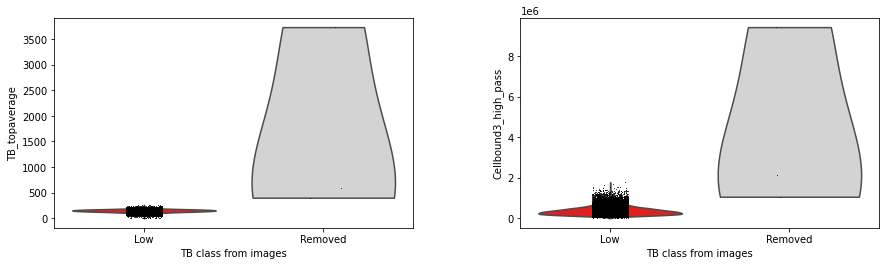

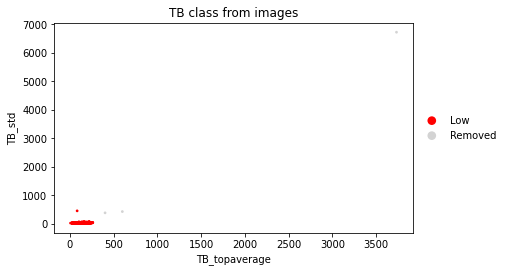

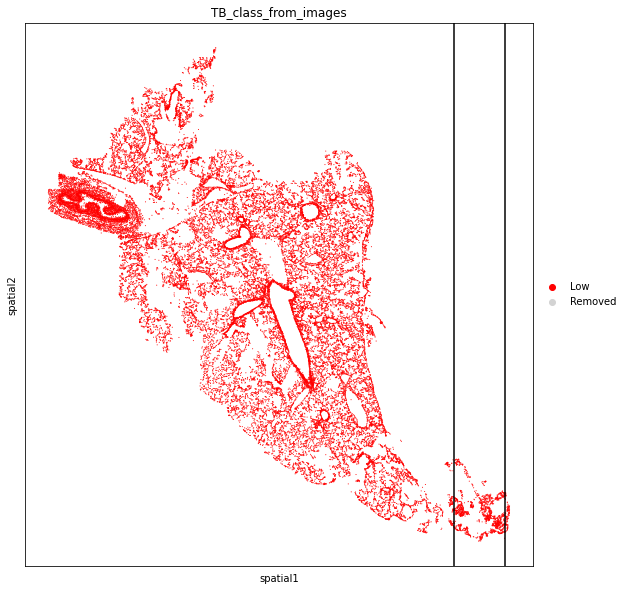

202305251147_TB-CTRL2-MB_VMSC02401 0 0
number of cells in unfiltered dataset:  93038
cells per region:  1    70090
0    22948
Name: region, dtype: int64
saving figure
size of adata object:  (22948, 140)
Filtering complete: 16531 cells remaining out of 22948 original cells.


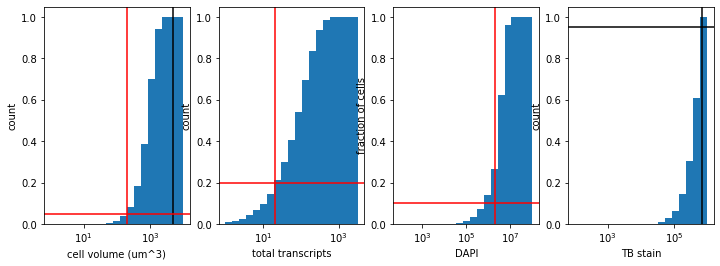

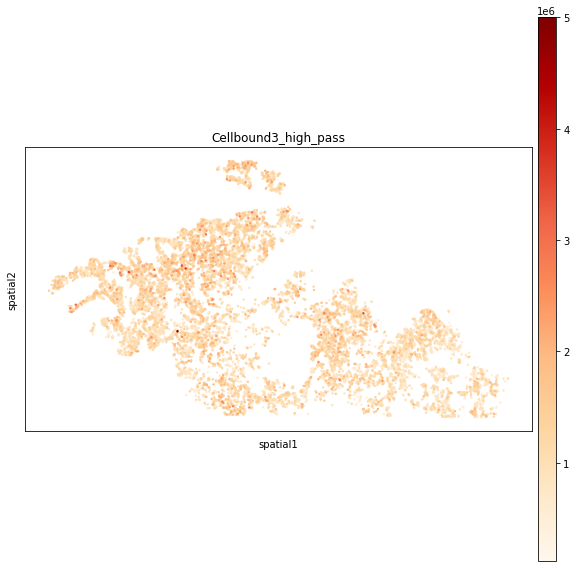

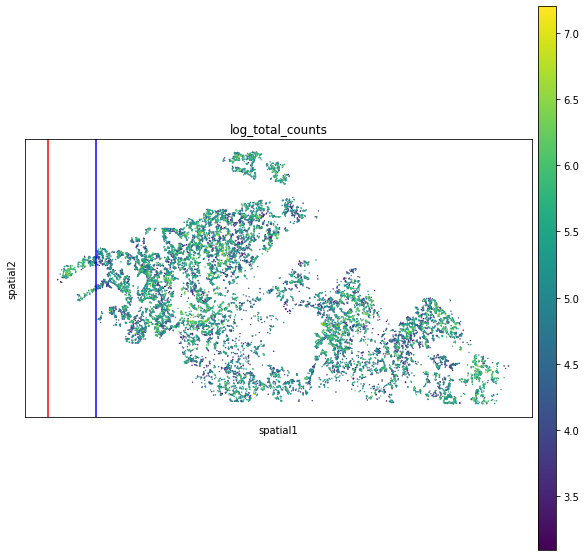

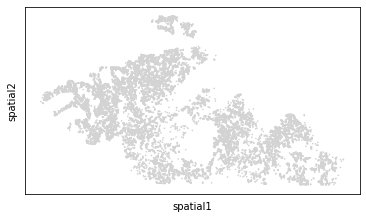

log normalized
scaled
calculating pcs
calculating umap
Scanpy processing complete.
  (0, 0)	6.0
  (0, 1)	1.0
  (0, 2)	2.0
  (0, 3)	8.0
z_level:  0
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 22948/22948 [00:32<00:00, 709.43it/s] 


z_level:  1
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 22948/22948 [00:31<00:00, 730.98it/s] 


z_level:  2
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 22948/22948 [00:32<00:00, 703.12it/s] 


z_level:  3
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 22948/22948 [00:31<00:00, 726.49it/s] 


z_level:  4
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 22948/22948 [00:31<00:00, 736.06it/s] 


z_level:  5
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 22948/22948 [00:30<00:00, 749.98it/s] 


z_level:  6
Dimensions of experiment are 89165 x 48933 in pixels.


100%|██████████| 140/140 [32:32<00:00, 13.94s/it]


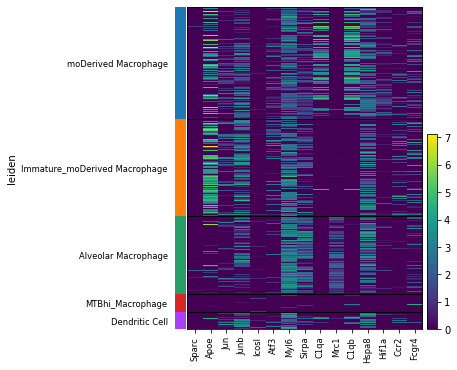

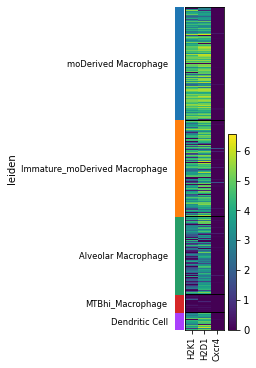

up near TB:  15 
down near TB: 3


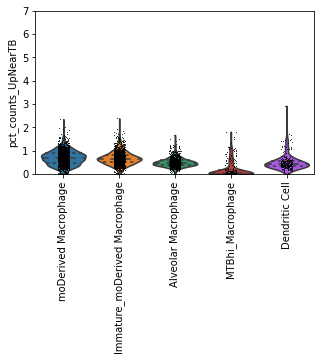

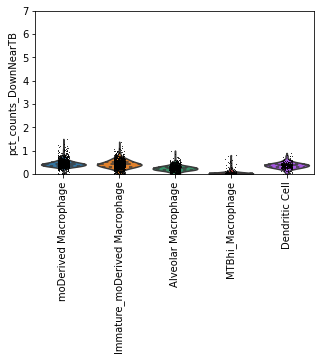

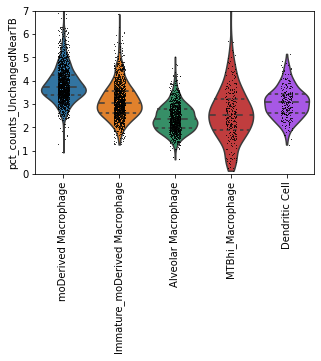

0.0003
202305251147_TB-CTRL2-MB_VMSC02401 1 0
number of cells in unfiltered dataset:  93038
cells per region:  1    70090
0    22948
Name: region, dtype: int64
saving figure
size of adata object:  (70090, 140)
Filtering complete: 54443 cells remaining out of 70090 original cells.


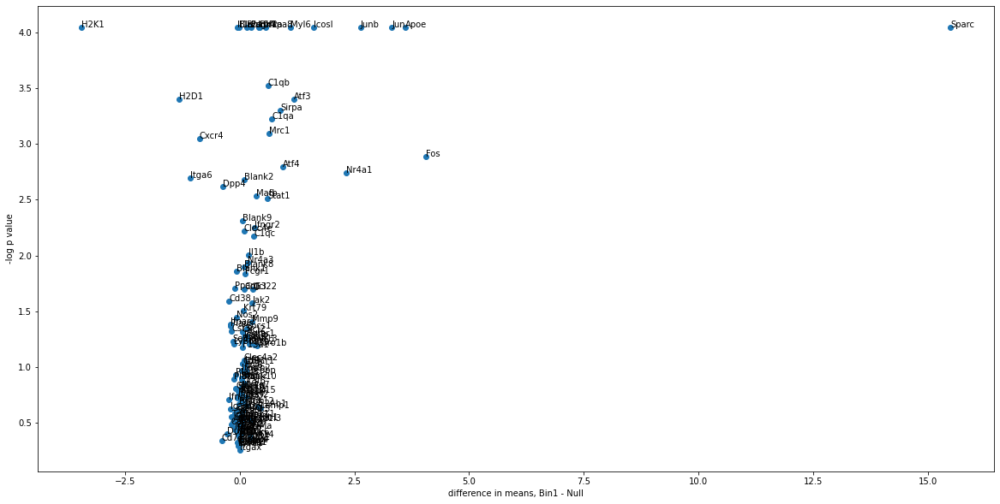

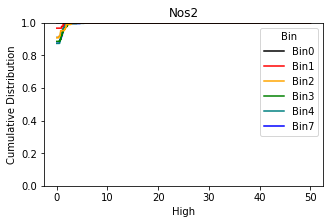

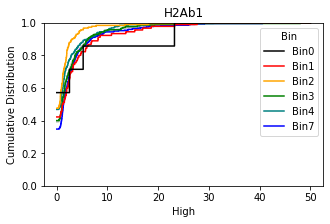

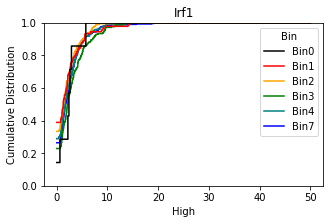

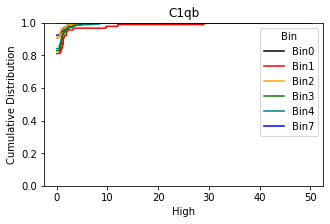

...

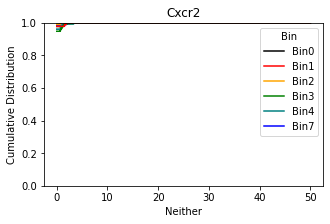

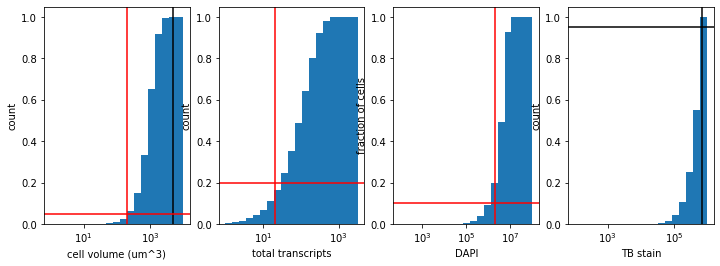

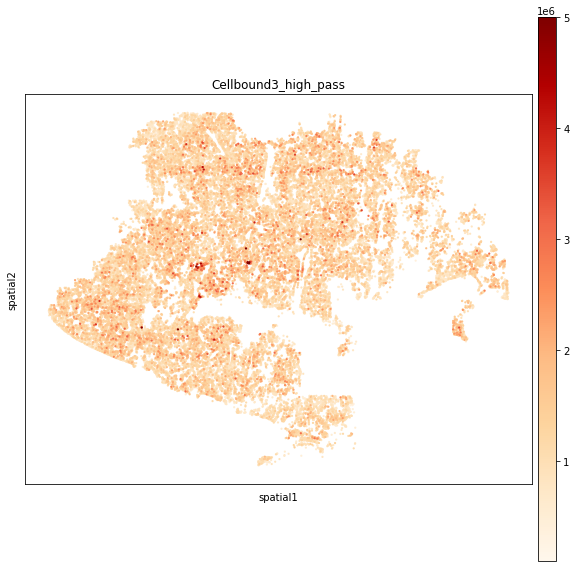

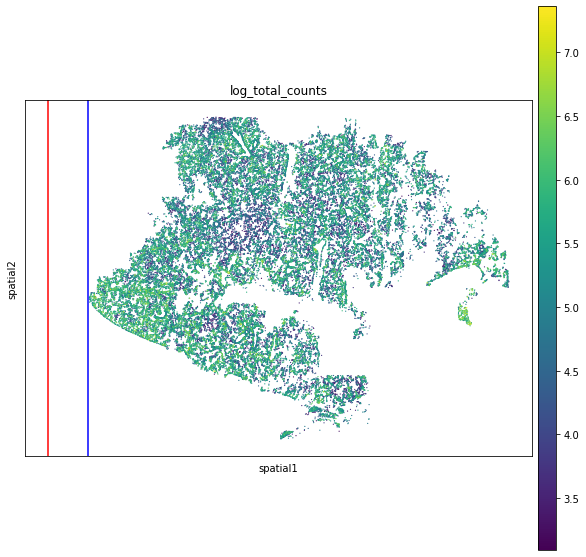

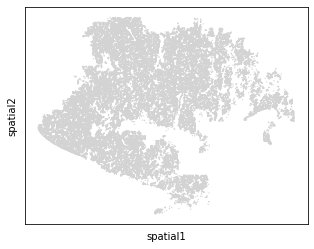

log normalized
scaled
calculating pcs
calculating umap
Scanpy processing complete.

z_level:  0
Dimensions of experiment are 98691 x 74668 in pixels.


100%|██████████| 70090/70090 [01:33<00:00, 746.42it/s] 


z_level:  1
Dimensions of experiment are 98691 x 74668 in pixels.


100%|██████████| 70090/70090 [01:33<00:00, 745.66it/s]


z_level:  2
Dimensions of experiment are 98691 x 74668 in pixels.


100%|██████████| 70090/70090 [01:34<00:00, 737.96it/s]


z_level:  3
Dimensions of experiment are 98691 x 74668 in pixels.


 56%|█████▌    | 39061/70090 [00:52<00:34, 897.31it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 96272/96272 [01:57<00:00, 820.45it/s] 


z_level:  2
Dimensions of experiment are 70690 x 93394 in pixels.


100%|██████████| 96272/96272 [02:06<00:00, 761.59it/s] 


z_level:  3
Dimensions of experiment are 70690 x 93394 in pixels.


100%|██████████| 96272/96272 [02:01<00:00, 792.85it/s] 


z_level:  4
Dimensions of experiment are 70690 x 93394 in pixels.


 15%|█▍        | 14271/96272 [00:18<01:28, 926.99it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 49428/49428 [00:56<00:00, 870.24it/s] 


z_level:  5
Dimensions of experiment are 79985 x 34018 in pixels.


100%|██████████| 49428/49428 [00:58<00:00, 851.22it/s] 


z_level:  6
Dimensions of experiment are 79985 x 34018 in pixels.


100%|██████████| 49428/49428 [01:27<00:00, 564.08it/s]


(30054, 6)
(30054, 6) (30054, 140)
initial thresholding Low     29779
High      275
Name: TB_class_from_images, dtype: int64
with sd cutoff Low        29779
High          47
Removed      228
Name: TB_class_from_images, dtype: int64


100%|██████████| 47/47 [00:00<00:00, 588.27it/s]


cells with TB signal above 5 million: (0, 140)


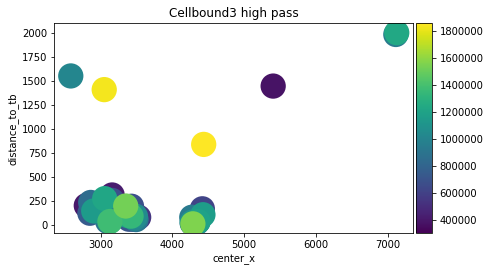

removed super high fluorescent cells Low        29779
High          47
Removed      228
Name: TB_class_from_images, dtype: int64
removed lone cells Low        29779
High          41
Removed      234
Name: TB_class_from_images, dtype: int64


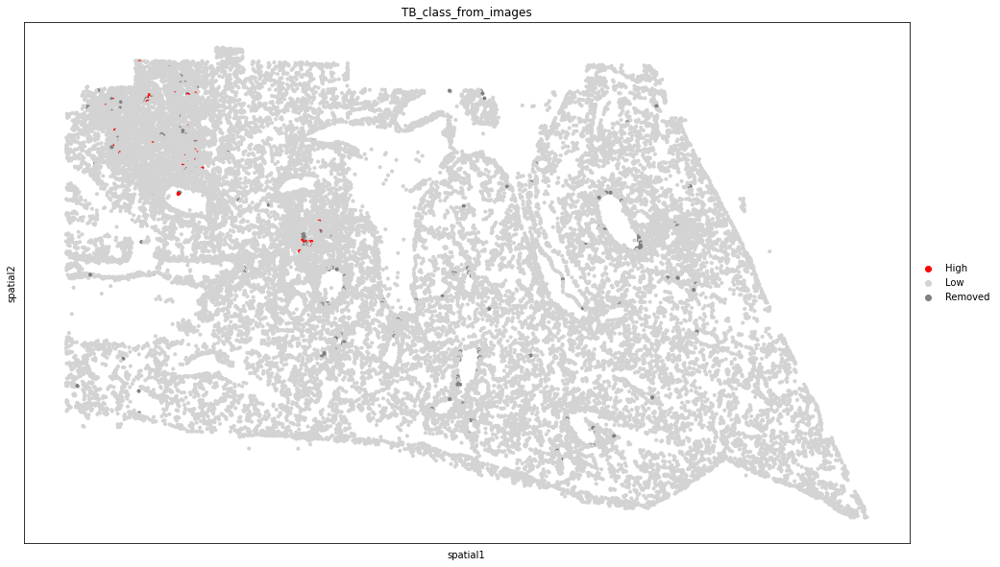

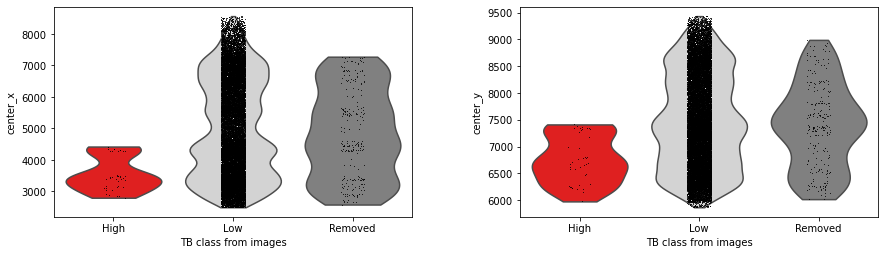

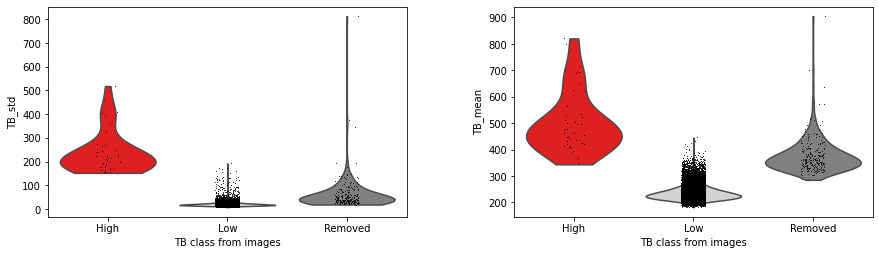

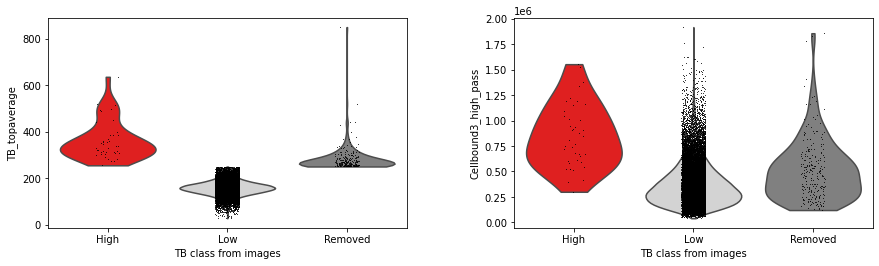

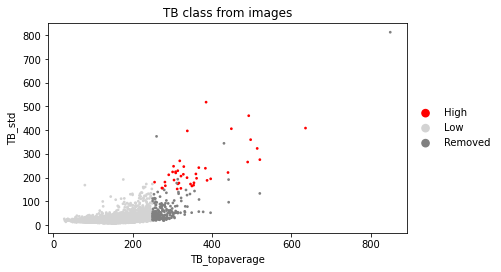

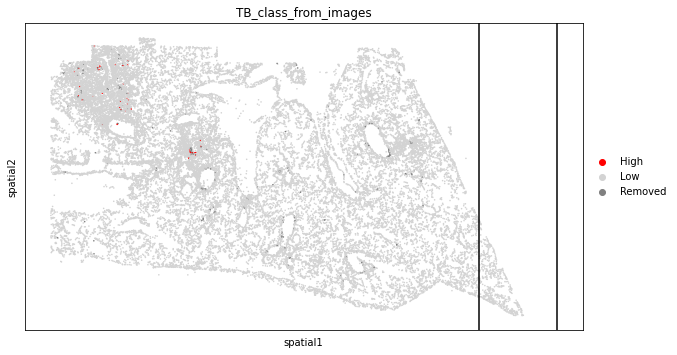

100%|██████████| 30054/30054 [00:44<00:00, 672.26it/s]


number of cells per bin:  Null    20180
Bin1     3345
Bin2     3015
Bin3     1509
Bin4     1172
Bin7      792
Bin0       41
Name: Bin, dtype: int64


100%|██████████| 140/140 [58:26<00:00, 25.05s/it]


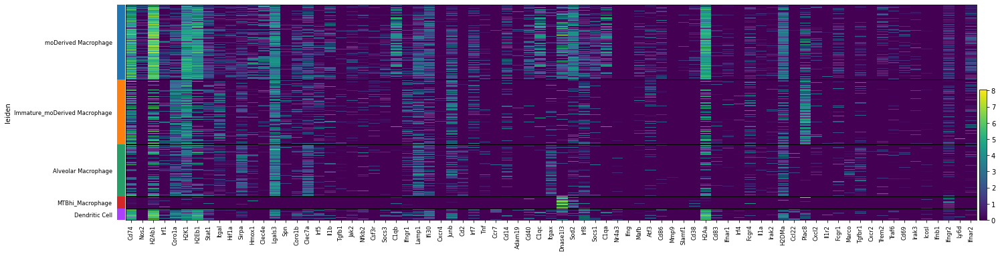

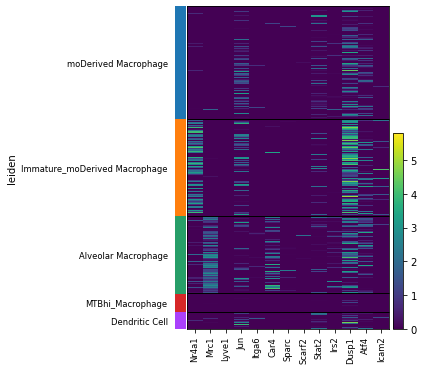

up near TB:  77 
down near TB: 13


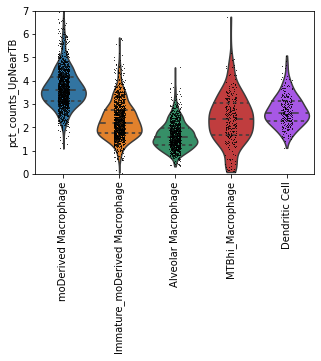

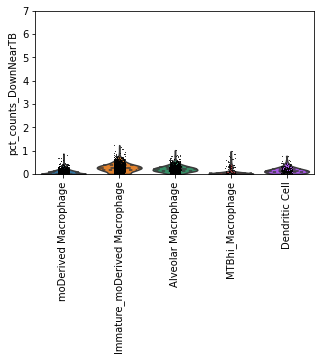

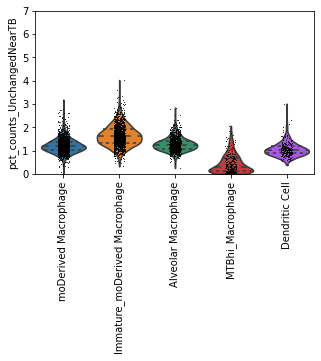

0.0001
202310091253_AmandaS-TB-02_VMSC02401 0 0
number of cells in unfiltered dataset:  173094
cells per region:  1    116777
2     43631
0     12686
Name: region, dtype: int64
saving figure
size of adata object:  (12686, 140)
Filtering complete: 9840 cells remaining out of 12686 original cells.


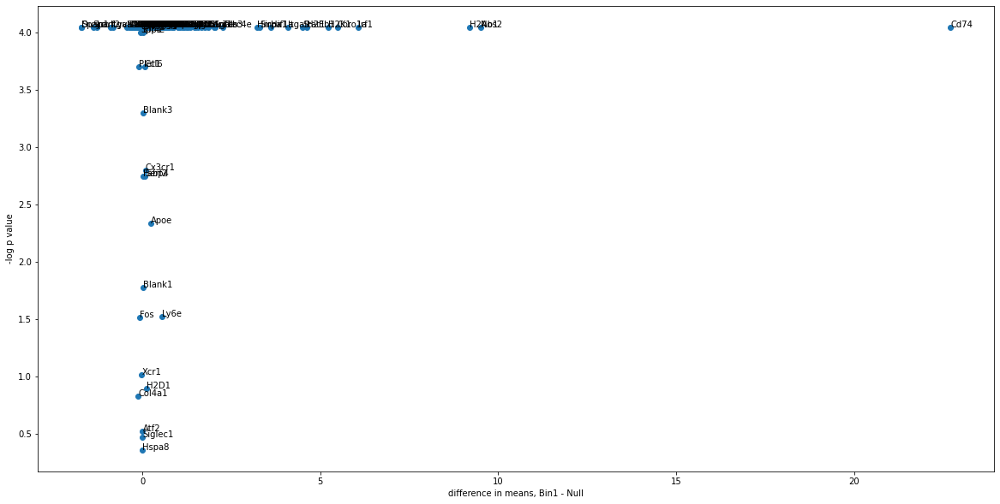

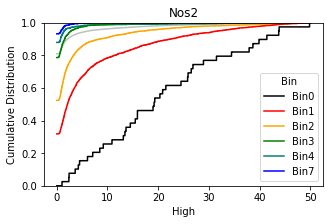

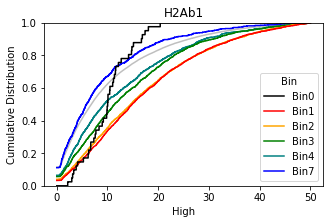

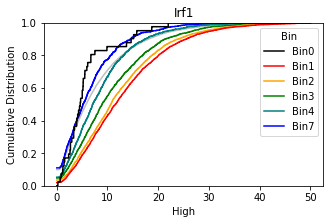

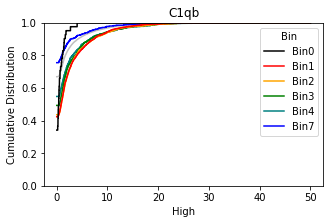

...

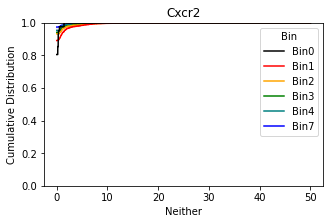

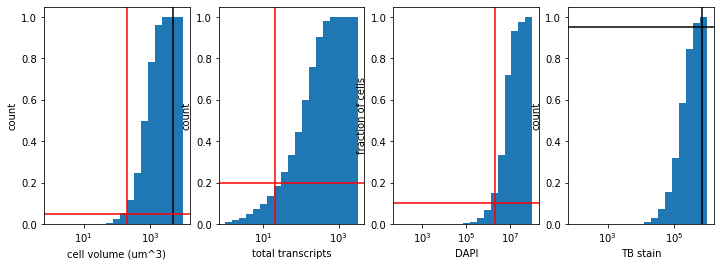

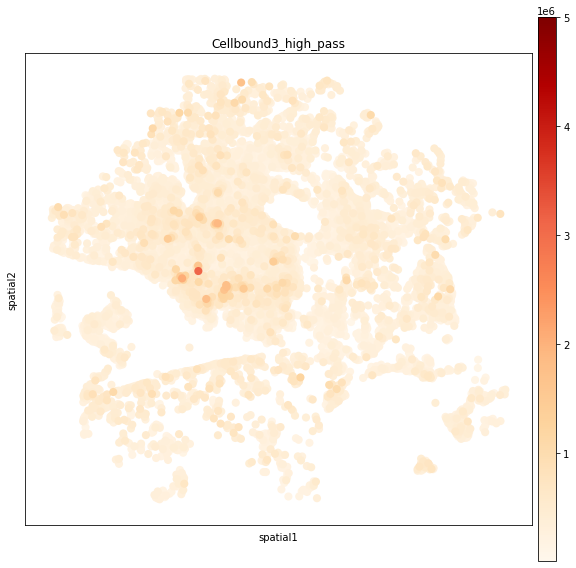

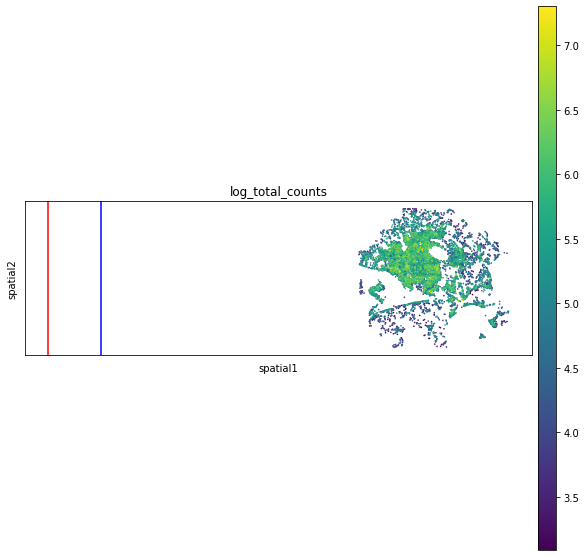

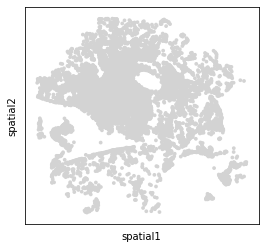

log normalized
scaled
calculating pcs
calculating umap
Scanpy processing complete.
  (0, 0)	2.0
  (0, 3)	1.0
  (0, 4)	1.0
z_level:  0
Dimensions of experiment are 26231 x 24417 in pixels.


 99%|█████████▊| 12517/12686 [00:14<00:00, 862.91it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 86%|████████▌ | 99845/116777 [05:25<01:20, 210.32it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 74715/74715 [01:28<00:00, 843.53it/s] 


z_level:  5
Dimensions of experiment are 71068 x 78221 in pixels.


100%|██████████| 74715/74715 [01:28<00:00, 844.07it/s] 


z_level:  6
Dimensions of experiment are 71068 x 78221 in pixels.


 65%|██████▌   | 48719/74715 [01:35<01:07, 385.87it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 95794/95794 [04:49<00:00, 331.31it/s]


(71896, 6)
(71896, 6) (71896, 140)
initial thresholding Low     71466
High      430
Name: TB_class_from_images, dtype: int64
with sd cutoff Low        71466
High         287
Removed      143
Name: TB_class_from_images, dtype: int64


100%|██████████| 287/287 [00:02<00:00, 107.95it/s]


cells with TB signal above 5 million: (1, 140)


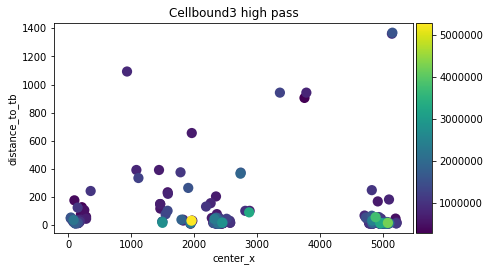

removed super high fluorescent cells Low        71466
High         286
Removed      144
Name: TB_class_from_images, dtype: int64
removed lone cells Low        71466
Removed      151
High         279
Name: TB_class_from_images, dtype: int64


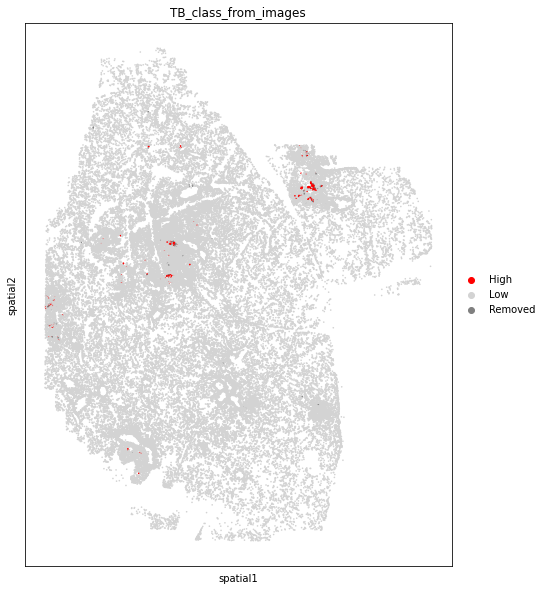

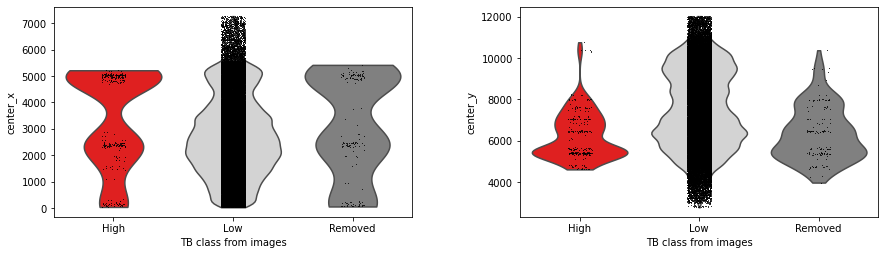

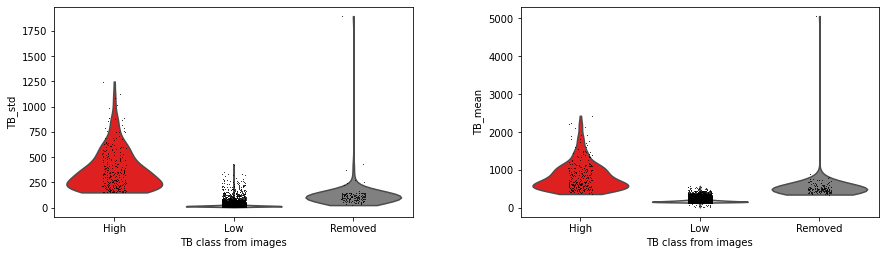

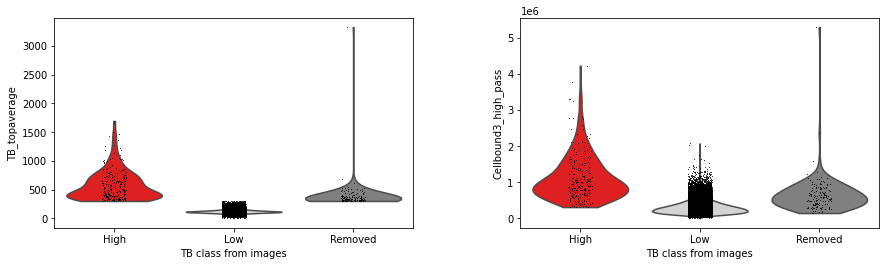

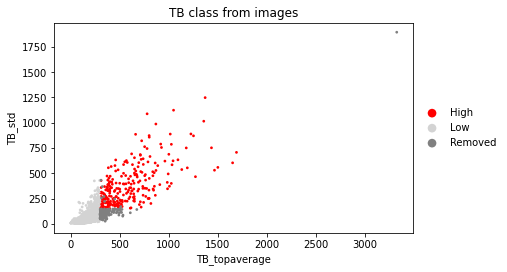

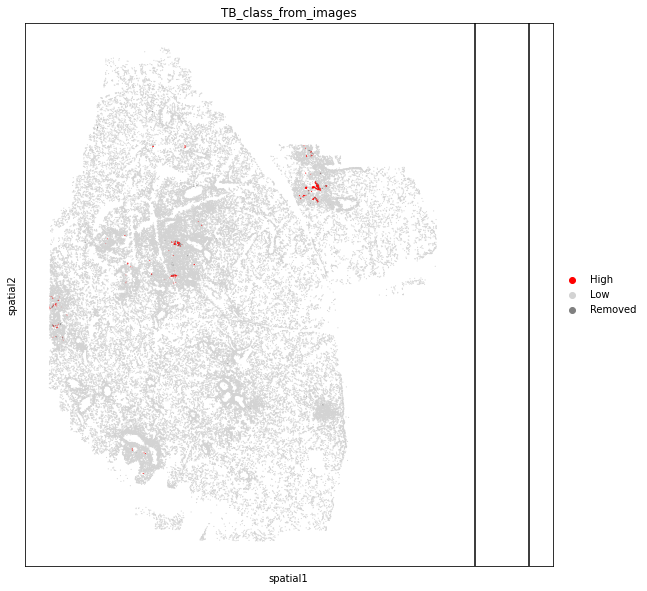

 20%|██        | 14459/71896 [02:09<08:38, 110.67it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [341]:
import warnings
warnings.filterwarnings('ignore')

for jloc in experiment_df.index:
    experimentName = experiment_df.experimentName[jloc]
    region = experiment_df.region[jloc]
    clipx = experiment_df.clipx[jloc]
    print(experimentName, region, clipx)

    filenames = os.listdir(processedDataPath+experimentName)
    filename = [i for i in filenames if i.endswith('.h5ad')][0]
    
    ## Process the vizgen adata file and filter out damaged tissue
    adata = load_vizgen_h5ad(processedDataPath = processedDataPath,experimentName=experimentName, filename = filename, region=region,
                    min_volume=200, max_volume=5000, min_counts=20, min_dapi = 2000000, TB_threshold = 700000)
    adata = filter_h5ad(adata)
    show_spatial_plots(adata,clipx, experimentName,region)

    #remove any damage
    adata = adata[adata.obs.center_x>clipx].copy()
    if experimentName == '202309251210_20230925-RitwicqA-TB_VMSC02401' and region=='1':
        adata = adata[adata.obs.center_y<6500].copy()
    sc.pl.spatial(adata,spot_size=50)
    adata = sc_preprocess(adata)
    
    ## Load in the image data and calculate metrics for each segment using the antibody information
    
    #collect data from images
    df = load_tb_image_information(dataPath=dataPath,experimentName=experimentName,region=region)
    #calculate average signal per cell for each metric
    avg_signal_df = make_average_gdf(df,adata)
    print(avg_signal_df.shape, adata.shape)

    #Define TB positive cells
    adata = assign_tb_pos_cells(adata,avg_signal_df, threshold,std_threshold,experimentName, region)

    #normalize count data to polyA signal per cell
    adata.layers['normalized_to_polyT'] = adata.layers['counts']/np.array(adata.obs.PolyT_high_pass).reshape(-1,1)*np.mean(adata.obs.PolyT_high_pass)
    adata.layers['normalized_to_polyT'] = sparse.csr_matrix(adata.layers['normalized_to_polyT'])
        
    #skip these parts if there are not TB+ cells
    if 'High' in set(adata.obs.TB_class_from_images):
        
        adata = calculate_distance_to_tb(adata)
        adata.obs.distance_to_tb = adata.obs.distance_to_tb.astype('float')

        adata_df, df_results = permutation_test_for_tb_loc(adata,layer=layer,binsize=binsize,perm_iterations=perm_iterations)
        sc_data = plot_tb_altered_transcripts(sc_data,pval_threshold, stat_threshold, df_results,experimentName, region,perm_iterations)

        plot_cumulative_dist(marker_dict,adata_df,experimentName,region,ymax=50)
    adata.write_h5ad('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Annotated_h5ad/'+experimentName+'_region'+str(region)+'_Annotated.h5ad')
    gc.collect()

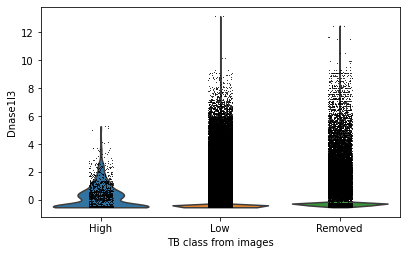

In [37]:
#show Dnase1l3 expression 
sc.pl.violin(adata,'Dnase1l3',groupby='TB_class_from_images')

In [98]:
adata_tb = adata[adata.obs.Condition=='TB'].copy()
print('Dnase1l3')
for group in list(set(adata_tb.obs.grouped_distance_to_tb)):
    far = adata_tb[adata_tb.obs.grouped_distance_to_tb==group,'Dnase1l3']
    #calculate percent with positive Dnase1l3 counts
    original = far.shape[0]
    pos = far[far.layers['normalized_to_polyT']>1].shape[0]
    print(group,pos/original*100)
 

print('Nos2')
for group in list(set(adata_tb.obs.grouped_distance_to_tb)):
    far = adata_tb[adata_tb.obs.grouped_distance_to_tb==group,'Nos2']
    #calculate percent with positive Dnase1l3 counts
    original = far.shape[0]
    pos = far[far.layers['normalized_to_polyT']>1].shape[0]
    print(group,pos/original*100)
    

Dnase1l3
within_200_um 15.331220627689648
TBPositive 9.068627450980392
within_1_mm 8.081931644680914
far 4.775433390032934
Nos2
within_200_um 22.494013000342115
TBPositive 46.07843137254902
within_1_mm 4.342732436421771
far 2.198843690058268


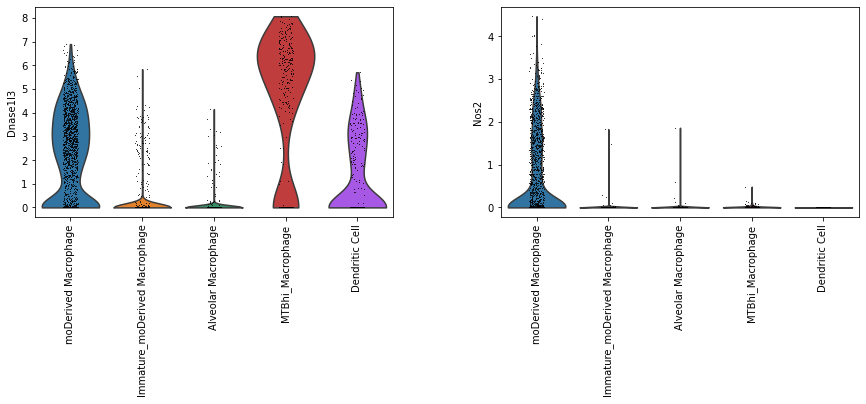

In [96]:
sc.pl.violin(sc_data,['Dnase1l3','Nos2'],groupby='leiden',rotation=90)

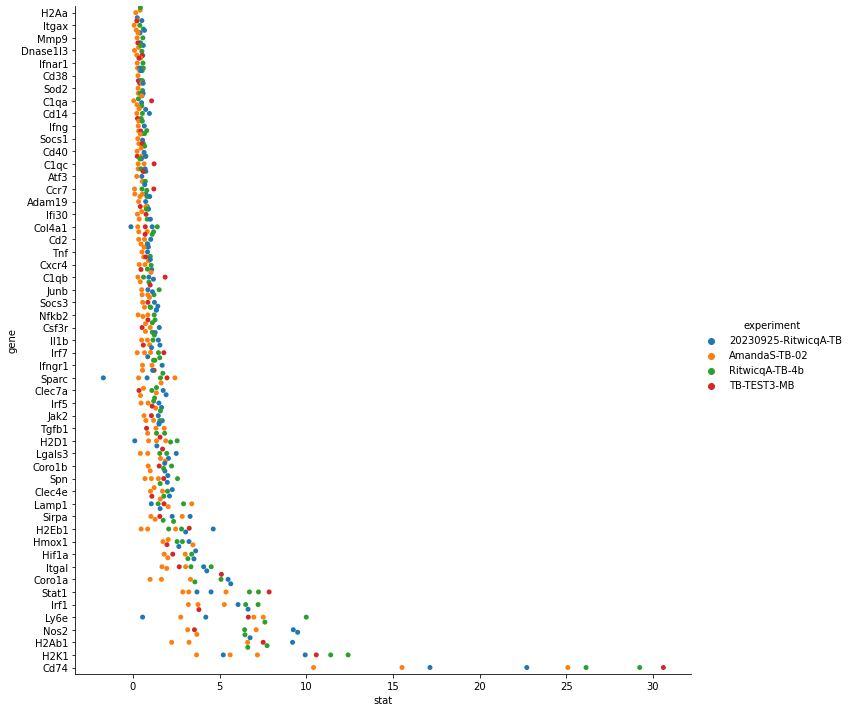

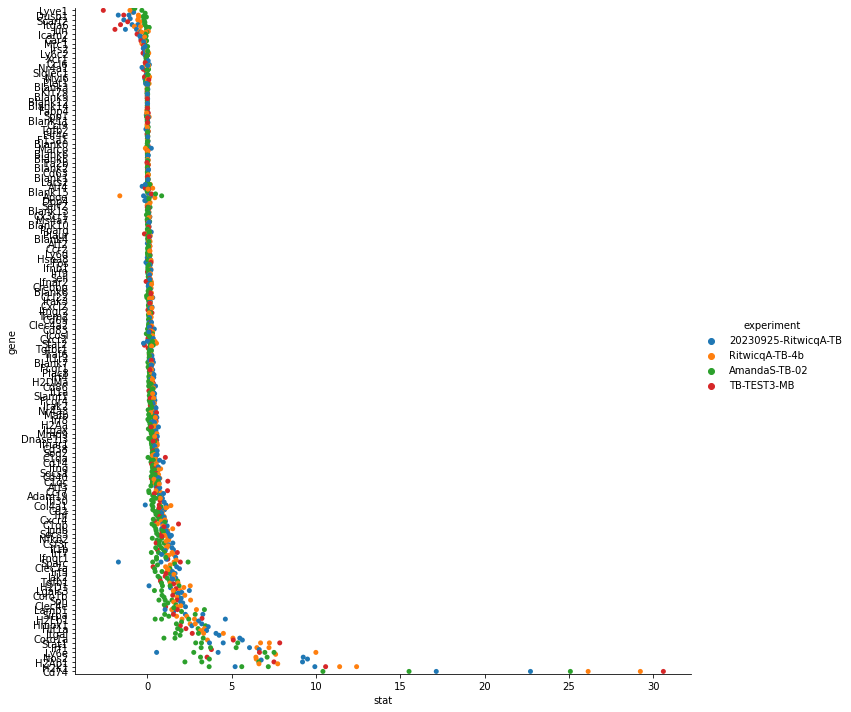

In [491]:
#load in final df_results and find consensus genes, plot top ones with a dot for each replicate, show consensus on violin plots for smartseq data
#for cumulative distribution plots, show on total dataset

#1. make a file with all the genes and all the data points


folder = '/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/new_individual/tb/'
df = pd.DataFrame(columns = ['gene','stat','p_value','experiment','region'])

for file in os.listdir(folder):
    if not file.endswith('.csv'):
        continue
    experiment = file.split('_')[1]
    region = file.split('_')[3].split('.')[0]
    
    stats = pd.read_csv(folder+file)
    stats.columns = ['gene','stat','remove','p_value']
    del stats['remove']
    stats['experiment'] = experiment
    stats['region'] = region

    df = pd.concat([df, stats],ignore_index=True)

#plot each gene using a swarmplot
average_df = pd.DataFrame(columns=['average'])
for gene in list(set(df.gene)):
    mean = np.mean(df.loc[df.gene==gene].stat)
    average_df.loc[gene] = mean
    
average_df = average_df.sort_values('average')
gene_list = list(average_df.index)

df['average_value'] = 0
for gene in average_df.index:
    df.loc[df.gene==gene,'average_value']=average_df.loc[gene,'average']
df
df = df.sort_values('average_value')
df.p_value[df.p_value>0.0001] = 0.1
df.p_value[df.p_value<0.0001] = 0.0001
df.p_value.value_counts()

df.to_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/statsAllTB_individualReplicates-excludingTB.csv')
ax = sns.catplot(data=df.iloc[700:1125], 
                 x="stat", 
                 y="gene", 
                 hue="experiment", 
                 #palette = ['red','orange','lightgrey'],
                 kind="swarm",
                 aspect=1,
                 height=10,
                 row_order=gene_list)
plt.savefig("/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/new/replicate_samplestat_experiment_last700samples-excludingtb.pdf", format='pdf')
plt.show()



ax = sns.catplot(data=df, 
                 x="stat", 
                 y="gene", 
                 hue="experiment", 
                 #palette = ['red','orange','lightgrey'],
                 kind="swarm",
                 aspect=1,
                 height=10,
                 row_order=gene_list)

plt.savefig("/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/new/replicate_samplestat_experiment-withoutTBcells.pdf", format='pdf')
plt.show()

In [499]:
gene_list

['Lyve1',
 'Dusp1',
 'Scarf2',
 'Itga6',
 'Jun',
 'Icam2',
 'Car4',
 'Mrc1',
 'Irs2',
 'Ly6c2',
 'Xcr1',
 'Ccl6',
 'Nr4a1',
 'Siglec1',
 'Myl6',
 'Plet1',
 'Blank3',
 'Krt79',
 'Blank9',
 'Blank12',
 'Blank14',
 'Fabp4',
 'Spp1',
 'Blank11',
 'Ccl9',
 'Tgfb2',
 'Eif4e',
 'F13a1',
 'Blank0',
 'Marco',
 'Blank6',
 'Blank5',
 'Tra2b',
 'Blank2',
 'Cd63',
 'Blank1',
 'Lars2',
 'Atf4',
 'Blank15',
 'Apoe',
 'Dpp4',
 'Serf2',
 'Blank13',
 'Cx3cr1',
 'Ms4a7',
 'Blank10',
 'Pparg',
 'Plaur',
 'Blank4',
 'Atf2',
 'Ccr2',
 'Ly6d',
 'Hspa8',
 'Fos',
 'Ifnb1',
 'Irf9',
 'Sell',
 'Ifnar2',
 'Crebbp',
 'Blank8',
 'Ccl22',
 'Irak3',
 'Cxcl2',
 'Ifngr2',
 'Trem2',
 'Cd69',
 'Clec4a2',
 'Cd83',
 'Icosl',
 'Cxcr2',
 'Stat2',
 'Tgfbr1',
 'Traf6',
 'Il1r2',
 'Blank7',
 'Fcgr1',
 'Plac8',
 'Irf4',
 'H2DMa',
 'Cd86',
 'Il1a',
 'Slamf1',
 'Fcgr4',
 'Irak2',
 'Nr4a3',
 'Mafb',
 'Irf8',
 'H2Aa',
 'Itgax',
 'Mmp9',
 'Dnase1l3',
 'Ifnar1',
 'Cd38',
 'Sod2',
 'C1qa',
 'Cd14',
 'Ifng',
 'Socs1',
 'Cd40',
 'C1qc',


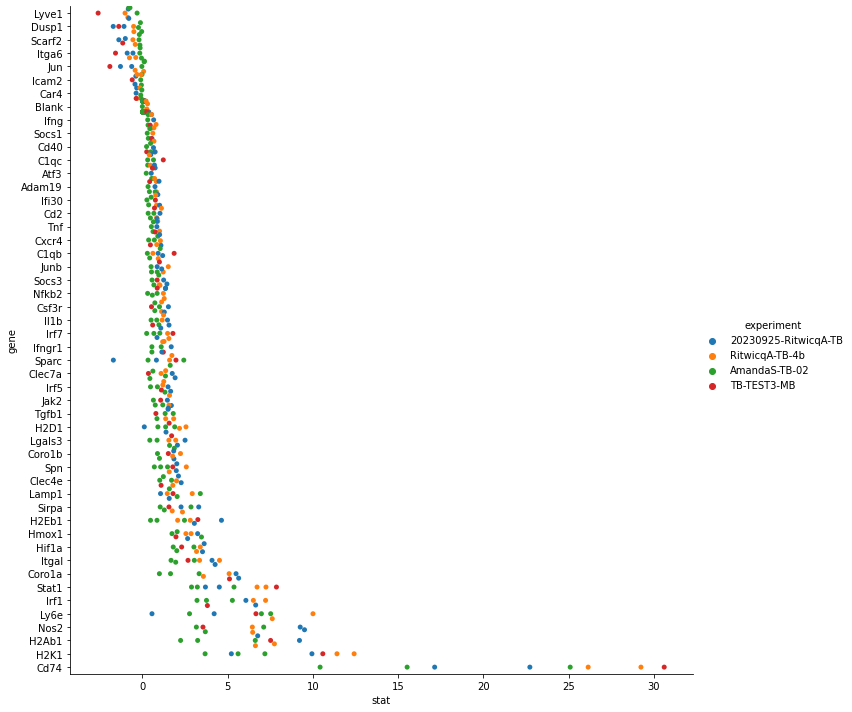

In [500]:
df_new = df.copy()
df_new.loc[df_new.gene.str.startswith("Blank"),'gene']='Blank'
df_new = df_new.loc[~df_new.gene.isin(neither)]
df_new

ax = sns.catplot(data=df_new, 
                 x="stat", 
                 y="gene", 
                 hue="experiment", 
                 #palette = ['red','orange','lightgrey'],
                 kind="swarm",
                 aspect=1,
                 height=10,
                 row_order=gene_list)

plt.savefig("/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/new/replicate_samplestat_experiment-withoutTBcells.pdf", format='pdf')
plt.show()

In [492]:
average_df

#from kruskal-wallis test (for upregulated genes) p<0.01 compared to all the blanks

#clean up these markers
low_markers = list(average_df.loc[average_df.average< -0.2].index)
print(low_markers)
high_markers = ['Ifng','Socs1','Cd40','C1qc','Atf3','Ifi30','Adam19','Cd2','Tnf','Cxcr4','C1qb','Junb','Socs3',
                'Nfkb2','Csf3r','Il1b','Irf7','Ifngr1','Sparc','Clec7a','Irf5','Jak2','Tgfb1','H2D1','Lgals3',
                'Coro1b','Spn','Clec4e','Lamp1','Sirpa','H2Eb1','Hmox1','Hif1a','Itgal','Coro1a','Stat1','Irf1','Ly6e','Nos2','H2Ab1',
                'H2K1','Cd74']


neither = [x for x in list(average_df.index) if x not in low_markers+high_markers]
neither = [x for x in neither if not x.startswith('Blank')]

heatmap_labels = {'Up':high_markers,'Down':low_markers}
heatmap_labels

['Lyve1', 'Dusp1', 'Scarf2', 'Itga6', 'Jun', 'Icam2', 'Car4']


{'Up': ['Ifng',
  'Socs1',
  'Cd40',
  'C1qc',
  'Atf3',
  'Ifi30',
  'Adam19',
  'Cd2',
  'Tnf',
  'Cxcr4',
  'C1qb',
  'Junb',
  'Socs3',
  'Nfkb2',
  'Csf3r',
  'Il1b',
  'Irf7',
  'Ifngr1',
  'Sparc',
  'Clec7a',
  'Irf5',
  'Jak2',
  'Tgfb1',
  'H2D1',
  'Lgals3',
  'Coro1b',
  'Spn',
  'Clec4e',
  'Lamp1',
  'Sirpa',
  'H2Eb1',
  'Hmox1',
  'Hif1a',
  'Itgal',
  'Coro1a',
  'Stat1',
  'Irf1',
  'Ly6e',
  'Nos2',
  'H2Ab1',
  'H2K1',
  'Cd74'],
 'Down': ['Lyve1', 'Dusp1', 'Scarf2', 'Itga6', 'Jun', 'Icam2', 'Car4']}

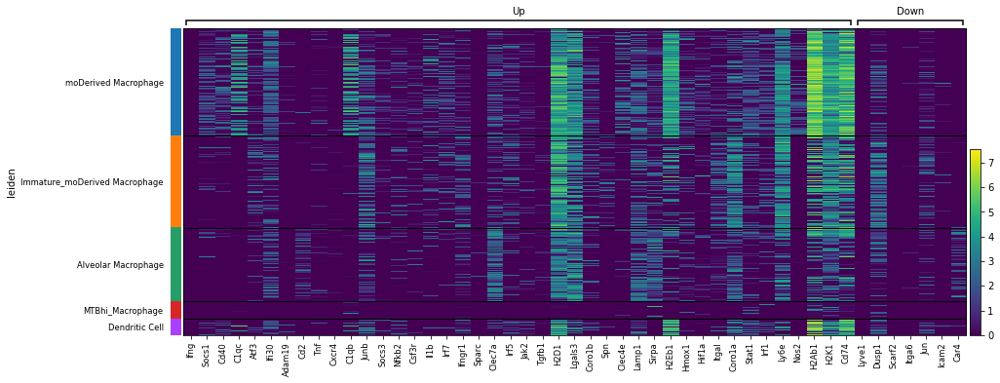

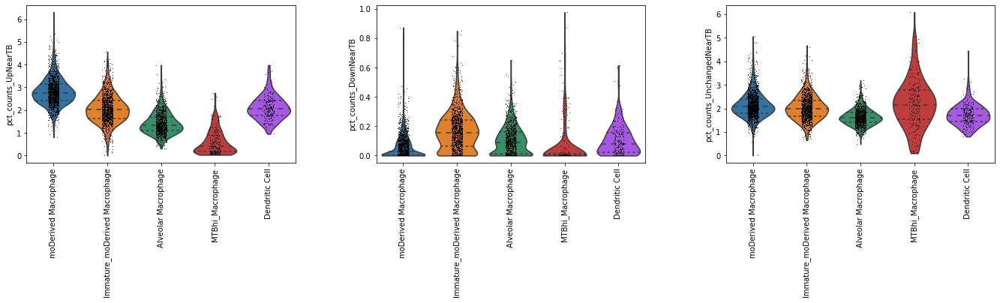

In [494]:
#print a heatmap
sc.pl.heatmap(sc_data,var_names = heatmap_labels, groupby='leiden',show_gene_labels=True,save = 'tbfinal_cleanmarkers.pdf')

sc_data.var.UpNearTB=False
sc_data.var.UnchangedNearTB=False
sc_data.var.DownNearTB=False

sc_data.var.loc[high_markers,'UpNearTB']=True
sc_data.var.loc[low_markers,'DownNearTB']=True
sc_data.var.loc[neither,'UnchangedNearTB']=True

sc.pp.calculate_qc_metrics(sc_data,qc_vars = ['UpNearTB','DownNearTB','UnchangedNearTB'],percent_top=None,inplace=True,log1p=False)
sc.pl.violin(sc_data,['pct_counts_UpNearTB','pct_counts_DownNearTB','pct_counts_UnchangedNearTB'],groupby='leiden',rotation=90,inner='quartile',save ='rip.pdf')

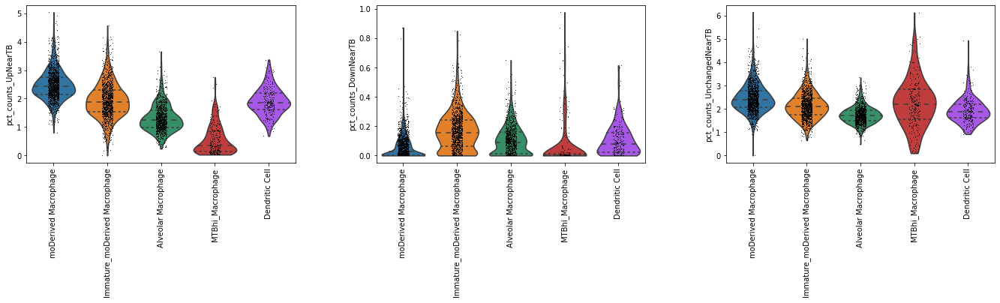

In [479]:
sc.pl.violin(sc_data,['pct_counts_UpNearTB','pct_counts_DownNearTB','pct_counts_UnchangedNearTB'],groupby='leiden',rotation=90,inner='quartile', save ='rip.pdf')



In [423]:
sc_data.layers

Layers with keys: 

In [448]:
#load all the h5ads and merge them into one object, re-normalize

folder = '/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/'

adata = concatenate_h5ad_folder(input_folder=folder+'Annotated_h5ad',
                            output_folder=folder,
                            name = 'concatenated_vizgen_h5ad',
                            regex = ['date','slide','project','region'],
                            regex_sep = '_',
                            counts_threshold=0,
                            genes_threshold=0,
                            adata_file = 'None',
                            save_frequency = 100)

print(adata.obs['slide'].value_counts())

adata.obs['Condition'] = 'Control'
adata.obs.loc[~adata.obs.slide.isin(['TB-CTRL2-MB','TB-CTRL1-MB']),'Condition']='TB'
print(adata.obs.groupby(['Condition','slide'])['fov'].count())

adata.obs['genomics_personnel'] = 'Michael_Borja'
adata.obs.loc[adata.obs.slide.str.startswith('Amanda'),'genomics_personnel'] = 'Amanda_Seng'
adata.obs.loc[adata.obs.slide.str.startswith('Ritwicq'),'genomics_personnel'] = 'Ritwicq_Arjyal'
adata.obs.loc[adata.obs.slide.str.startswith('20230925'),'genomics_personnel'] = 'Ritwicq_Arjyal'

adata.obs['experiment_name'] = 'Control_1'
adata.obs.loc[adata.obs.slide.str.startswith('20230925'),'experiment_name'] = 'TB_Mouse2_SectionA'
adata.obs.loc[adata.obs.slide.str.startswith('Ritwicq'),'experiment_name'] = 'TB_Mouse4_SectionB'
adata.obs.loc[adata.obs.slide.str.startswith('Amanda'),'experiment_name'] = 'TB_Mouse4_SectionC'
adata.obs.loc[adata.obs.slide.str.startswith('TB-TEST3'),'experiment_name'] = 'TB_MouseX_Test3'
adata.obs.loc[adata.obs.slide.str.startswith('TB-CTRL2'),'experiment_name'] = 'Ctrl_MouseX_Exp2'
adata.obs.loc[adata.obs.slide.str.startswith('TB-CTRL1'),'experiment_name'] = 'Ctrl_MouseX_Exp1'

print(adata.obs.experiment_name.value_counts())

adata.obs['full_sample'] = adata.obs.experiment_name.astype('str')+'_'+adata.obs.region.astype('str')
adata.obs.full_sample.value_counts()

adata.obs.PolyT_high_pass = adata.obs.PolyT_high_pass.astype('float')
adata.layers['normalized_to_polyT'] = adata.layers['counts']/np.array(adata.obs.PolyT_high_pass).reshape(-1,1)*np.mean(adata.obs.PolyT_high_pass)
adata.layers['normalized_to_polyT'] = sparse.csr_matrix(adata.layers['normalized_to_polyT'])
       
    
adata.obs.distance_to_tb = adata.obs.distance_to_tb.astype('float')
adata.obs['grouped_distance_to_tb'] = '1_far'
adata.obs.loc[adata.obs.distance_to_tb<1000,'grouped_distance_to_tb'] = '2_within_1_mm'
adata.obs.loc[adata.obs.distance_to_tb<100,'grouped_distance_to_tb'] = '3_within_100_um'
adata.obs.loc[adata.obs.distance_to_tb==0,'grouped_distance_to_tb'] = '4_TBPositive'
adata.obs.loc[adata.obs.distance_to_tb<-1,'grouped_distance_to_tb'] = '5_Unclear'

adata.obs.grouped_distance_to_tb.value_counts()
adata.var.index = [i.replace("-","") for i in adata.var.index]

#save this object with all the columns

adata.write_h5ad(folder+'Total_annotated_vizgen_TB_20231120.h5ad')

adata_keep = adata.copy()



first file:  202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated.h5ad


  0%|          | 0/13 [00:00<?, ?it/s]

reading  202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated.h5ad
adding .obs columns to anndata object
copying interim


  8%|▊         | 1/13 [00:02<00:27,  2.31s/it]

reading  202305231432_TB-CTRL1-MB_VMSC02401_region1_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 15%|█▌        | 2/13 [00:03<00:20,  1.89s/it]

reading  202309251210_20230925-RitwicqA-TB_VMSC02401_region1_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 23%|██▎       | 3/13 [00:06<00:23,  2.34s/it]

reading  202305251147_TB-CTRL2-MB_VMSC02401_region0_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 31%|███       | 4/13 [00:08<00:19,  2.17s/it]

reading  202305231432_TB-CTRL1-MB_VMSC02401_region2_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 38%|███▊      | 5/13 [00:11<00:17,  2.24s/it]

reading  202305261458_TB-TEST3-MB_VMSC02401_region1_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 46%|████▌     | 6/13 [00:13<00:15,  2.27s/it]

reading  202309251210_20230925-RitwicqA-TB_VMSC02401_region2_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 54%|█████▍    | 7/13 [00:15<00:14,  2.36s/it]

reading  202305251147_TB-CTRL2-MB_VMSC02401_region1_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 62%|██████▏   | 8/13 [00:19<00:13,  2.66s/it]

reading  202310111428_RitwicqA-TB-4b_VMSC02401_region1_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 69%|██████▉   | 9/13 [00:22<00:11,  2.78s/it]

reading  202305231432_TB-CTRL1-MB_VMSC02401_region0_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 77%|███████▋  | 10/13 [00:24<00:07,  2.54s/it]

reading  202310091253_AmandaS-TB-02_VMSC02401_region2_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 85%|████████▍ | 11/13 [00:27<00:05,  2.64s/it]

reading  202310111428_RitwicqA-TB-4b_VMSC02401_region2_Annotated.h5ad
adding .obs columns to anndata object
added to adata


 92%|█████████▏| 12/13 [00:31<00:03,  3.12s/it]

reading  202310091253_AmandaS-TB-02_VMSC02401_region1_Annotated.h5ad
adding .obs columns to anndata object
added to adata


100%|██████████| 13/13 [00:35<00:00,  2.70s/it]


RitwicqA-TB-4b          122259
AmandaS-TB-02           112969
20230925-RitwicqA-TB     80103
TB-CTRL2-MB              70974
TB-CTRL1-MB              48719
TB-TEST3-MB              19915
Name: slide, dtype: int64
Condition  slide               
Control    20230925-RitwicqA-TB         0
           AmandaS-TB-02                0
           RitwicqA-TB-4b               0
           TB-CTRL1-MB              48719
           TB-CTRL2-MB              70974
           TB-TEST3-MB                  0
TB         20230925-RitwicqA-TB     80103
           AmandaS-TB-02           112969
           RitwicqA-TB-4b          122259
           TB-CTRL1-MB                  0
           TB-CTRL2-MB                  0
           TB-TEST3-MB              19915
Name: fov, dtype: int64
TB_Mouse4_SectionB    122259
TB_Mouse4_SectionC    112969
TB_Mouse2_SectionA     80103
Ctrl_MouseX_Exp2       70974
Ctrl_MouseX_Exp1       48719
TB_MouseX_Test3        19915
Name: experiment_name, dtype: int64


Run code on the full adata object (TB only)

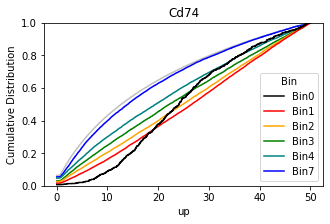

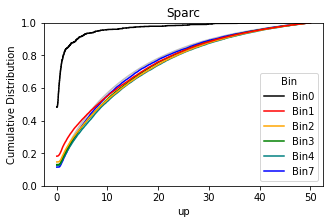

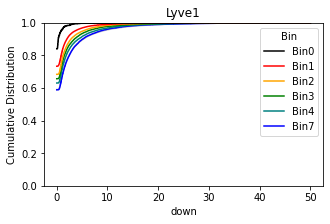

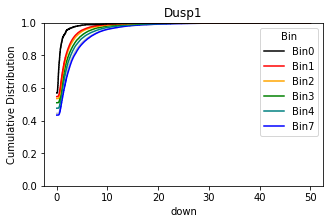

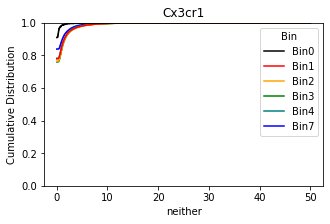

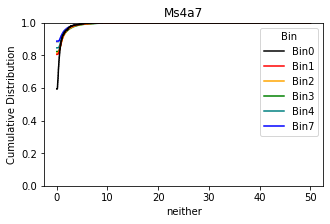

In [489]:
experimentName='AllTB'
region='All'
perm_iterations=3000
binsize=100

pval_threshold = 0.001
stat_threshold = 0.5

marker_dict = {'up':['Cd74','Sparc'], #['Cd74','H2K1','Nos2','C1qb','Hmox1']
              'down':['Lyve1','Dusp1'],
              'neither':['Cx3cr1','Ms4a7']}

layer = 'normalized_to_polyT'

adata_tb = adata[adata.obs.Condition=='TB'].copy()

#adata_df, df_results = permutation_test_for_tb_loc(adata_tb,layer,binsize,perm_iterations)
#sc_data = plot_tb_altered_transcripts(sc_data,pval_threshold, stat_threshold, df_results,experimentName, region,perm_iterations)
plot_cumulative_dist(marker_dict,adata_df,experimentName,region,ymax=50)

In [450]:
adata.obs.groupby(['experiment_name','Condition'])['fov'].count()

experiment_name     Condition
Ctrl_MouseX_Exp1    Control       48719
                    TB                0
Ctrl_MouseX_Exp2    Control       70974
                    TB                0
TB_Mouse2_SectionA  Control           0
                    TB            80103
TB_Mouse4_SectionB  Control           0
                    TB           122259
TB_Mouse4_SectionC  Control           0
                    TB           112969
TB_MouseX_Test3     Control           0
                    TB            19915
Name: fov, dtype: int64

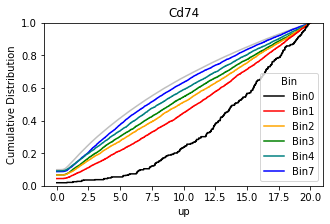

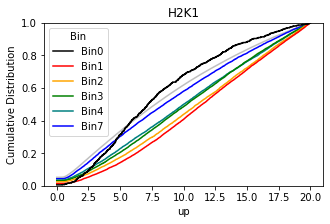

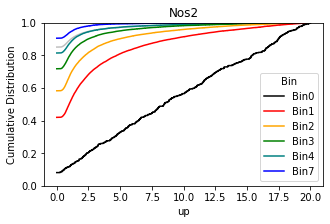

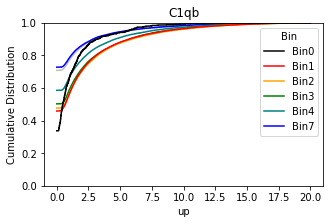

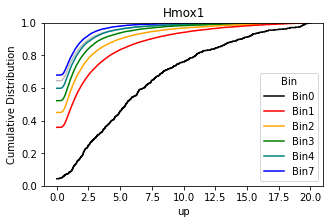

...

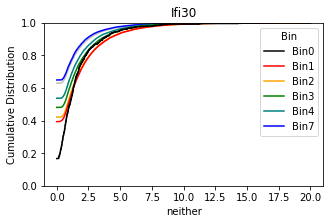

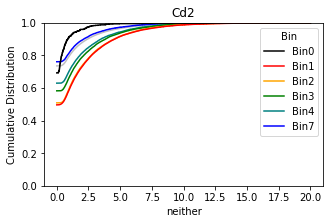

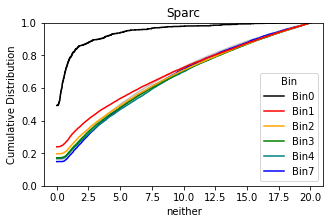

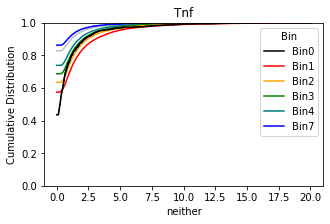

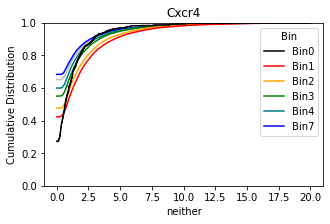

In [464]:
marker_dict = {'up':['Cd74','H2K1','Nos2','C1qb','Hmox1'],
              'down':['Lyve1','Dusp1'],
              'neither':['Cx3cr1','Ms4a7','Apoe']}

layer = 'normalized_to_polyT'

#adata_tb = adata[adata.obs.Condition=='TB'].copy()

#adata_df, df_results = permutation_test_for_tb_loc(adata_tb,layer,binsize,perm_iterations)
#sc_data = plot_tb_altered_transcripts(sc_data,pval_threshold, stat_threshold, df_results,experimentName, region,perm_iterations)
plot_cumulative_dist(marker_dict,adata_df,experimentName,region,ymax=20)

In [349]:
sc_data.var.index[sc_data.var.UpNearTB]

Index(['Il1r2', 'Stat1', 'Cxcr2', 'Cxcr4', 'Fcgr4', 'Slamf1', 'Atf3', 'Atf2',
       'Traf6', 'Il1a', 'Il1b', 'Sirpa', 'Mafb', 'Mmp9', 'Cd40', 'Fcgr1',
       'Cd2', 'Tgfbr1', 'Nr4a3', 'Csf3r', 'C1qb', 'C1qc', 'C1qa', 'Cd38',
       'Cxcl2', 'Plac8', 'Irf5', 'Irak2', 'Clec4a2', 'Clec4e', 'Cd69',
       'Clec7a', 'Apoe', 'Tgfb1', 'Coro1a', 'Spn', 'Itgal', 'Itgax', 'Irf7',
       'Col4a1', 'Lamp1', 'Ifi30', 'Hmox1', 'Junb', 'Ccl22', 'Irf8', 'Hspa8',
       'Ifngr1', 'Icosl', 'Ifng', 'Irak3', 'Stat2', 'Adam19', 'Irf1', 'Sparc',
       'Nos2', 'Ccr7', 'Socs3', 'Hif1a', 'Fos', 'Irf4', 'Cd83', 'Dnase1l3',
       'Lgals3', 'Irf9', 'Ly6e', 'Atf4', 'Crebbp', 'Socs1', 'Cd86', 'Ifnar2',
       'Ifnar1', 'Ifngr2', 'Sod2', 'H2K1', 'H2DMa', 'H2Ab1', 'H2Aa', 'H2Eb1',
       'Tnf', 'H2D1', 'Trem2', 'Cd14', 'Cd74', 'Coro1b', 'Jak2', 'Nfkb2'],
      dtype='object')

In [347]:
sc_data.var.index[sc_data.var.DownNearTB]

Index(['Mrc1', 'Itga6', 'Jun', 'Lyve1', 'Car4', 'Icam2', 'Scarf2', 'Dusp1'], dtype='object')

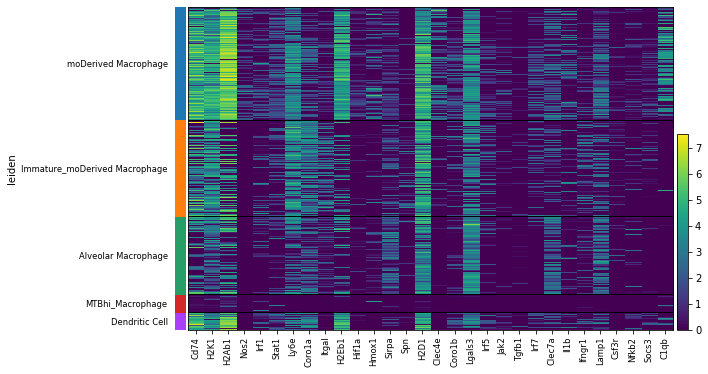

up near TB:  30 
down near TB: 2


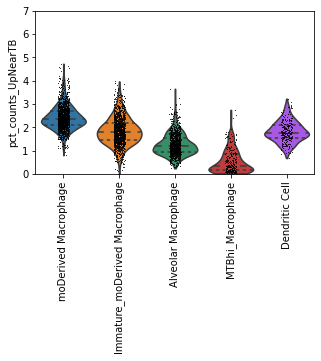

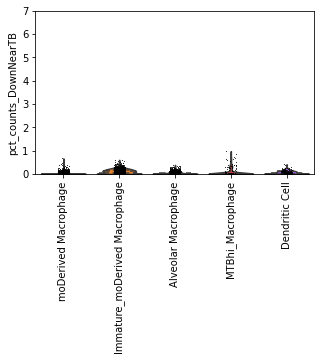

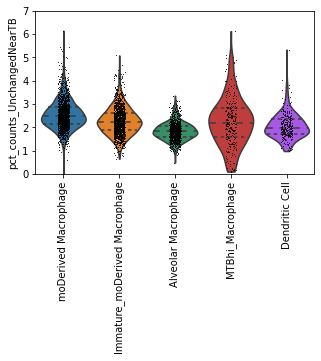

0.00030000000000000003


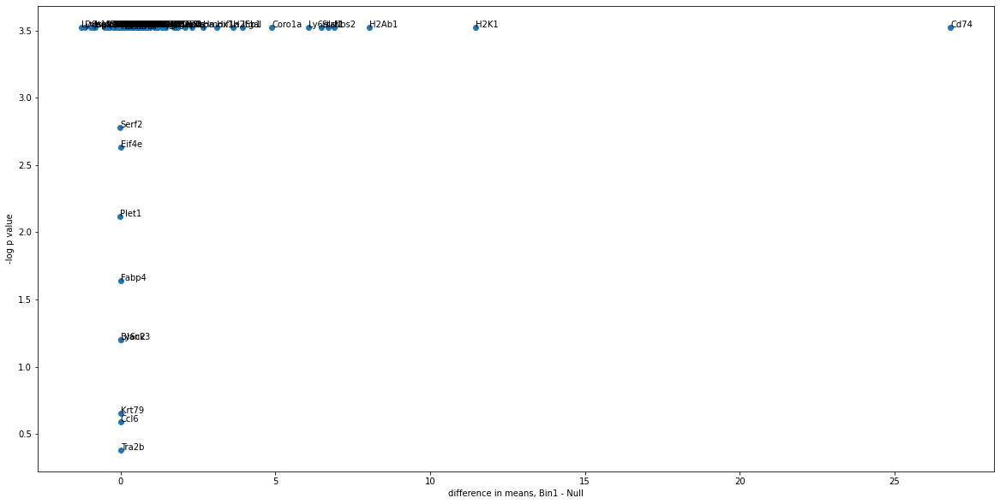

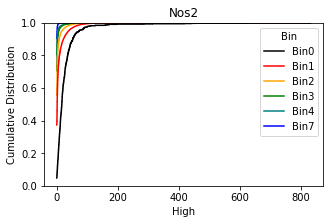

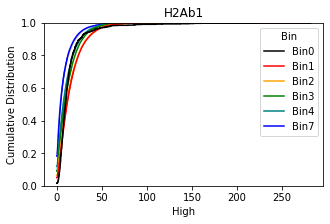

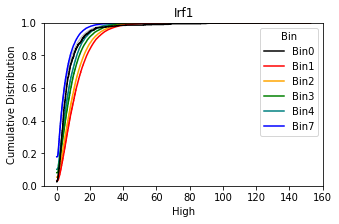

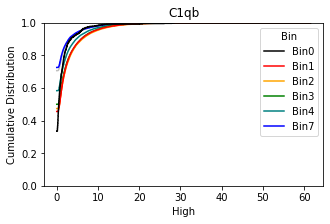

...

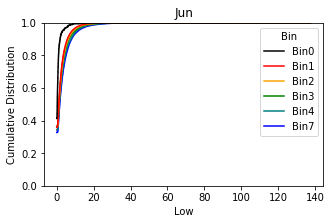

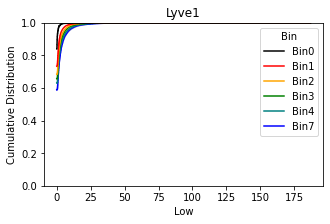

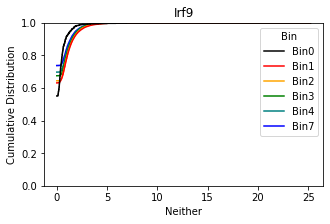

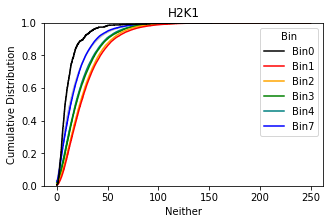

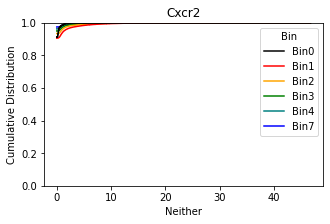

In [312]:
region = 'all_ymax_10'



sc_data = plot_tb_altered_transcripts(sc_data,pval_threshold, stat_threshold, df_results,experimentName, region,perm_iterations)
plot_cumulative_dist(marker_dict,adata_df,experimentName,region,ymax=50)

In [432]:
experimentName

'202310111428_RitwicqA-TB-4b_VMSC02401'

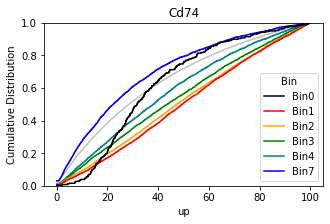

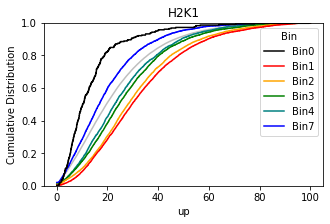

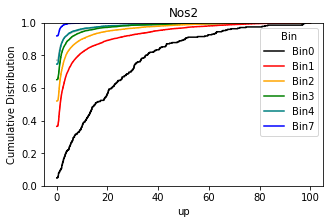

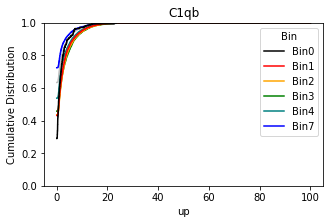

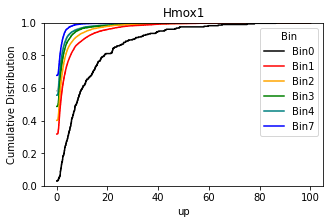

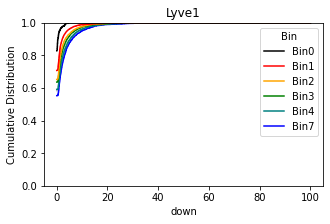

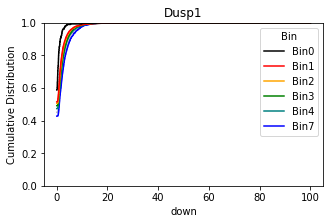

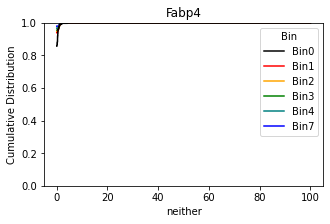

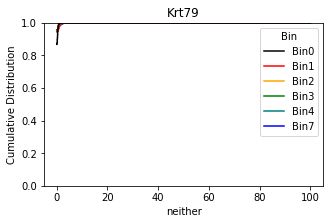

In [431]:
region = 'all_ymax_10'
marker_dict = {'up':['Cd74','H2K1','Nos2','C1qb','Hmox1'],
              'down':['Lyve1','Dusp1'],
              'neither':['Fabp4','Krt79']}
plot_cumulative_dist(marker_dict,adata_df,experimentName,region,ymax=100)

In [330]:
#from calculations with all samples together
#note: top 30 genes from this method and the previous method are completely overlapping except for c1qb


up_merged = sc_data.var.index[sc_data.var.UpNearTB]
up_merged

Index(['Stat1', 'Il1b', 'Sirpa', 'Csf3r', 'C1qb', 'Irf5', 'Clec4e', 'Clec7a',
       'Tgfb1', 'Coro1a', 'Spn', 'Itgal', 'Irf7', 'Lamp1', 'Hmox1', 'Ifngr1',
       'Irf1', 'Nos2', 'Socs3', 'Hif1a', 'Lgals3', 'Ly6e', 'H2K1', 'H2Ab1',
       'H2Eb1', 'H2D1', 'Cd74', 'Coro1b', 'Jak2', 'Nfkb2'],
      dtype='object')

In [327]:
#from calculations with each sample separate 
#top 40

up_separate = average_df.sort_values('average',ascending=False)[:30].index
up_separate

Index(['Cd74', 'H2K1', 'Nos2', 'H2Ab1', 'Ly6e', 'Irf1', 'Stat1', 'Coro1a',
       'Itgal', 'Hif1a', 'Hmox1', 'H2Eb1', 'Sirpa', 'Lamp1', 'Clec4e',
       'Lgals3', 'Coro1b', 'Spn', 'H2D1', 'Tgfb1', 'Jak2', 'Clec7a', 'Irf5',
       'Irf7', 'Il1b', 'Ifngr1', 'Csf3r', 'Nfkb2', 'Socs3', 'Junb'],
      dtype='object')

In [328]:
for gene in list(up_merged):
    if gene in list(up_separate):
        print(gene, "is in both lists")
    else:
        print(gene, "is unique to the new calculation excluding TB+ cells")

Stat1 is in both lists
Il1b is in both lists
Sirpa is in both lists
Csf3r is in both lists
C1qb is unique to the new calculation excluding TB+ cells
Irf5 is in both lists
Clec4e is in both lists
Clec7a is in both lists
Tgfb1 is in both lists
Coro1a is in both lists
Spn is in both lists
Itgal is in both lists
Irf7 is in both lists
Lamp1 is in both lists
Hmox1 is in both lists
Ifngr1 is in both lists
Irf1 is in both lists
Nos2 is in both lists
Socs3 is in both lists
Hif1a is in both lists
Lgals3 is in both lists
Ly6e is in both lists
H2K1 is in both lists
H2Ab1 is in both lists
H2Eb1 is in both lists
H2D1 is in both lists
Cd74 is in both lists
Coro1b is in both lists
Jak2 is in both lists
Nfkb2 is in both lists


In [317]:
sc_data.var.index[sc_data.var.DownNearTB]

Index(['Lyve1', 'Dusp1'], dtype='object')

In [286]:
#run test once more (maybe with differential expression? on normalized to polyT data, comparing the within 200 um to within 1 mm and far categories)
adata.X = adata.layers['normalized_to_polyT'].copy()
sc.pp.log1p(adata)
adata_test = adata[adata.obs.Condition=='TB'].copy()
adata_test.obs.grouped_distance_to_tb = adata_test.obs.grouped_distance_to_tb.astype('object')
sc.tl.rank_genes_groups(adata_test,
                        groupby='grouped_distance_to_tb',
                        groups=['3_within_100_um','4_TBPositive','1_far'],
                        reference = '2_within_1_mm')

df_ranked = sc.get.rank_genes_groups_df(adata_test, 
                                group='3_within_100_um',
                                key='rank_genes_groups', 
                                pval_cutoff=None, 
                                log2fc_min=None, 
                                log2fc_max=None, 
                                gene_symbols=None)



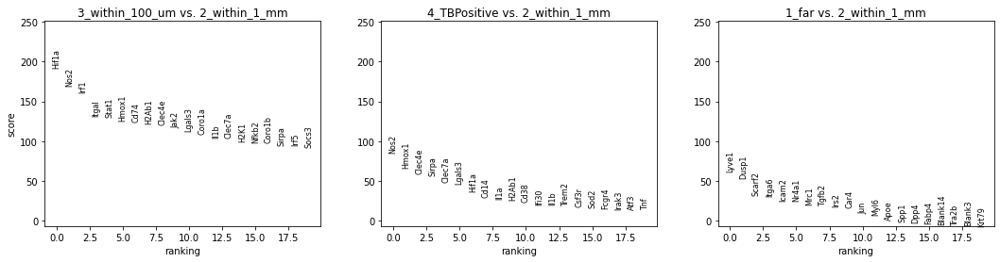

In [287]:
sc.pl.rank_genes_groups(adata_test)

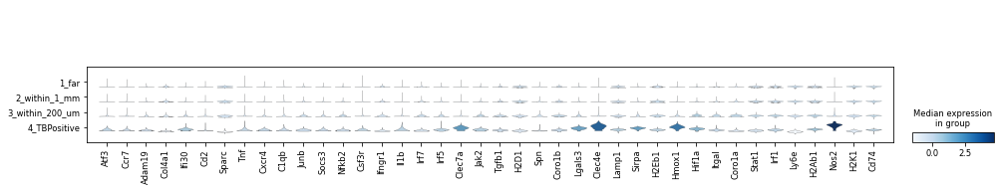

In [236]:
#take the top 10 genes and plot them across the adata categories

sc.pl.stacked_violin(adata[adata.obs.Condition=='TB'],
                     gene_list[100:140],
                     groupby='grouped_distance_to_tb',
                     layers='normalized_to_polyT')



Pearson correlation coefficient between Cd74 and Cd74 : 1.0
Pearson correlation coefficient between Cd74 and H2K1 : 0.65
Pearson correlation coefficient between Cd74 and H2Ab1 : 0.88
Pearson correlation coefficient between Cd74 and Stat1 : 0.67
Pearson correlation coefficient between Cd74 and Ly6e : 0.66
Pearson correlation coefficient between Cd74 and H2Eb1 : 0.8
Pearson correlation coefficient between Cd74 and Coro1b : 0.62
Pearson correlation coefficient between H2K1 and Cd74 : 0.65
Pearson correlation coefficient between H2K1 and H2K1 : 1.0
Pearson correlation coefficient between H2K1 and Irf1 : 0.64
Pearson correlation coefficient between H2K1 and Stat1 : 0.75
Pearson correlation coefficient between H2K1 and Ly6e : 0.8
Pearson correlation coefficient between H2K1 and H2D1 : 0.81
Pearson correlation coefficient between H2K1 and Lamp1 : 0.62
Pearson correlation coefficient between H2Ab1 and Cd74 : 0.88
Pearson correlation coefficient between H2Ab1 and H2Ab1 : 1.0
Pearson correlation

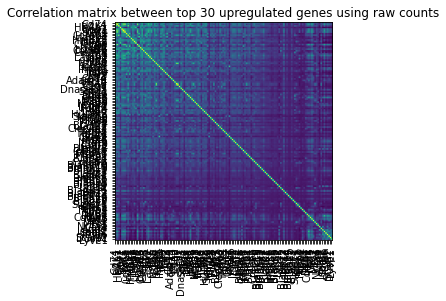

In [30]:
#plot counts of the highest de genes
stats = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats_Total_annotated_vizgen_TB_20231102_counts.csv',index_col=0)
stats = stats.sort_values('sample_stat',ascending=False)
stats[:30] #test statistic >1

#try with all the genes
genelist = list(stats.index)


#grab cells that are within 100 um and in the TB object
adata_keep.obs['distance_to_tb'] = adata_keep.obs['distance_to_tb'].astype('float')
keep_cells = adata_keep[adata_keep.obs.Condition=='TB'].copy()
keep_cells.var.index = [i.replace('-','') for i in keep_cells.var.index]

#set up a dataframe to collect correlation coefficients
correlation_frame = pd.DataFrame(index=genelist,columns=genelist)
from scipy.stats import pearsonr

for i in range(0,len(genelist)):
    gene_a = genelist[i]
    gene_a_values = keep_cells[:,gene_a].layers['counts'].todense()
    x = pd.DataFrame(gene_a_values)[0]
    for j in range(0,len(genelist)):
        gene_b = genelist[j]
        gene_b_values = keep_cells[:,gene_b].layers['counts'].todense()
        
        y = pd.DataFrame(gene_b_values)[0]
        pearson_coef, _ = np.round(pearsonr(x,y),decimals = 2)
        correlation_frame.loc[gene_a,gene_b] = pearson_coef
        if pearson_coef > 0.6:
            print("Pearson correlation coefficient between",gene_a,"and", gene_b, ":", pearson_coef)
            #sc.pl.scatter(keep_cells,x=gene_a, y = gene_b, color = 'distance_to_tb',layers='counts')

    
print(correlation_frame)

#make a heatmap
data = correlation_frame.astype('float')
plt.imshow( data )
plt.title( "Correlation matrix between top 30 upregulated genes using raw counts" )

 
# Set tick labels
plt.xticks(range(len(data.columns)),\
           data.columns, rotation=90)
plt.yticks(range(len(data.columns)),
           data.columns)

plt.show()




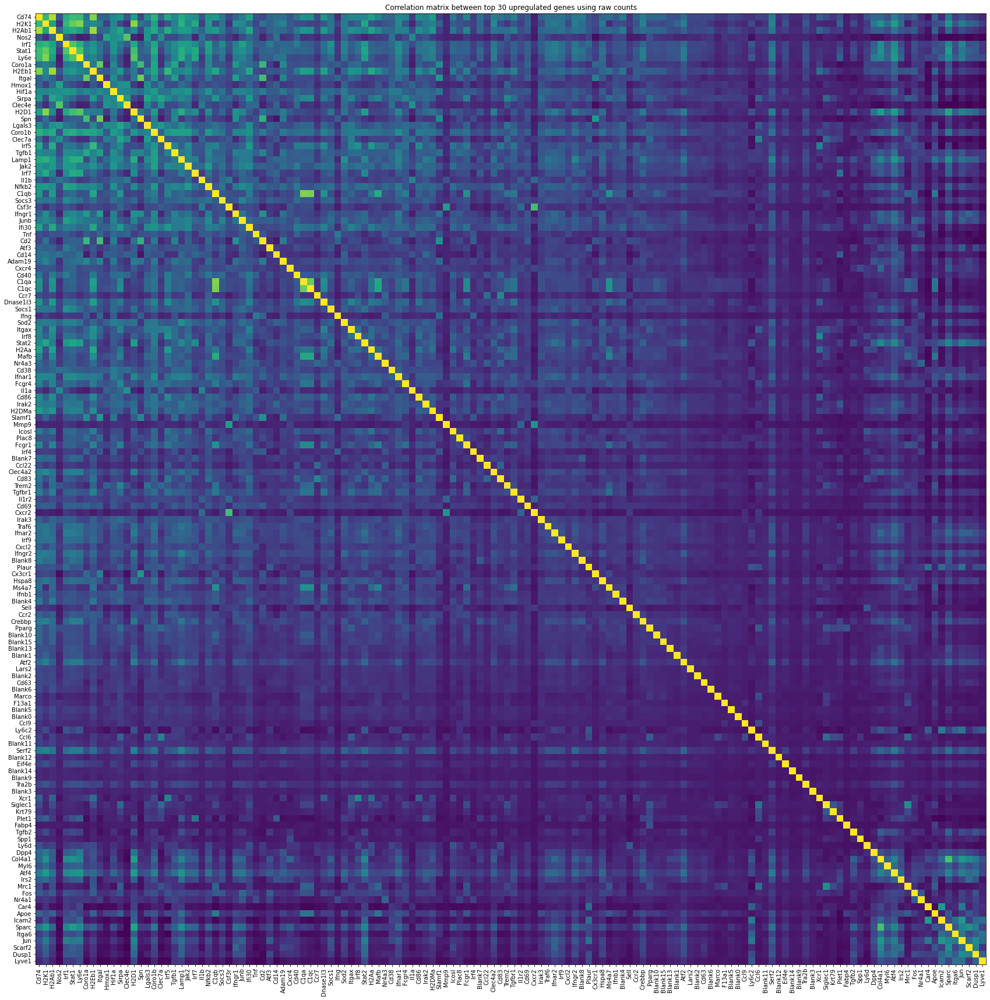

In [36]:
#make a heatmap
data = correlation_frame.astype('float')
plt.figure(figsize=(30,30))
plt.imshow( data )
plt.title( "Correlation matrix between top 30 upregulated genes using raw counts" )

 
# Set tick labels
plt.xticks(range(len(data.columns)),\
           data.columns, rotation=90)
plt.yticks(range(len(data.columns)),
           data.columns)

plt.show()


In [ ]:
#which genes are correlated? 

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


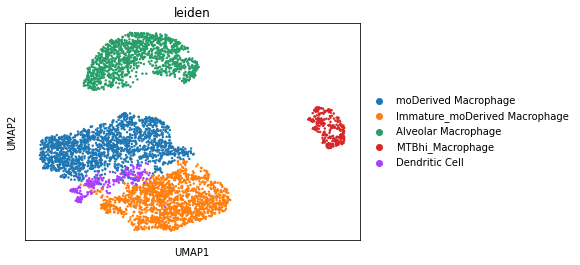

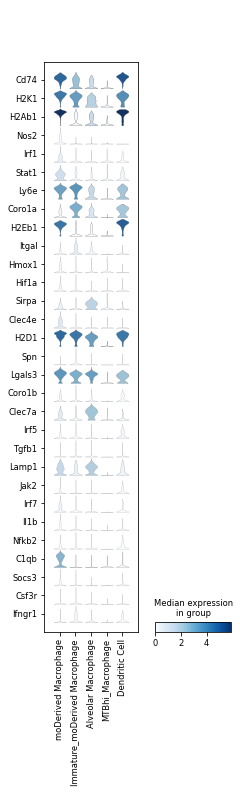

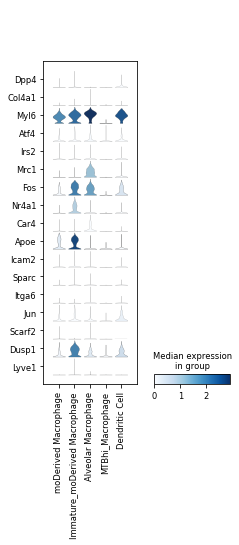

In [44]:
#plot one gene at a time in the violin plots
sc_data = sc.read_h5ad('/hpc/projects/data_lg/shoshana/Smartseq2nd/adataMNPNEW.h5ad')
sc_data = sc_data[sc_data.obs.leiden!='Neutrophil'].copy()
sc.pl.umap(sc_data,color = 'leiden')
sc_data.var_names = [i.replace('-','') for i in sc_data.var_names]

sc.pl.stacked_violin(sc_data,genelist[:30],groupby='leiden',swap_axes=True)
sc.pl.stacked_violin(sc_data,genelist[123:140],groupby='leiden',swap_axes=True)

In [1755]:
#plot counts of the lowest de genes
stats = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats_Total_annotated_vizgen_TB_20231102_counts.csv',index_col=0)
stats = stats.sort_values('sample_stat',ascending=True)
print(stats[:10]) #test statistic <= -0.3

genelist = list(stats.index[:30])
print(genelist)    

for i in range(0,len(genelist)):
    gene_a = genelist[i]
    for j in range(i+1,len(genelist)):
        gene_b = genelist[j]
        sc.pl.scatter(keep_cells,x=gene_a, y = gene_b, color = 'distance_to_tb',layers='counts')
    
   

        sample_stat  average_stat  p_value
Lyve1     -1.173971      0.001178   0.0009
Dusp1     -1.146137      0.000365   0.0009
Scarf2    -0.975055     -0.000356   0.0009
Jun       -0.796372     -0.000196   0.0009
Itga6     -0.703416     -0.000495   0.0009
Sparc     -0.607445     -0.001716   0.0009
Icam2     -0.456780     -0.000239   0.0009
Apoe      -0.442579     -0.000608   0.0009
Car4      -0.366306      0.000494   0.0009
Nr4a1     -0.299408      0.000228   0.0009
['Lyve1', 'Dusp1', 'Scarf2', 'Jun', 'Itga6', 'Sparc', 'Icam2', 'Apoe', 'Car4', 'Nr4a1', 'Fos', 'Mrc1', 'Irs2', 'Atf4', 'Myl6', 'Col4a1', 'Dpp4', 'Ly6d', 'Spp1', 'Tgfb2', 'Fabp4', 'Plet1', 'Krt79', 'Siglec1', 'Xcr1', 'Blank3', 'Tra2b', 'Blank9', 'Blank14', 'Eif4e']


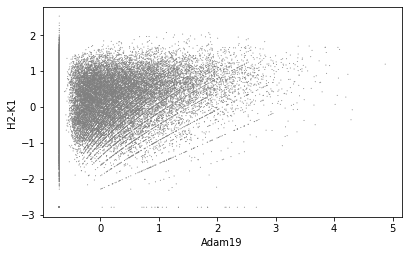

In [1746]:
sc.pl.scatter(keep_cells,x='Adam19',y='H2-K1')

In [1744]:
keep_cells.var

,mean,std
Adam19,0.357657,0.507871
Apoe,0.656786,0.725868
Atf2,0.219069,0.347734
Atf4,0.638463,0.550669
C1qa,0.151528,0.336936
...,...,...
Blank-11,0.015841,0.096338
Blank-12,0.006672,0.063670
Blank-13,0.048363,0.173181
Blank-14,0.008643,0.074658


number of cells per bin:  Null    229981
Bin1     29449
Bin2     27329
Bin3     19679
Bin4     16594
Bin7     13272
Name: Bin, dtype: int64


100%|██████████| 140/140 [1:04:18<00:00, 27.56s/it]
/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


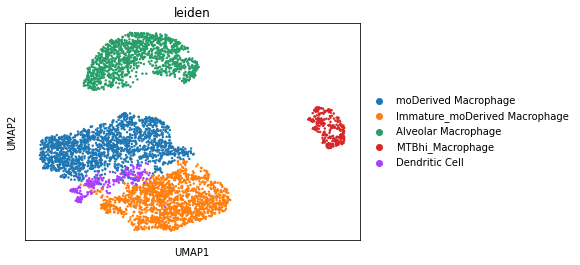

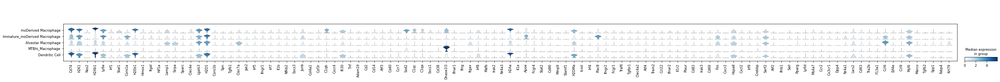

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


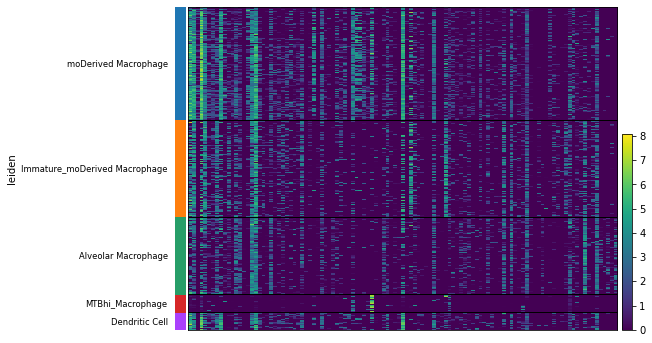

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


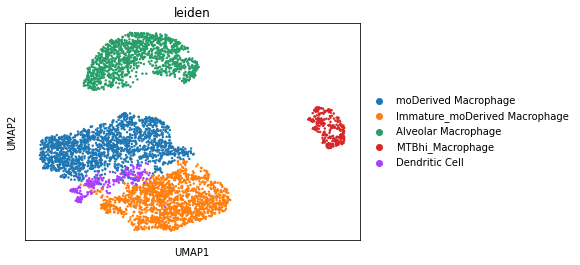

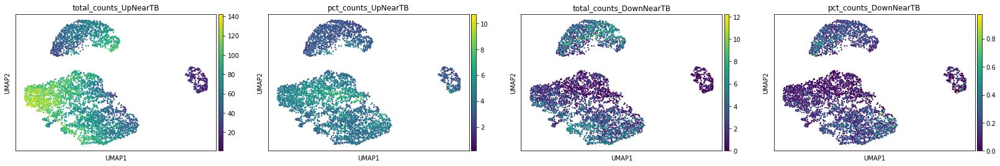

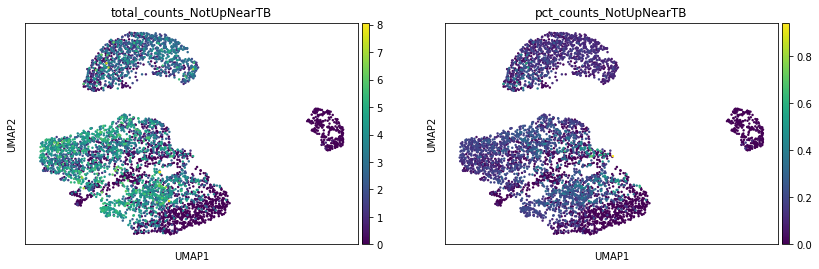

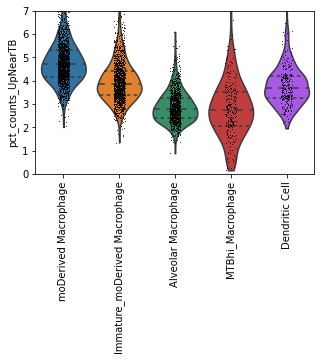

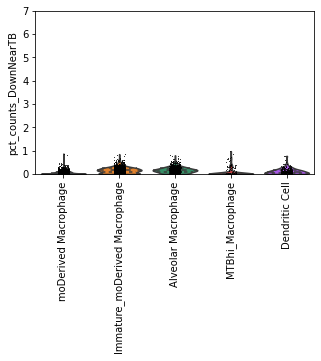

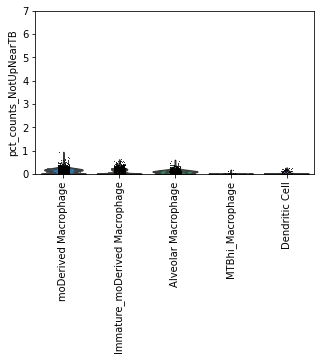

0.097
         sample_stat  average_stat  p_value
Lyve1      -0.776893      0.000916   0.0009
Dusp1      -0.493415      0.000029   0.0009
Scarf2     -0.477748     -0.000383   0.0009
Itga6      -0.380744     -0.000078   0.0009
Icam2      -0.199637     -0.000220   0.0009
Car4       -0.194199      0.000162   0.0009
Mrc1       -0.155244     -0.000060   0.0009
Jun        -0.120392      0.000324   0.0009
Irs2       -0.032696     -0.000113   0.0009
Xcr1       -0.026772     -0.000178   0.0009
Ly6c2      -0.007672     -0.000086   0.0970
Siglec1     0.001617     -0.000048   0.2680
Blank3      0.008801      0.000022   0.0009
Blank9      0.009396      0.000008   0.0009
Plet1       0.010463      0.000618   0.1460
Krt79       0.010863      0.000004   0.0009
Blank14     0.011505      0.000023   0.0009
Blank12     0.013010     -0.000030   0.0009
Fabp4       0.015822      0.000162   0.0009
Spp1        0.017839      0.000179   0.0009
        sample_stat  average_stat  p_value
Cd74      26.438408      0.

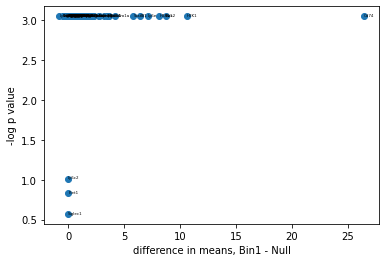

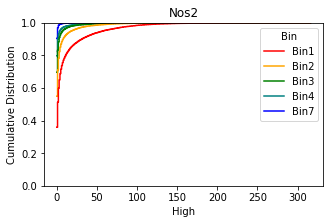

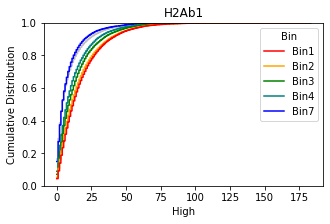

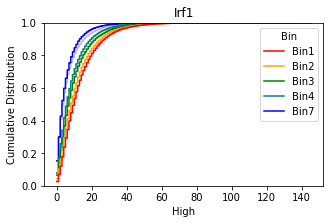

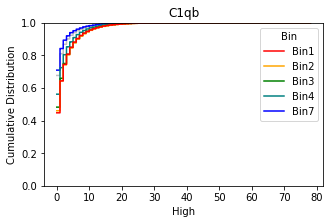

...

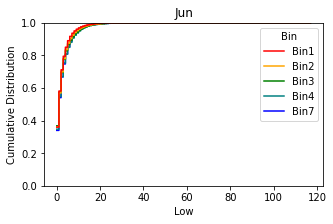

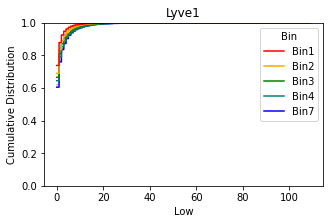

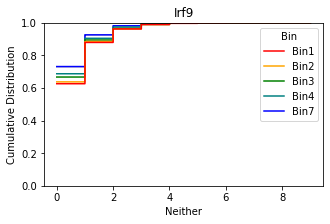

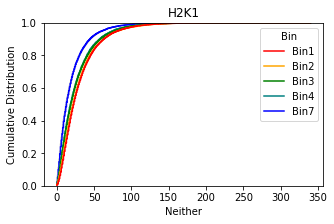

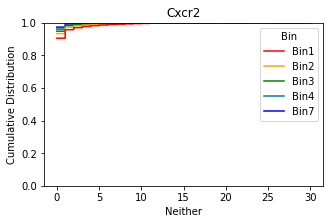

In [1684]:
#repeating with raw counts to see if I get the same results
#could also repeat by comparing the 100 um to some other distance

#run the permutation test on A) all the controls, B) all the TB cells
condition='TB'
adata = adata_keep[adata_keep.obs.Condition==condition].copy()

adata_df = pd.DataFrame.sparse.from_spmatrix(adata.layers['counts'])
adata_df = adata_df.sparse.to_dense()
adata_df.columns = adata.var.index
adata_df.index = adata.obs.index
adata_df['distance_real'] = adata.obs['distance_to_tb'].copy()
adata_df.columns = [i.replace('-','') for i in adata_df.columns]

adata_df['Bin'] = 'Null'
binsize = 100

#for the first 4 bins, plot the distribution on top of this one in a different color
adata_df.distance_real = adata_df.distance_real.astype('float')
adata_df.loc[(adata_df.distance_real>=6*binsize) & (adata_df.distance_real<7*binsize),'Bin'] = 'Bin7'
adata_df.loc[(adata_df.distance_real>=3*binsize) & (adata_df.distance_real<4*binsize),'Bin'] = 'Bin4'
adata_df.loc[(adata_df.distance_real>=2*binsize) & (adata_df.distance_real<3*binsize),'Bin'] = 'Bin3'
adata_df.loc[(adata_df.distance_real>=binsize) & (adata_df.distance_real<2*binsize),'Bin'] = 'Bin2'
adata_df.loc[adata_df.distance_real<binsize,'Bin'] = 'Bin1'
print("number of cells per bin: ",adata_df.Bin.value_counts())
adata_df = adata_df.sort_values('Bin',ascending=True)

#permutation test ~43 iterations/second
perm_iterations = 1000
df_results = pd.DataFrame(columns=['sample_stat','average_stat','p_value'])
for transcript in tqdm(adata_df.columns[:140]):
    sample_stat = np.mean(adata_df.loc[adata_df['Bin']=='Bin1',transcript]) - np.mean(adata_df[transcript]) #calculate the difference in means between your bin1 distribution and the null distribution
    stats = np.zeros(perm_iterations)
    for k in range(perm_iterations):
        labels = np.random.permutation((adata_df['Bin'] == 'Bin1').values) #randomly rearrange the bin labels so you get another sample in 'Bin1'
        stats[k] = np.mean(adata_df[transcript][labels]) - np.mean(adata_df[transcript]) #for each of 1000 iterations, calculate the difference between the random Bin1 Nos2 values and the null distribution

    if sample_stat>=0:
        p_value = np.mean(stats > sample_stat)
    if sample_stat<0:
        p_value = np.mean(stats < sample_stat)
    #save the stat and p-value per transcript
    df_results.loc[transcript] = [sample_stat,np.mean(stats),p_value] 

df_results = df_results.sort_values('p_value',ascending=True)

#increased close to TB
top_hits = df_results[(df_results.p_value<0.001)].sort_values('sample_stat',ascending=False)
top_hits = list(top_hits[top_hits.sample_stat>0].index)
top_hits = [i for i in top_hits if not i.startswith('Blank')]

bottom_hits =df_results[(df_results.p_value<0.001) & (df_results.sample_stat<0)].index
bottom_hits = [i for i in bottom_hits if not i.startswith('Blank')]

#show violin or feature plots of these genes in the smartseq data
sc_data = sc.read_h5ad('/hpc/projects/data_lg/shoshana/Smartseq2nd/adataMNPNEW.h5ad')
sc_data = sc_data[sc_data.obs.leiden!='Neutrophil'].copy()
sc.pl.umap(sc_data,color = 'leiden')
sc_data.var_names = [i.replace('-','') for i in sc_data.var_names]

sc.pl.stacked_violin(sc_data,top_hits,groupby='leiden',rotation=90)

allprobes = [i for i in list(df_results.index) if not i.startswith('Blank')]

sc_data.var['UpNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(top_hits),'UpNearTB'] = True

sc_data.var['DownNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(bottom_hits),'DownNearTB'] = True

sc_data.var['NotUpNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(allprobes),'NotUpNearTB'] = True
sc_data.var.loc[sc_data.var['UpNearTB']==True,'NotUpNearTB'] = False
sc_data.var.loc[sc_data.var['DownNearTB']==True,'NotUpNearTB'] = False

sc.pl.heatmap(sc_data,top_hits,groupby='leiden')
sc.pp.calculate_qc_metrics(sc_data,qc_vars=['UpNearTB','DownNearTB','NotUpNearTB'],inplace=True)
sc.pl.umap(sc_data,color = ['leiden'])
sc.pl.umap(sc_data,color = ['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'])
sc.pl.umap(sc_data,color = ['total_counts_NotUpNearTB','pct_counts_NotUpNearTB'])

fig,ax = plt.subplots(figsize=(5,3))
ax.set_ylim(0,7)
#sc.pl.violin(sc_data,['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'],groupby='leiden',rotation=90)
sc.pl.violin(sc_data,['pct_counts_UpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_UP_TB.pdf',ax=ax)
fig,ax = plt.subplots(figsize=(5,3))
ax.set_ylim(0,7)
sc.pl.violin(sc_data,['pct_counts_DownNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_Down_TB.pdf',ax=ax)

fig,ax = plt.subplots(figsize=(5,3))
ax.set_ylim(0,7)
sc.pl.violin(sc_data,['pct_counts_NotUpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_NOTUP_TB.pdf',ax=ax)
             
print(df_results.p_value[df_results.p_value>0].min())
df_results.loc[df_results.p_value==0,'p_value'] = 0.9/perm_iterations


df_results.to_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats_'+condition+'rawcounts.csv')

plt.scatter(x = df_results.sample_stat, y=-np.log10(df_results.p_value))
plt.xlabel('difference in means, Bin1 - Null')
plt.ylabel('-log p value')

for i in range(df_results.shape[0]):
 plt.text(x=df_results.sample_stat[i],y=-np.log10(df_results.p_value[i]),s=df_results.index[i], 
          fontdict=dict(color='black',size=4))

plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/volcano_'+condition+'rawcounts.pdf')

print(df_results.sort_values('sample_stat',ascending=True)[:20])
print(df_results.sort_values('sample_stat',ascending=False)[:20])   


marker_dict = {'High':['Nos2', 'H2Ab1', 'Irf1','C1qb'], 'Low':['Sparc','Jun','Lyve1'],'Neither':['Irf9','H2K1','Cxcr2']}


#run for each set of marker genes
for celltype in list(marker_dict.keys()):
   
    for transcript in marker_dict[celltype]:
    #if transcript not in ['Nos2','C1qa','C1qb','C1qc','Fcgr4','Lyve1']:
        #continue

        
  
        fig,ax = plt.subplots(figsize=(5,3))
        sns.histplot(data = adata_df,
                 x=transcript, 
                 bins=10000, 
                 binrange=(0,max(adata_df[transcript])),
                 stat="density",
                 element="step", 
                 fill=False, 
                 cumulative=True,
                color='Grey',
                alpha=0.5)
        
    
        sns.histplot(data = adata_df[adata_df.Bin!='Null'],
                 x=transcript, 
                 hue='Bin', 
                 bins=10000, 
                 binrange=(0,max(adata_df[transcript])),
                 stat="density",
                 element="step", 
                 fill=False, 
                 cumulative=True, 
                 common_norm=False,
                palette = ['Red','Orange','Green','Teal','Blue'])
        ax.set_xlabel(celltype)
        ax.set_ylabel('Cumulative Distribution')
        ax.set_title(transcript)
        ax.set_ylim(0,1)
        fig.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/'+condition+'_'+transcript+'rawcounts_histogram.pdf')        
        
print("Up: ",sc_data.var.UpNearTB.value_counts())
print("Down: ", sc_data.var.DownNearTB.value_counts())
print("Neither: ",sc_data.var.NotUpNearTB.value_counts())

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


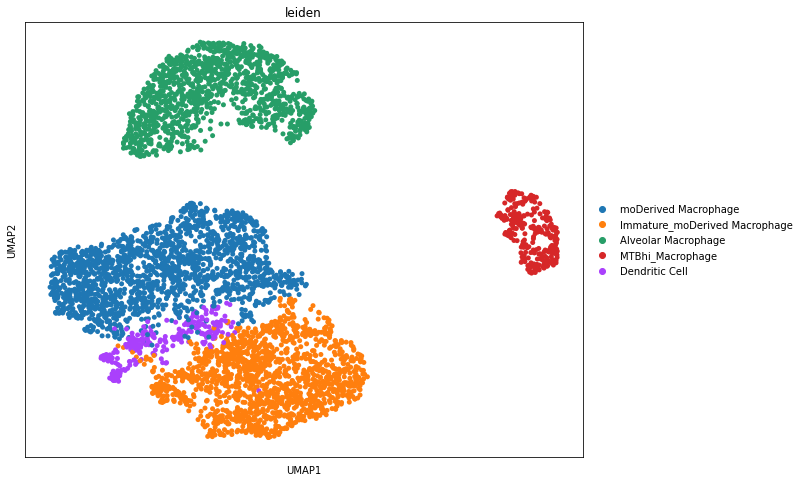

In [1697]:
fig,ax = plt.subplots(figsize=(10,8))
sc.pl.umap(sc_data,color='leiden',ax=ax,size=100,save='umap.pdf')

In [1625]:
#directly compare the two 
adata = adata_keep.copy()
adata

AnnData object with n_obs × n_vars = 455997 × 140
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'center_x_mosaic', 'center_y_mosaic', 'total_counts', 'log_total_counts', 'leiden', 'TB_std', 'TB_mean', 'TB_topaverage', 'TB_class_from_images', 'distance_to_tb', 'full_sample', 'date', 'slide', 'project', 'Condition', 'genomics_personnel', 'experiment_name'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'full_sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'log_normalized', 'scale_data'
    obsp: 'distances', 'connectivities'

In [1626]:
set(adata.obs.full_sample)

{'Ctrl_MouseX_Exp1_region0',
 'Ctrl_MouseX_Exp1_region1',
 'Ctrl_MouseX_Exp1_region2',
 'Ctrl_MouseX_Exp2_region0',
 'Ctrl_MouseX_Exp2_region1',
 'TB_Mouse2_SectionA_region1',
 'TB_Mouse2_SectionA_region2',
 'TB_Mouse4_SectionB_region1',
 'TB_Mouse4_SectionB_region2',
 'TB_Mouse4_SectionC_region0',
 'TB_Mouse4_SectionC_region1',
 'TB_Mouse4_SectionC_region2',
 'TB_MouseX_Test3_region1'}

In [458]:
df = pd.DataFrame(adata.obs.groupby(['full_sample','TB_class_from_images'])['slide'].count())
newdf = pd.DataFrame(index = list(set(adata.obs.full_sample)),columns = ['experiment','High','Low','Removed'])
for i,j in df.index:
    exp = i 
    tb_class = j
    value = df.loc[i,j][0]
    newdf.loc[i,j] = value
    
newdf.experiment = newdf.index.copy()
newdf

,experiment,High,Low,Removed
TB_Mouse2_SectionA_region1,TB_Mouse2_SectionA_region1,167,49682,200
TB_Mouse2_SectionA_region2,TB_Mouse2_SectionA_region2,41,29779,234
Ctrl_MouseX_Exp2_region1,Ctrl_MouseX_Exp2_region1,18,6238,48187
TB_Mouse4_SectionC_region0,TB_Mouse4_SectionC_region0,58,9758,24
TB_Mouse4_SectionC_region1,TB_Mouse4_SectionC_region1,57,72696,68
TB_MouseX_Test3_region1,TB_MouseX_Test3_region1,50,4417,15448
Ctrl_MouseX_Exp1_region2,Ctrl_MouseX_Exp1_region2,0,39395,3
TB_Mouse4_SectionC_region2,TB_Mouse4_SectionC_region2,73,30213,22
Ctrl_MouseX_Exp1_region1,Ctrl_MouseX_Exp1_region1,0,8122,1
TB_Mouse4_SectionB_region1,TB_Mouse4_SectionB_region1,69,50190,104


In [459]:
newdf_small = newdf[['experiment','High']]
newdf_small = newdf_small.sort_values("High")
index_order = newdf_small.index

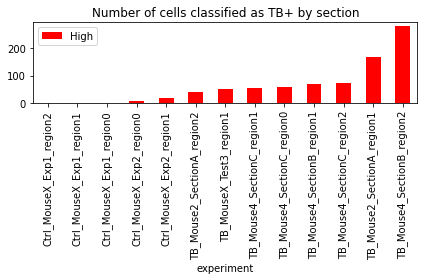

In [460]:
#plot a bar plot
newdf_small.plot(x='experiment', kind='bar', stacked=True,
        title='Number of cells classified as TB+ by section',color = 'red')
plt.tight_layout()
plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/TB_pos_cells_by_sample_bar.pdf',format='pdf')
plt.show()

In [461]:
newdf['total'] = newdf.High+newdf.Low+newdf.Removed
newdf_small = newdf[['experiment','total']]
newdf_small = newdf_small.loc[index_order]
newdf_small

,experiment,total
Ctrl_MouseX_Exp1_region2,Ctrl_MouseX_Exp1_region2,39398
Ctrl_MouseX_Exp1_region1,Ctrl_MouseX_Exp1_region1,8123
Ctrl_MouseX_Exp1_region0,Ctrl_MouseX_Exp1_region0,1198
Ctrl_MouseX_Exp2_region0,Ctrl_MouseX_Exp2_region0,16531
Ctrl_MouseX_Exp2_region1,Ctrl_MouseX_Exp2_region1,54443
TB_Mouse2_SectionA_region2,TB_Mouse2_SectionA_region2,30054
TB_MouseX_Test3_region1,TB_MouseX_Test3_region1,19915
TB_Mouse4_SectionC_region1,TB_Mouse4_SectionC_region1,72821
TB_Mouse4_SectionC_region0,TB_Mouse4_SectionC_region0,9840
TB_Mouse4_SectionB_region1,TB_Mouse4_SectionB_region1,50363


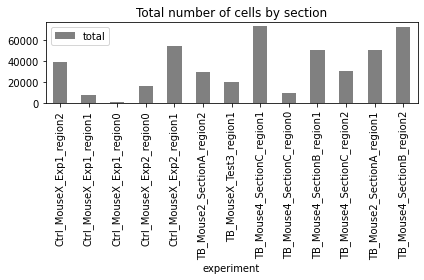

In [462]:
#plot a bar plot
newdf_small.plot(x='experiment', kind='bar', stacked=True,
        title='Total number of cells by section',color = 'grey')
plt.tight_layout()
plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/all_cells_by_sample_bar.pdf',format='pdf')

plt.show()

In [1640]:
newdf_small = newdf[['experiment','High','total']]
newdf_small['percent'] = newdf_small['High']*100/newdf_small['total']
newdf_small = newdf_small[['experiment','percent']]
newdf_small = newdf_small.loc[index_order]
newdf_small

<ipython-input-1640-e7148ea54c50>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newdf_small['percent'] = newdf_small['High']*100/newdf_small['total']


,experiment,percent
Ctrl_MouseX_Exp1_region1,Ctrl_MouseX_Exp1_region1,0.012311
Ctrl_MouseX_Exp1_region0,Ctrl_MouseX_Exp1_region0,0.166945
Ctrl_MouseX_Exp1_region2,Ctrl_MouseX_Exp1_region2,0.007615
Ctrl_MouseX_Exp2_region0,Ctrl_MouseX_Exp2_region0,0.042345
Ctrl_MouseX_Exp2_region1,Ctrl_MouseX_Exp2_region1,0.036736
TB_Mouse2_SectionA_region2,TB_Mouse2_SectionA_region2,0.143076
TB_MouseX_Test3_region1,TB_MouseX_Test3_region1,0.251067
TB_Mouse4_SectionC_region1,TB_Mouse4_SectionC_region1,0.078274
TB_Mouse4_SectionC_region0,TB_Mouse4_SectionC_region0,0.589431
TB_Mouse4_SectionB_region1,TB_Mouse4_SectionB_region1,0.137005


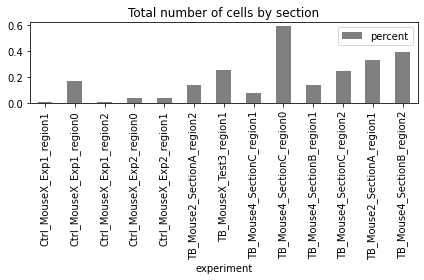

In [1641]:
#plot a bar plot
newdf_small.plot(x='experiment', kind='bar', stacked=True,
        title='Total number of cells by section',color = 'grey')
plt.tight_layout()
plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/percent_tb_cells_by_sample_bar.pdf',format='pdf')

plt.show()

In [1466]:
#load in both data frames and compare the gene signatures
ctrl_stats = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats_Control.csv',index_col=0)
ctrl_stats

,sample_stat,average_stat,p_value
Nos2,-0.026199,0.000092,0.00009
Ly6e,-0.244002,0.000094,0.00009
Ly6d,-0.075966,-0.000102,0.00009
Cxcr4,-0.099373,-0.000277,0.00009
Irf1,-0.082163,0.000286,0.00009
...,...,...,...
Adam19,-0.001933,0.000102,0.47480
Hif1a,-0.001208,0.000052,0.47840
Blank5,-0.000534,-0.000036,0.48370
Siglec1,-0.000262,0.000030,0.49640


In [1467]:
#load in both data frames and compare the gene signatures
tb_stats = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats_TB.csv',index_col=0)
tb_stats

,sample_stat,average_stat,p_value
Adam19,0.041381,-1.122554e-05,0.00009
Socs1,0.073134,-1.204268e-05,0.00009
Slamf1,0.052441,-8.623477e-06,0.00009
Sirpa,0.225567,9.986417e-06,0.00009
Siglec1,-0.011697,6.731215e-06,0.00009
...,...,...,...
Lars2,0.000514,-4.215004e-06,0.24250
Cd63,0.000456,2.418672e-06,0.26970
Pparg,0.000651,1.160143e-05,0.28470
Blank14,-0.000226,-3.141449e-06,0.28900


In [1518]:
#for every gene, plot the tb sample_stat vs ctrl sample_stat
#make a combined data frame
all_stats = pd.DataFrame(index = tb_stats.index)
all_stats['tb_sample_stat'] = tb_stats['sample_stat'].copy()
all_stats['tb_pval'] = tb_stats['p_value'].copy()

for i in all_stats.index:
    all_stats.loc[i,'Ctrl_sample_stat'] = ctrl_stats.loc[i,'sample_stat']
    all_stats.loc[i,'Ctrl_sample_pval'] = ctrl_stats.loc[i,'p_value']
    
all_stats

,tb_sample_stat,tb_pval,Ctrl_sample_stat,Ctrl_sample_pval
Adam19,0.041381,0.00009,-0.001933,0.4748
Socs1,0.073134,0.00009,-0.001006,0.4704
Slamf1,0.052441,0.00009,-0.016018,0.0085
Sirpa,0.225567,0.00009,0.048433,0.0081
Siglec1,-0.011697,0.00009,-0.000262,0.4964
...,...,...,...,...
Lars2,0.000514,0.24250,-0.000039,0.5099
Cd63,0.000456,0.26970,0.003680,0.2895
Pparg,0.000651,0.28470,-0.032311,0.0002
Blank14,-0.000226,0.28900,0.001252,0.3425


        tb_sample_stat  tb_pval  Ctrl_sample_stat  Ctrl_sample_pval    gene
Sparc        -0.364554  0.00009          0.234283           0.00009   Sparc
Lyve1        -0.263883  0.00009         -0.066434           0.01400   Lyve1
Dusp1        -0.259625  0.00009         -0.136491           0.00009   Dusp1
Itga6        -0.256505  0.00009         -0.087668           0.00030   Itga6
Jun          -0.244391  0.00009         -0.022780           0.22340     Jun
Scarf2       -0.222959  0.00009         -0.052077           0.03410  Scarf2
Ly6e         -0.163534  0.00009         -0.244002           0.00009    Ly6e
Atf4         -0.156147  0.00009         -0.062586           0.00350    Atf4
Apoe         -0.145098  0.00009          0.097012           0.00140    Apoe
Col4a1       -0.129137  0.00009         -0.121688           0.00010  Col4a1
Icam2        -0.121233  0.00009         -0.049835           0.01160   Icam2
Cxcr4         0.102410  0.00009         -0.099373           0.00009   Cxcr4
Junb        

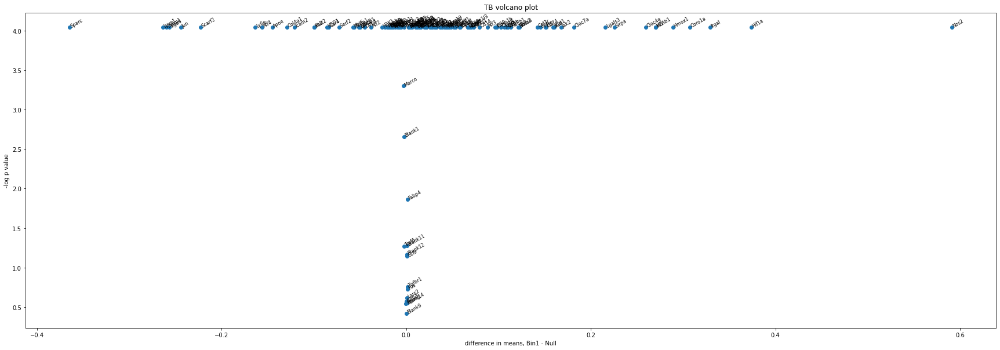

In [1520]:
#sort by tb_sample_stat and plot both tb and control stats
all_stats = all_stats.sort_values('tb_sample_stat')
all_stats['gene'] = all_stats.index.copy()

#plot a volcano plot
fig, ax = plt.subplots(figsize=(30,10))
ax.scatter(x = all_stats.tb_sample_stat, y=-np.log10(all_stats.tb_pval))
ax.set_xlabel('difference in means, Bin1 - Null')
ax.set_ylabel('-log p value')
ax.set_title('TB volcano plot')

for i in range(all_stats.shape[0]):
 ax.text(x=all_stats.tb_sample_stat[i],y=-np.log10(all_stats.tb_pval[i]),s=all_stats.gene[i], 
          color='black',size=8,rotation=30)

print(all_stats.loc[abs(all_stats.tb_sample_stat)>0.1])

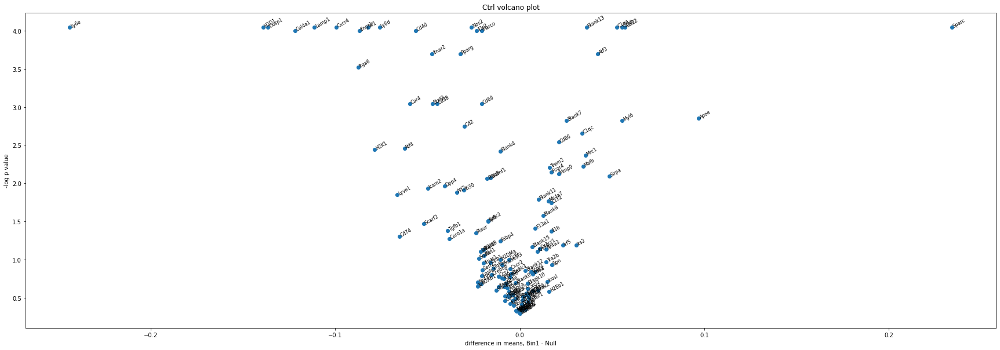

In [1521]:
#plot a volcano plot
fig, ax = plt.subplots(figsize=(30,10))
ax.scatter(x = all_stats.Ctrl_sample_stat, y=-np.log10(all_stats.Ctrl_sample_pval))
ax.set_xlabel('difference in means, Bin1 - Null')
ax.set_ylabel('-log p value')
ax.set_title('Ctrl volcano plot')

for i in range(all_stats.shape[0]):
 ax.text(x=all_stats.Ctrl_sample_stat[i],y=-np.log10(all_stats.Ctrl_sample_pval[i]),s=all_stats.gene[i], 
          color='black',size=8,rotation=30)

In [1528]:
#make a table comparing the genes that are significantly altered in the TB samples vs those significantly altered in the control samples
tb_up = all_stats.gene[all_stats.tb_sample_stat>0.05]
tb_down = all_stats.gene[all_stats.tb_sample_stat<-0.05]
tb_neither = all_stats.gene[(all_stats.tb_sample_stat<0.05)&(all_stats.tb_sample_stat>-0.05)]

In [1543]:
print(len(tb_up))
x = all_stats.loc[tb_up,'Ctrl_sample_stat']>0.05
all_stats.loc[x[x].index]

44


,tb_sample_stat,tb_pval,Ctrl_sample_stat,Ctrl_sample_pval,gene
C1qa,0.057785,0.00009,0.052608,0.00009,C1qa
C1qb,0.109339,0.00009,0.055438,0.00009,C1qb


In [1544]:
print(len(tb_down))
x = all_stats.loc[tb_down,'Ctrl_sample_stat']<-0.05
all_stats.loc[x[x].index]

21


,tb_sample_stat,tb_pval,Ctrl_sample_stat,Ctrl_sample_pval,gene
Lyve1,-0.263883,0.00009,-0.066434,0.01400,Lyve1
Dusp1,-0.259625,0.00009,-0.136491,0.00009,Dusp1
Itga6,-0.256505,0.00009,-0.087668,0.00030,Itga6
Scarf2,-0.222959,0.00009,-0.052077,0.03410,Scarf2
Ly6e,-0.163534,0.00009,-0.244002,0.00009,Ly6e
Atf4,-0.156147,0.00009,-0.062586,0.00350,Atf4
Col4a1,-0.129137,0.00009,-0.121688,0.00010,Col4a1
H2D1,-0.085817,0.00009,-0.139246,0.00009,H2D1
Car4,-0.083951,0.00009,-0.059630,0.00090,Car4
Lamp1,-0.050125,0.00009,-0.111338,0.00009,Lamp1


In [1548]:
tb_up = tb_up[~tb_up.isin(['C1qa','C1qb'])]
tb_down = tb_down[~tb_down.isin(['Lyve1','Dusp1','Itga6','Scarf2','Ly6e','Atf4','Col4a1','H2D1','Car4','Lamp1'])]

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


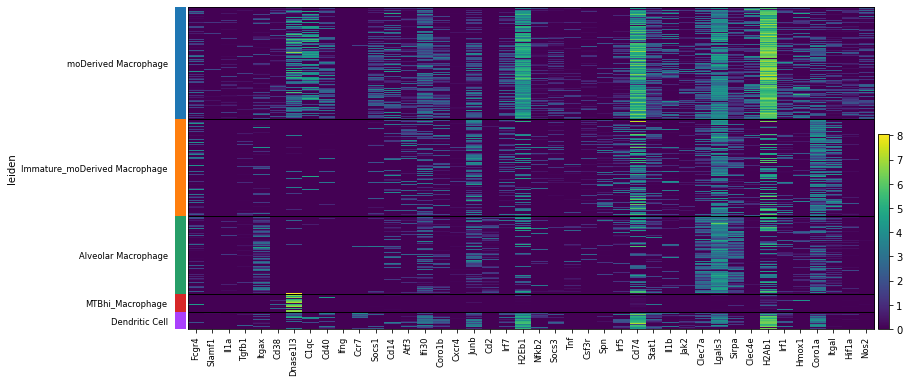

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


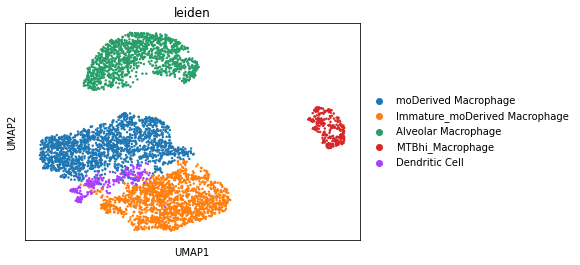

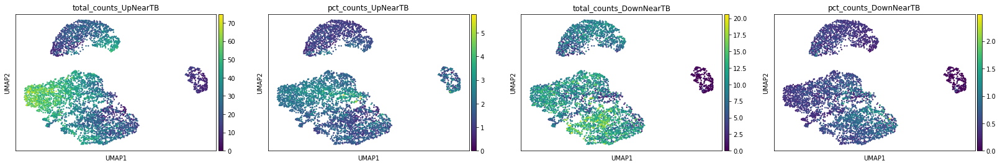

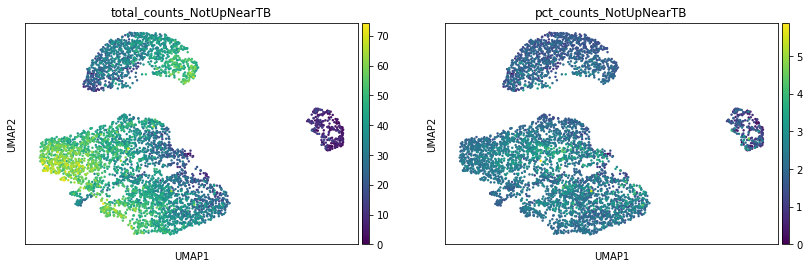

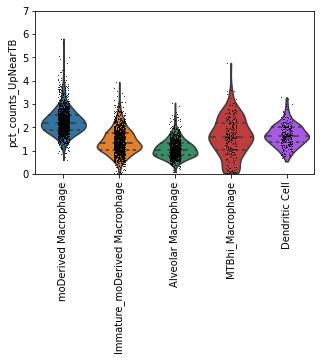

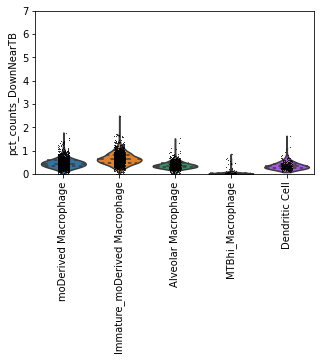

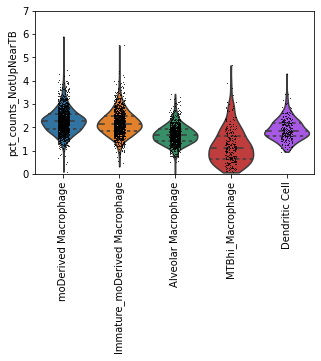

In [1549]:
#re-run the violin plots with these genes
allprobes = [i for i in list(all_stats.index) if not i.startswith('Blank')]

sc_data.var['UpNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(tb_up),'UpNearTB'] = True

sc_data.var['DownNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(tb_down),'DownNearTB'] = True

sc_data.var['NotUpNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(allprobes),'NotUpNearTB'] = True
sc_data.var.loc[sc_data.var['UpNearTB']==True,'NotUpNearTB'] = False
sc_data.var.loc[sc_data.var['DownNearTB']==True,'NotUpNearTB'] = False

sc.pl.heatmap(sc_data,tb_up,groupby='leiden',show_gene_labels=True)
sc.pp.calculate_qc_metrics(sc_data,qc_vars=['UpNearTB','DownNearTB','NotUpNearTB'],inplace=True)
sc.pl.umap(sc_data,color = ['leiden'])
sc.pl.umap(sc_data,color = ['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'])
sc.pl.umap(sc_data,color = ['total_counts_NotUpNearTB','pct_counts_NotUpNearTB'])

fig,ax = plt.subplots(figsize=(5,3))
ax.set_ylim(0,7)
#sc.pl.violin(sc_data,['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'],groupby='leiden',rotation=90)
sc.pl.violin(sc_data,['pct_counts_UpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_UP_limit01_strict_TB.pdf',ax=ax)
fig,ax = plt.subplots(figsize=(5,3))
ax.set_ylim(0,7)
sc.pl.violin(sc_data,['pct_counts_DownNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_Down_limit01_strict_TB.pdf',ax=ax)

fig,ax = plt.subplots(figsize=(5,3))
ax.set_ylim(0,7)
sc.pl.violin(sc_data,['pct_counts_NotUpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_NEITHER_limit01_strict_TB.pdf',ax=ax)
             

In [1555]:
ctrl_stats

,sample_stat,average_stat,p_value
Nos2,-0.026199,0.000092,0.00009
Ly6e,-0.244002,0.000094,0.00009
Ly6d,-0.075966,-0.000102,0.00009
Cxcr4,-0.099373,-0.000277,0.00009
Irf1,-0.082163,0.000286,0.00009
...,...,...,...
Adam19,-0.001933,0.000102,0.47480
Hif1a,-0.001208,0.000052,0.47840
Blank5,-0.000534,-0.000036,0.48370
Siglec1,-0.000262,0.000030,0.49640


In [1566]:
#which genes are consistently up- or down-regulated across all of the TB experiments? 
i=0
for file in os.listdir('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/individual/tb/'):
    #print(file.split("_",maxsplit=1)[1].split(".")[0])
    stats = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/individual/tb/'+file,index_col=0)
    upregulated = stats.loc[(stats.sample_stat>0.02)&(stats.p_value<0.01)].index
    if i==0:
        shared_upregulated=upregulated.copy()
    else:
        shared_upregulated = shared_upregulated[shared_upregulated.isin(upregulated)]
shared_upregulated

Index(['H2Ab1', 'Ifngr1', 'Ifng', 'Sirpa', 'Slamf1', 'Ifnar1', 'Il1a', 'Hmox1',
       'Hif1a', 'Socs3', 'Sod2', 'Stat1', 'Socs1', 'Tgfb1', 'Il1b', 'Irak2',
       'Nos2', 'Lamp1', 'Junb', 'Il1r2', 'Itgal', 'Irf1', 'Irak3', 'Jak2',
       'Tnf', 'Cd74', 'Cd40', 'Cd38', 'Cd2', 'Cd14', 'Ifi30', 'C1qc', 'Atf3',
       'Irf5', 'Clec4e', 'Lgals3', 'Mmp9', 'Cxcr2', 'Cxcr4', 'Clec7a',
       'Coro1b', 'Csf3r', 'Coro1a', 'Nfkb2', 'Spn', 'C1qb'],
      dtype='object')

In [1568]:
#which genes are consistently up- or down-regulated across all of the TB experiments? 
i=0
for file in os.listdir('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/individual/tb/'):
    #print(file.split("_",maxsplit=1)[1].split(".")[0])
    stats = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/individual/tb/'+file,index_col=0)
    downregulated = stats.loc[(stats.sample_stat<-0.02)&(stats.p_value<0.01)].index
    if i==0:
        shared_downregulated=downregulated.copy()
    else:
        shared_downregulated = shared_downregulated[shared_downregulated.isin(downregulated)]
shared_downregulated

Index(['Icosl', 'Icam2', 'Mrc1', 'Lyve1', 'Ly6e', 'Jun', 'Itga6', 'Irs2',
       'Serf2', 'Dusp1', 'Scarf2', 'Sparc', 'Car4', 'Atf4', 'Ccl6', 'Cx3cr1',
       'Stat2', 'H2K1'],
      dtype='object')

In [1571]:
sc_data.obs.leiden.value_counts()

moDerived Macrophage             1739
Immature_moDerived Macrophage    1496
Alveolar Macrophage              1202
MTBhi_Macrophage                  279
Dendritic Cell                    269
Name: leiden, dtype: int64

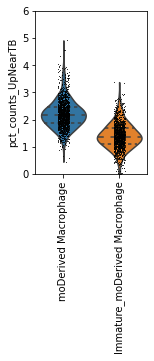

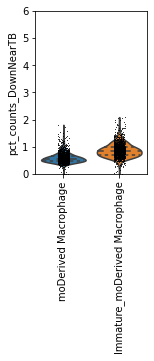

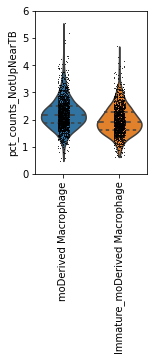

In [1579]:
#run violin plots with these genes
#re-run the violin plots with these genes
allprobes = [i for i in list(all_stats.index) if not i.startswith('Blank')]

sc_data.var['UpNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(shared_upregulated),'UpNearTB'] = True

sc_data.var['DownNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(shared_downregulated),'DownNearTB'] = True

sc_data.var['NotUpNearTB'] = False
sc_data.var.loc[sc_data.var.index.isin(allprobes),'NotUpNearTB'] = True
sc_data.var.loc[sc_data.var['UpNearTB']==True,'NotUpNearTB'] = False
sc_data.var.loc[sc_data.var['DownNearTB']==True,'NotUpNearTB'] = False

sc.pp.calculate_qc_metrics(sc_data,qc_vars=['UpNearTB','DownNearTB','NotUpNearTB'],inplace=True)

fig,ax = plt.subplots(figsize=(2,3))
ax.set_ylim(0,6)
#sc.pl.violin(sc_data,['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'],groupby='leiden',rotation=90)
sc.pl.violin(sc_data[sc_data.obs.leiden.isin(['moDerived Macrophage','Immature_moDerived Macrophage'])],['pct_counts_UpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_UP_shared_TB.pdf',ax=ax)
fig,ax = plt.subplots(figsize=(2,3))
ax.set_ylim(0,6)
sc.pl.violin(sc_data[sc_data.obs.leiden.isin(['moDerived Macrophage','Immature_moDerived Macrophage'])],['pct_counts_DownNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_Down_shared_TB.pdf',ax=ax)

fig,ax = plt.subplots(figsize=(2,3))
ax.set_ylim(0,6)
sc.pl.violin(sc_data[sc_data.obs.leiden.isin(['moDerived Macrophage','Immature_moDerived Macrophage'])],['pct_counts_NotUpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_NEITHER_shared_TB.pdf',ax=ax)
             

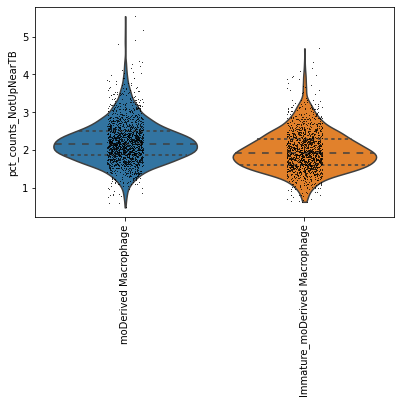

In [1586]:
x = sc.pl.violin(sc_data[sc_data.obs.leiden.isin(['moDerived Macrophage','Immature_moDerived Macrophage'])],['pct_counts_NotUpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = 'AllFiles_'+condition+'_ViolinPlot_NEITHER_shared_TB.pdf')

In [1644]:
adata.obs.distance_to_tb = adata.obs.distance_to_tb.astype('float')

cell_id
202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated_3846392600000100033     562.58
202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated_3846392600000100035     555.84
202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated_3846392600000100039     568.71
202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated_3846392600000100043     574.83
202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated_3846392600000100048     576.41
                                                                               ...   
202310091253_AmandaS-TB-02_VMSC02401_region1_Annotated_3846393100431100042    6006.97
202310091253_AmandaS-TB-02_VMSC02401_region1_Annotated_3846393100431100043    6061.22
202310091253_AmandaS-TB-02_VMSC02401_region1_Annotated_3846393100431100058    6010.14
202310091253_AmandaS-TB-02_VMSC02401_region1_Annotated_3846393100431100085    6152.25
202310091253_AmandaS-TB-02_VMSC02401_region1_Annotated_3846393100431100090    6107.24
Name: distance_to_tb, Length: 336304, dtype: c

In [1649]:
#grab the TB-infected cells and directly compare them to their neighbors using pseudobulk
adata = adata_keep[adata_keep.obs.Condition=='TB'].copy()
adata.obs.distance_to_tb = adata.obs.distance_to_tb.astype('float')
tb_cells = adata.obs.index[adata.obs.TB_class_from_images=='High']
neighbors = adata.obs.index[(adata.obs.distance_to_tb<15)&(adata.obs.distance_to_tb>0)]

print(len(tb_cells),len(neighbors))

805 1636


In [1597]:
#can grab the points directly from sc_data
enriched_percentages = sc_data.obs.loc[sc_data.obs.leiden.isin(['moDerived Macrophage','Immature_moDerived Macrophage'])]
enriched_percentages[['pct_counts_UpNearTB','pct_counts_DownNearTB','pct_counts_NotUpNearTB','leiden']]

#run a t-test for each one comparing the leiden clusters to each other

,pct_counts_UpNearTB,pct_counts_DownNearTB,pct_counts_NotUpNearTB,leiden
A10_B112494-0-new,1.140149,0.962165,1.839579,Immature_moDerived Macrophage
A11_B112361-0-new,1.147501,1.044851,2.431081,Immature_moDerived Macrophage
A11_B112474-0-new,1.549257,1.013323,1.906567,Immature_moDerived Macrophage
A11_B112559-0-new,1.317646,0.763860,2.442917,Immature_moDerived Macrophage
A12_B112559-0-new,1.760184,1.073731,2.781979,Immature_moDerived Macrophage
...,...,...,...,...
P20_B000003-1-new,3.296718,0.650277,3.173634,moDerived Macrophage
P21_B000003-1-new,1.886488,1.082866,2.978507,Immature_moDerived Macrophage
P22_B000000-1-new,1.576518,0.896812,2.080656,moDerived Macrophage
P9_B000002-1-new,2.989233,0.653228,3.563959,moDerived Macrophage


In [1622]:
#grap the 95 percentiles from each one
#up

TBup_immature = enriched_percentages.pct_counts_UpNearTB.loc[enriched_percentages.leiden=='Immature_moDerived Macrophage']
median = TBup_immature.median()
upper_bound_95 = np.quantile(TBup_immature,.75)
lower_bound_95 = np.quantile(TBup_immature,.25)
print("Percentage of TB-induced transcripts in immature mo-derived Macrophages: 25th percentile, median, 75th percentile: ", lower_bound_95, median, upper_bound_95)

TBup_mature = enriched_percentages.pct_counts_UpNearTB.loc[enriched_percentages.leiden=='moDerived Macrophage']
median = TBup_mature.median()
upper_bound_95 = np.quantile(TBup_mature,.75)
lower_bound_95 = np.quantile(TBup_mature,.25)
print("Percentage of TB-induced transcripts in mature mo-derived Macrophages: 25th percentile, median, 75th percentile: ", lower_bound_95, median, upper_bound_95)

#down

TBdown_immature = enriched_percentages.pct_counts_DownNearTB.loc[enriched_percentages.leiden=='Immature_moDerived Macrophage']
median = TBdown_immature.median()
upper_bound_95 = np.quantile(TBdown_immature,.75)
lower_bound_95 = np.quantile(TBdown_immature,.25)
print("Percentage of TB-suppressed transcripts in immature mo-derived Macrophages: 25th percentile, median, 75th percentile: ", lower_bound_95, median, upper_bound_95)

TBdown_mature = enriched_percentages.pct_counts_DownNearTB.loc[enriched_percentages.leiden=='moDerived Macrophage']
median = TBdown_mature.median()
upper_bound_95 = np.quantile(TBdown_mature,.75)
lower_bound_95 = np.quantile(TBdown_mature,.25)
print("Percentage of TB-suppressed transcripts in mature mo-derived Macrophages: 25th percentile, median, 75th percentile: ", lower_bound_95, median, upper_bound_95)


#neither

TBneither_immature = enriched_percentages.pct_counts_NotUpNearTB.loc[enriched_percentages.leiden=='Immature_moDerived Macrophage']
median = TBneither_immature.median()
upper_bound_95 = np.quantile(TBneither_immature,.75)
lower_bound_95 = np.quantile(TBneither_immature,.25)
print("Percentage of TB-agnostic transcripts in immature mo-derived Macrophages: 25th percentile, median, 75th percentile: ", lower_bound_95, median, upper_bound_95)

TBneither_mature = enriched_percentages.pct_counts_NotUpNearTB.loc[enriched_percentages.leiden=='moDerived Macrophage']
median = TBneither_mature.median()
upper_bound_95 = np.quantile(TBneither_mature,.75)
lower_bound_95 = np.quantile(TBneither_mature,.25)
print("Percentage of TB-agnostic transcripts in mature mo-derived Macrophages: 25th percentile, median, 75th percentile: ", lower_bound_95, median, upper_bound_95)


Percentage of TB-induced transcripts in immature mo-derived Macrophages: 25th percentile, median, 75th percentile:  1.1036352813243866 1.3693266 1.6953422725200653
Percentage of TB-induced transcripts in mature mo-derived Macrophages: 25th percentile, median, 75th percentile:  1.8726707100868225 2.171877 2.47270667552948
Percentage of TB-suppressed transcripts in immature mo-derived Macrophages: 25th percentile, median, 75th percentile:  0.695386216044426 0.84023136 1.0052230060100555
Percentage of TB-suppressed transcripts in mature mo-derived Macrophages: 25th percentile, median, 75th percentile:  0.4770485907793045 0.5570061 0.667841762304306
Percentage of TB-agnostic transcripts in immature mo-derived Macrophages: 25th percentile, median, 75th percentile:  1.608478158712387 1.9114931 2.2844040989875793
Percentage of TB-agnostic transcripts in mature mo-derived Macrophages: 25th percentile, median, 75th percentile:  1.8601638078689575 2.1612504 2.5011197328567505


Run this part with all the cells together to see how it looks
Might be worth running pseudobulk

In [1653]:
#pull out the correct cells
TB_cells = adata.obs.index[adata.obs.distance_to_tb==0]
Near_cells = adata.obs.index[(adata.obs.distance_to_tb>0)&(adata.obs.distance_to_tb<12)]
print(len(TB_cells),len(Near_cells))

keep_cells = list(TB_cells)+list(Near_cells)
adata_sub = adata[adata.obs.index.isin(keep_cells)].copy()
adata_sub.obs.loc[TB_cells,'distance_group'] = 'TB_infected'
adata_sub.obs.loc[Near_cells,'distance_group'] = 'uninfected'
adata_sub.obs.distance_group.value_counts()

805 1010


uninfected     1010
TB_infected     805
Name: distance_group, dtype: int64

In [1654]:
#run DE in mast
column = 'distance_group'
layer = 'log_normalized'
out_folder = '/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/exported_formast/'
#1. save files for opening in R
sio.mmwrite(out_folder +"sparse_matrix.mtx",adata_sub.layers[layer])
adata_sub.obs[column].astype('str').to_csv(out_folder+'obs.csv')
pd.DataFrame(adata_sub.var.index).to_csv(out_folder+'var.csv',index=0)

#conda activate popv
#Rscript /hpc/projects/data.science/leah.dorman/notebooks/Spatial/Vizgen/mast.R

In [ ]:
#from mast tutorial (without seurat)

In [1655]:
#load from mast
rankedgenes = pd.read_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/exported_formast/distance_group_TB_infected_vs_uninfected_MAST.csv')
rankedgenes


,primerid,Pr(>Chisq),coef,ci.hi,ci.lo,fdr
0,Coro1a,1.553026e-38,-0.350005,-0.297336,-0.402675,2.174236e-36
1,Sirpa,5.871455e-33,0.302356,0.349807,0.254906,4.110019e-31
2,Hmox1,3.037565e-31,0.380769,0.442284,0.319255,1.417530e-29
3,Ly6e,1.426345e-29,-0.278297,-0.228992,-0.327602,4.992208e-28
4,Nos2,1.212504e-27,0.460921,0.541110,0.380732,3.395011e-26
...,...,...,...,...,...,...
135,Eif4e,6.826558e-03,-0.004466,0.002723,-0.011654,7.027340e-03
136,Ccl9,2.560041e-02,0.005765,0.016538,-0.005007,2.616101e-02
137,Car4,3.057326e-02,0.003241,0.011079,-0.004597,3.101636e-02
138,Xcr1,2.035367e-01,0.004789,0.012662,-0.003084,2.050010e-01


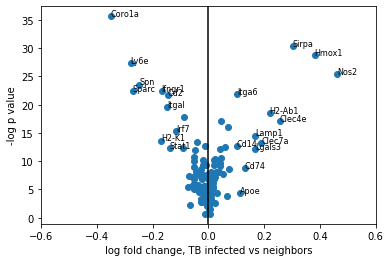

In [1663]:
#volcano
#change this plot by assigning zeros to a number smaller than the smallest p value possible
plt.scatter(x = rankedgenes.coef, y=-np.log10(rankedgenes.fdr))
plt.xlabel('log fold change, TB infected vs neighbors')
plt.ylabel('-log p value')
plt.xlim(-0.6,0.6)
plt.axvline(0, color='black')
#which labels to plot
threshold = 0.1
for i in range(rankedgenes.shape[0]):
    if abs(rankedgenes.coef[i])>threshold:
        plt.text(x=rankedgenes.coef[i],y=-np.log10(rankedgenes.fdr[i]),s=rankedgenes.primerid[i], fontdict=dict(color='black',size=8))

plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/TBinfected_vs_neighbors_volcano.pdf')

In [1668]:
#how do these genes compare to the single cell experiment? 
up_in_tb = rankedgenes.primerid.loc[(rankedgenes.fdr<0.01)&(rankedgenes.coef>0.1)]
down_in_tb = rankedgenes.primerid.loc[(rankedgenes.fdr<0.01)&(rankedgenes.coef<-0.1)]
down_in_tb

0     Coro1a
3       Ly6e
5        Spn
6     Ifngr1
7      Sparc
9        Cd2
10     Itgal
16      Irf7
18     H2-K1
25     Stat1
Name: primerid, dtype: object

<ipython-input-1677-07debdc9a961>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sc_data.var.UpINTB.loc[sc_data.var.index.isin(up_in_tb)]=True
<ipython-input-1677-07debdc9a961>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sc_data.var.DownINTB.loc[sc_data.var.index.isin(down_in_tb)]=True


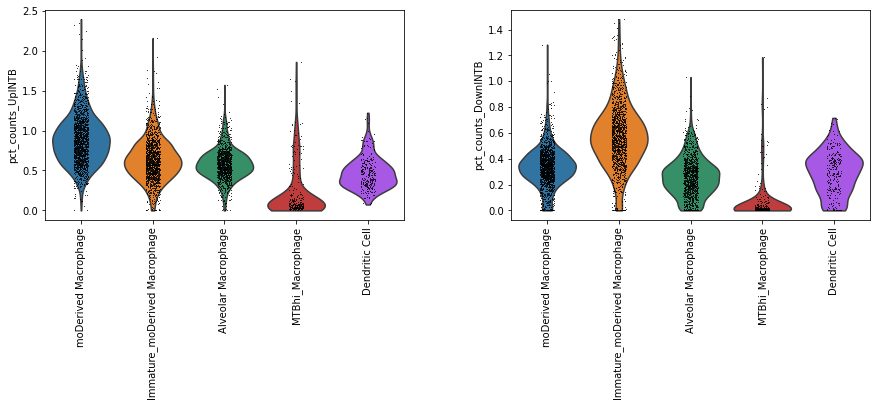

In [1677]:
sc_data.var['UpINTB'] = False
sc_data.var['DownINTB'] = False
sc_data.var.UpINTB.loc[sc_data.var.index.isin(up_in_tb)]=True
sc_data.var.DownINTB.loc[sc_data.var.index.isin(down_in_tb)]=True

#calculate qc metrics
sc.pp.calculate_qc_metrics(sc_data,qc_vars=['UpINTB','DownINTB'],inplace=True)

sc.pl.violin(sc_data,['pct_counts_UpINTB','pct_counts_DownINTB'],groupby='leiden',rotation=90)

In [1674]:
#I think for this analysis to work you actually have to pull out the macrophages

,highly.variable-new,mvp.mean-new,mvp.dispersion-new,mvp.dispersion.scaled-new,n_cells_by_counts-0-new,mean_counts-0-new,pct_dropout_by_counts-0-new,total_counts-0-new,n_cells_by_counts-1-new,mean_counts-1-new,...,DownNearTB,NotUpNearTB,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,UpINTB,DownINTB
Sox17,1,0.018019,3.446455,1.186667,87.0,0.157506,98.714539,1066.0,15.0,0.006362,...,False,False,23,0.001140,0.001139,99.538616,5.681479,1.899339,False,False
Gm22307,0,0.001055,1.226275,-0.340705,20.0,0.005171,99.704492,35.0,5.0,0.000936,...,False,False,11,0.000023,0.000023,99.779338,0.113862,0.107834,False,False
Gm6085,0,0.015034,1.243667,-0.328740,589.0,0.561614,91.297281,3801.0,534.0,0.236340,...,False,False,1009,0.008753,0.008715,79.759278,43.634632,3.798510,False,False
Gm6119,0,0.003507,1.970282,0.171135,37.0,0.019799,99.453310,134.0,1.0,0.030876,...,False,False,11,0.000545,0.000545,99.779338,2.717054,1.312931,False,False
Gm6123,0,0.005074,2.047048,0.223946,137.0,0.132535,97.975768,897.0,143.0,0.054454,...,False,False,244,0.001195,0.001195,95.105316,5.958688,1.939991,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mtNd5,0,1.409427,4.587567,-0.207073,2393.0,239.863480,64.642435,1623396.0,2451.0,71.238396,...,False,False,3561,0.794664,0.584818,28.565697,3961.395264,8.284604,False,False
mtNd6,1,0.790363,5.298417,0.858486,1852.0,72.482414,72.635934,490561.0,2282.0,13.750936,...,False,False,3420,0.399447,0.336077,31.394183,1991.238770,7.597014,False,False
mtCytb,1,2.913133,6.343054,1.635347,3165.0,2102.489258,53.235816,14229648.0,2971.0,383.622192,...,False,False,4391,1.846544,1.046106,11.915747,9205.043945,9.127616,False,False
mtTt,0,0.000023,-2.919829,-3.193017,9.0,0.004728,99.867021,32.0,1.0,0.000187,...,False,False,9,0.000031,0.000031,99.819458,0.155770,0.144767,False,False


In [1706]:
# #do most transcripts scale with cell size? 
# #plot total counts vs transcript counts
# adata.X = adata.layers['counts'].copy()
# for transcript in adata.var.index[:20]:
#     sc.pl.scatter(adata,x='total_counts',y=transcript,color='experiment_name')



202310091253_AmandaS-TB-02_VMSC02401_region0_Annotated
number of cells per bin:  Null    3084
Bin1    2471
Bin2    2159
Bin3     925
Bin4     727
Bin7     474
Name: Bin, dtype: int64


100%|██████████| 140/140 [02:27<00:00,  1.05s/it]


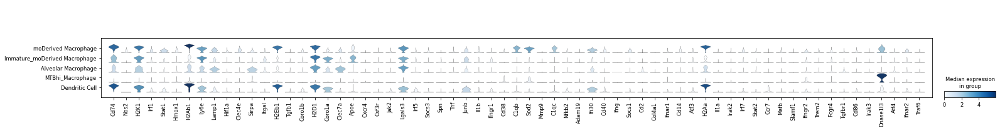

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


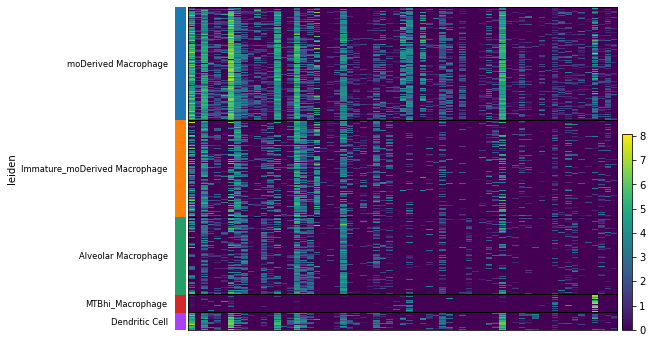

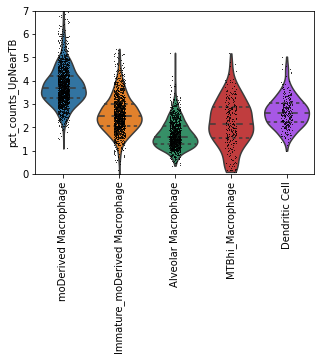

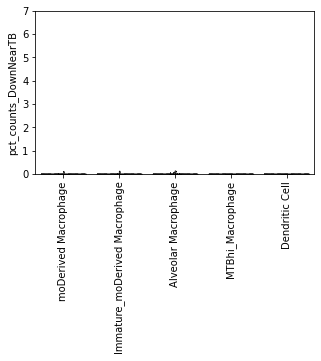

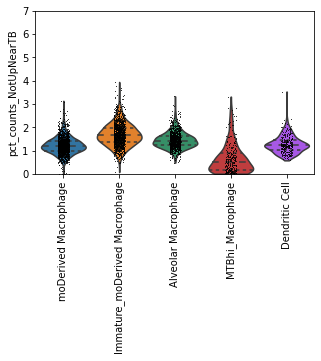

0.002
         sample_stat  average_stat  p_value
Lyve1      -0.240381     -0.000986   0.0009
Scarf2     -0.124980     -0.001043   0.0009
Mrc1       -0.085437      0.000274   0.0009
Plet1      -0.056059      0.001747   0.0100
Cx3cr1     -0.035666      0.000398   0.0020
Dusp1      -0.030799     -0.000532   0.1400
Ccl6       -0.029711     -0.000716   0.0260
Car4       -0.026456      0.000304   0.0030
Icam2      -0.022064     -0.000086   0.0380
Itga6      -0.019898     -0.000398   0.2870
Spp1       -0.009009     -0.000371   0.2240
Xcr1       -0.005030      0.000770   0.3230
Siglec1    -0.003919      0.000145   0.1940
Ly6c2       0.000206     -0.000027   0.4740
Blank15     0.000966      0.000012   0.4080
Krt79       0.001648     -0.000174   0.2970
Irs2        0.003168      0.000592   0.4310
Eif4e       0.003271     -0.000054   0.2250
Blank12     0.003385     -0.000085   0.0330
Ccl9        0.004051     -0.000584   0.2430
        sample_stat  average_stat  p_value
Cd74      11.097421      0.

100%|██████████| 140/140 [01:59<00:00,  1.17it/s]


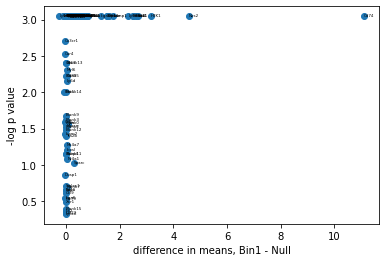

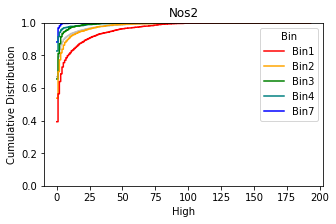

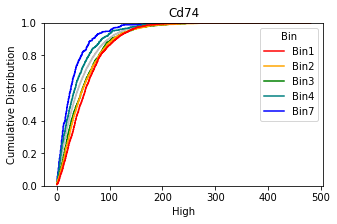

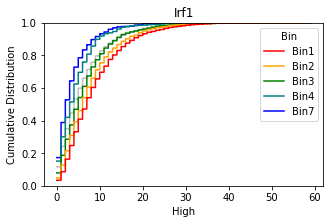

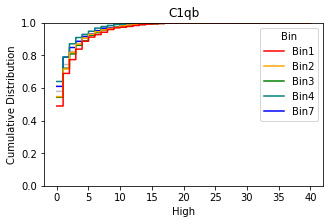

...

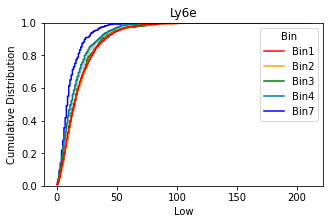

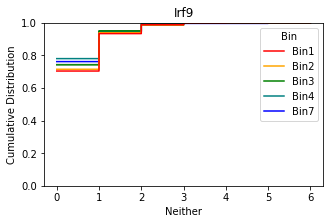

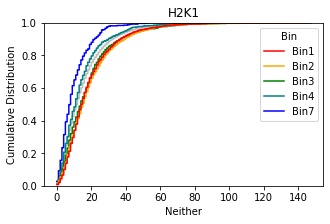

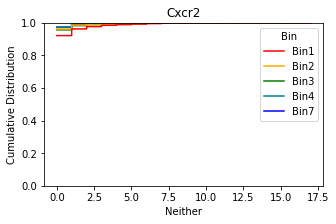

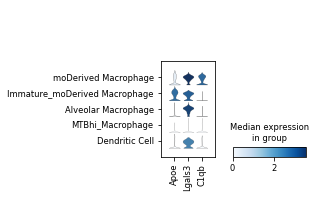

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


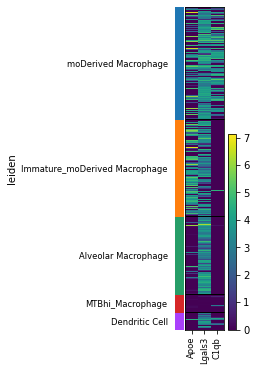

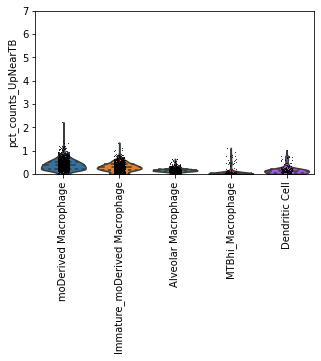

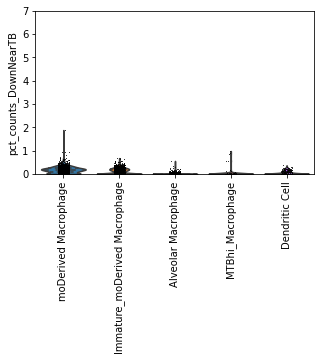

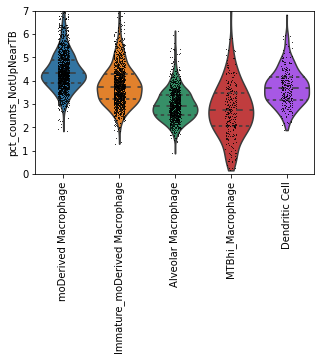

0.001
        sample_stat  average_stat  p_value
Ly6e      -4.143153      0.017819   0.0620
Jun       -1.468785     -0.006757   0.0170
Cd74      -1.413672     -0.134215   0.4140
Scarf2    -0.774517     -0.008403   0.0820
Cxcr4     -0.762913      0.024630   0.0300
Icam2     -0.590816      0.006270   0.0350
Dusp1     -0.509703      0.006012   0.2160
Car4      -0.369927      0.002759   0.0030
Fabp4     -0.332266     -0.002495   0.0009
Col4a1    -0.296351     -0.001065   0.4490
Cd40      -0.239176      0.000452   0.0009
Irak2     -0.236721      0.004650   0.0520
Spp1      -0.229328     -0.005899   0.0990
Stat1     -0.214400     -0.011514   0.2470
Pparg     -0.184372     -0.003401   0.0690
Ifngr1    -0.178157     -0.009272   0.3800
Ifnar2    -0.171249      0.004351   0.0920
Ly6c2     -0.148714     -0.003542   0.0009
Coro1a    -0.146304      0.030582   0.4540
Cd14      -0.144999      0.002944   0.0710
        sample_stat  average_stat  p_value
Apoe      19.225589      0.124789   0.0009
Lgals

100%|██████████| 140/140 [10:05<00:00,  4.33s/it]


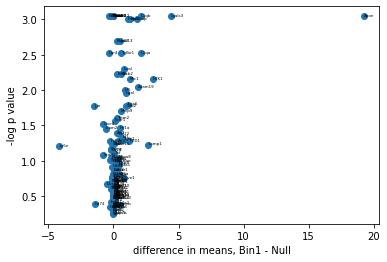

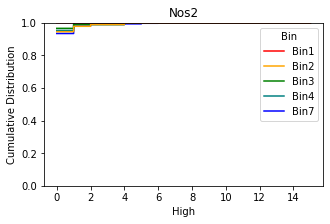

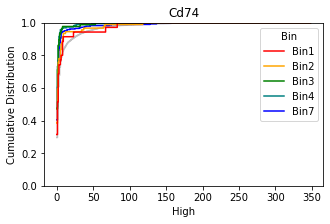

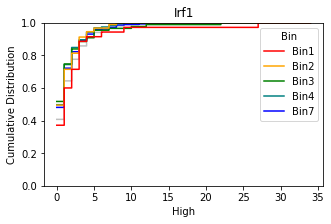

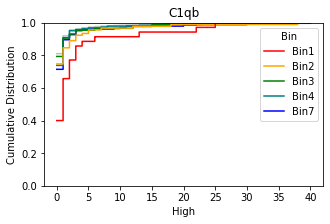

...

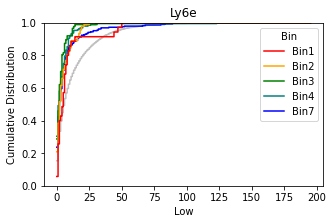

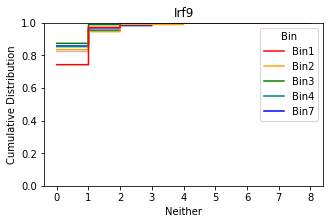

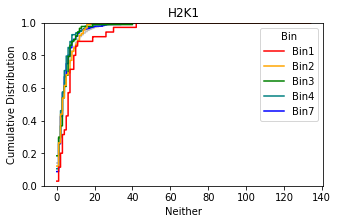

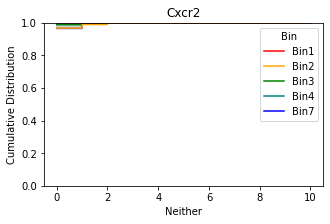

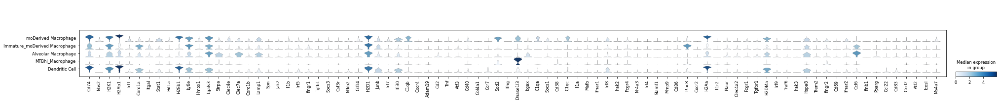

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


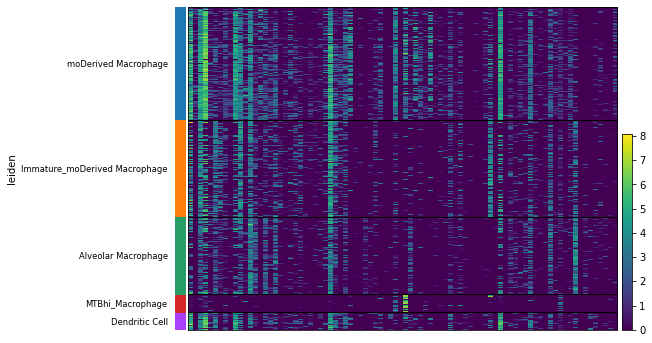

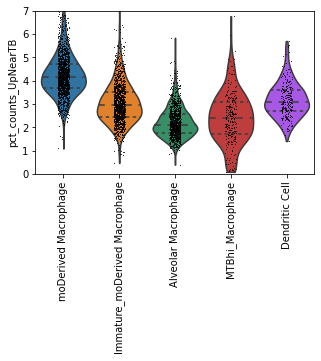

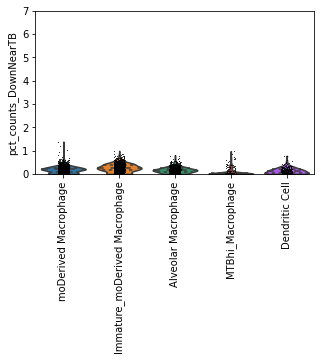

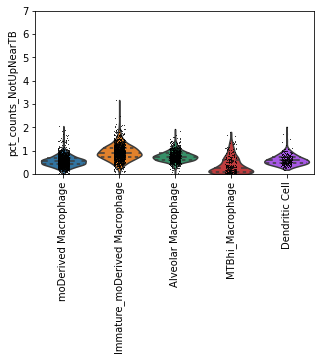

0.001
         sample_stat  average_stat  p_value
Dusp1      -0.996058      0.000628   0.0009
Scarf2     -0.947929      0.000982   0.0009
Lyve1      -0.639857      0.000531   0.0009
Jun        -0.580562      0.000957   0.0009
Itga6      -0.487592     -0.000669   0.0009
Icam2      -0.351168     -0.000193   0.0009
Car4       -0.290816      0.000009   0.0009
Sparc      -0.233017     -0.002972   0.1820
Mrc1       -0.144636     -0.001023   0.0009
Ly6c2      -0.121551      0.000904   0.0009
Irs2       -0.108149     -0.000317   0.0009
Atf4       -0.094759     -0.000107   0.0009
Myl6       -0.075254     -0.000725   0.0009
Xcr1       -0.030862      0.000196   0.0010
Dpp4       -0.026607      0.000390   0.0009
Plet1      -0.023633      0.000226   0.0940
Apoe       -0.023431     -0.001552   0.3220
Stat2      -0.019292      0.001570   0.2210
Siglec1    -0.013073      0.000107   0.0050
Tgfb2      -0.005840     -0.000056   0.2340
        sample_stat  average_stat  p_value
Cd74      16.215909     -0.

100%|██████████| 140/140 [03:28<00:00,  1.49s/it]


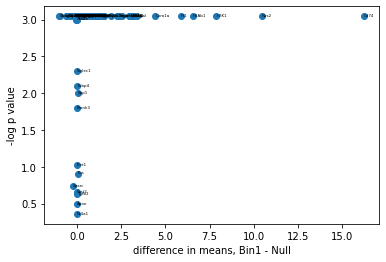

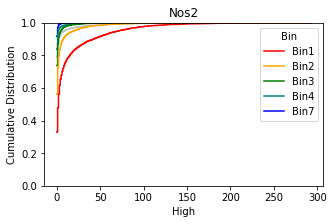

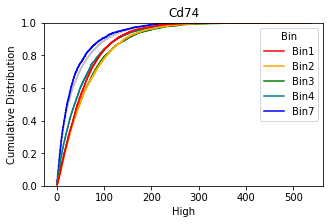

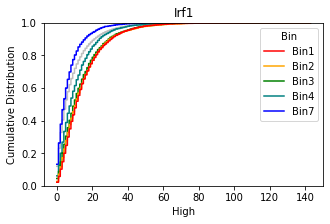

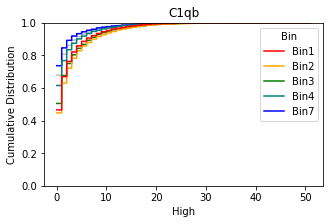

...

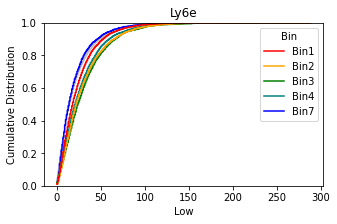

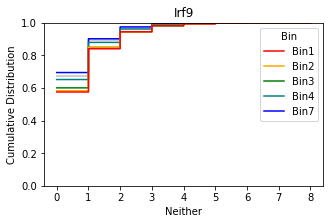

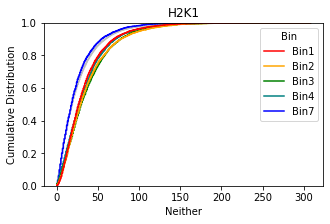

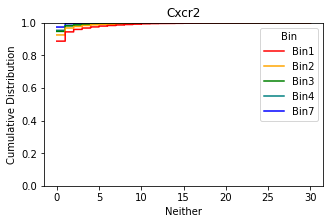

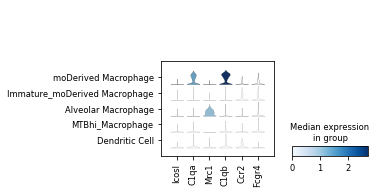

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


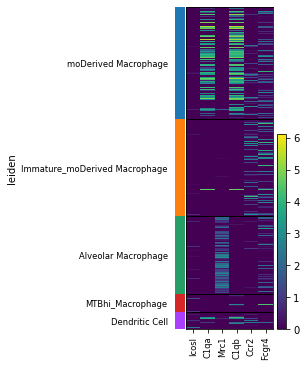

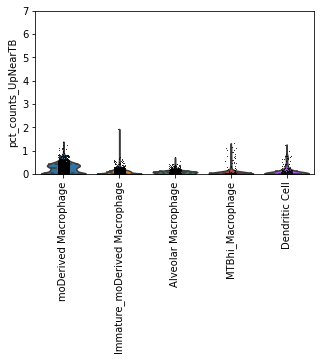

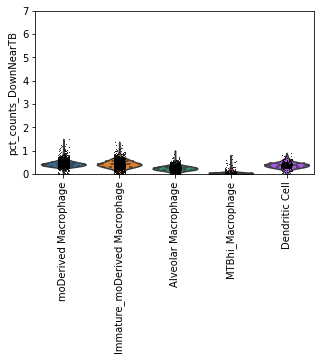

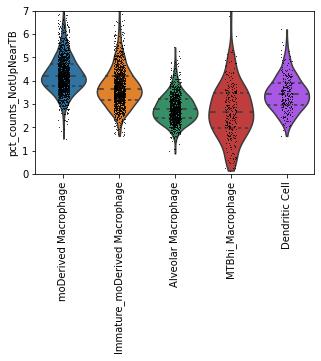

0.001
        sample_stat  average_stat  p_value
H2K1      -4.154340      0.035484   0.0009
H2D1      -1.706957      0.006105   0.0009
Col4a1    -1.634277     -0.006659   0.0230
Ly6e      -1.442557     -0.026299   0.1990
Dusp1     -1.339689     -0.013585   0.0480
Cd74      -1.259201      0.059386   0.2730
Itga6     -1.215748     -0.020841   0.0020
Cxcr4     -0.983457     -0.007632   0.0009
Ifngr1    -0.676907      0.001650   0.0040
Lamp1     -0.664382     -0.011990   0.1630
Scarf2    -0.539708     -0.002203   0.1330
Adam19    -0.515851      0.014840   0.0100
Tgfb1     -0.481763     -0.008897   0.0320
Irf1      -0.435745      0.006533   0.0360
Icam2     -0.434953      0.013253   0.0330
Dpp4      -0.424330      0.003526   0.0009
Lyve1     -0.333112     -0.008700   0.3190
Cd38      -0.319145      0.001505   0.0010
Car4      -0.314930      0.020534   0.1500
Ifnar1    -0.294458      0.000223   0.0090
       sample_stat  average_stat  p_value
Sparc     7.945424      0.070506   0.0010
Apoe   

100%|██████████| 140/140 [07:31<00:00,  3.22s/it]


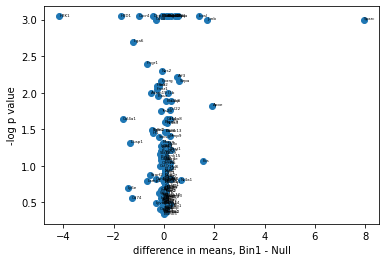

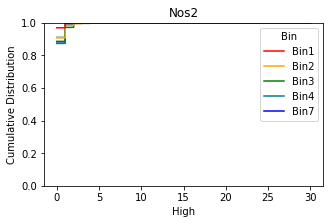

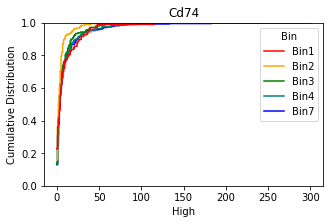

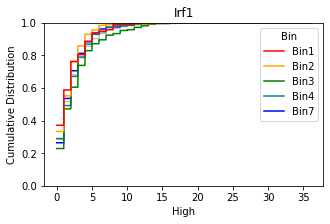

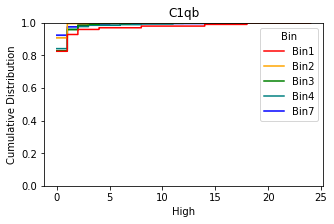

...

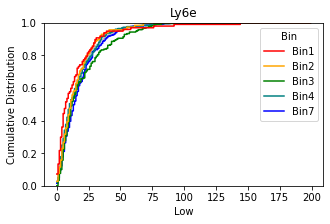

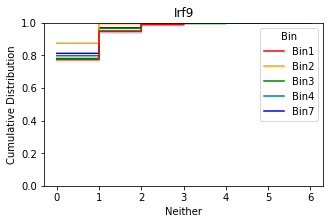

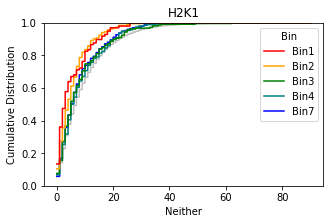

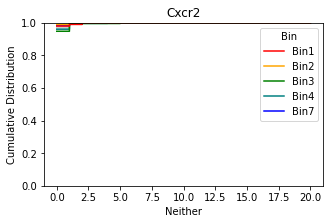

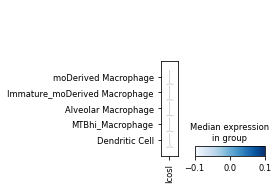

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


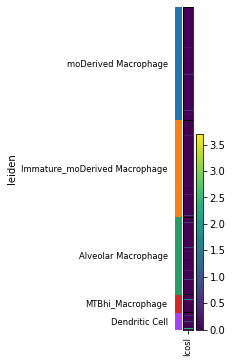

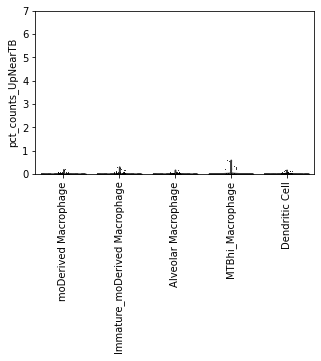

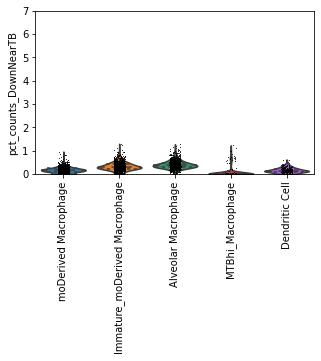

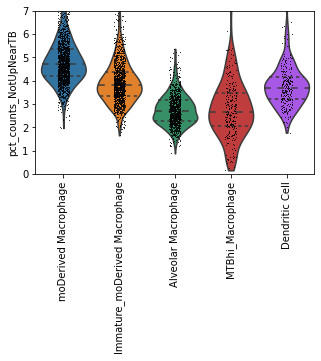

0.001
        sample_stat  average_stat  p_value
Cd74      -4.518352      0.070396   0.0710
Apoe      -2.027730      0.037742   0.0500
Ly6d      -2.004549      0.026744   0.0009
Lamp1     -1.872972     -0.018639   0.0220
H2Ab1     -1.223064     -0.020918   0.0520
H2Eb1     -1.192030      0.003865   0.0090
Lgals3    -0.952101      0.003468   0.0230
Coro1a    -0.863922      0.020688   0.0100
Nr4a1     -0.685768     -0.014109   0.0009
Plet1     -0.607434     -0.005596   0.0009
Hmox1     -0.592902      0.005634   0.0009
Hif1a     -0.526564     -0.001068   0.0009
H2D1      -0.428900     -0.027624   0.1440
Irf5      -0.420873     -0.004011   0.0200
Ifi30     -0.408451      0.004264   0.0010
Atf4      -0.404250     -0.011047   0.1090
C1qb      -0.364842     -0.007273   0.0390
Il1r2     -0.357205      0.007706   0.0020
Junb      -0.352674      0.004156   0.0390
Fos       -0.331260      0.017952   0.0010
         sample_stat  average_stat  p_value
Sparc       6.964150     -0.170379   0.0140
Ico

100%|██████████| 140/140 [04:11<00:00,  1.80s/it]


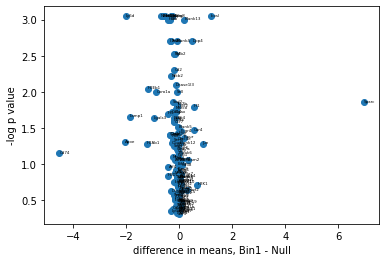

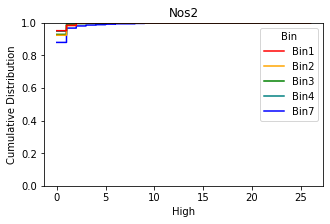

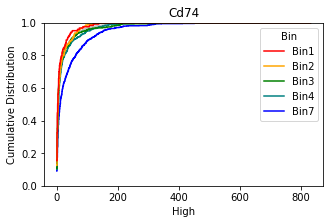

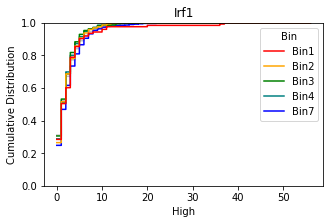

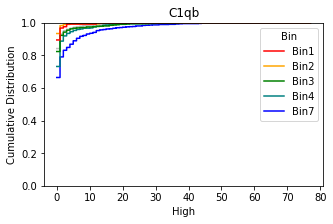

...

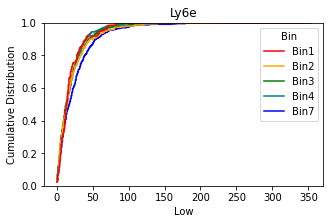

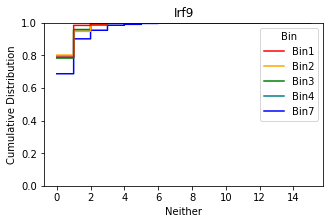

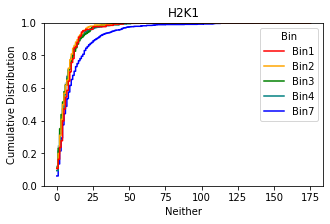

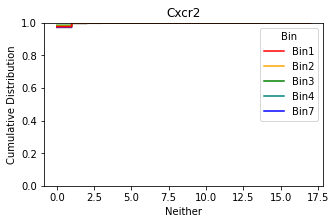

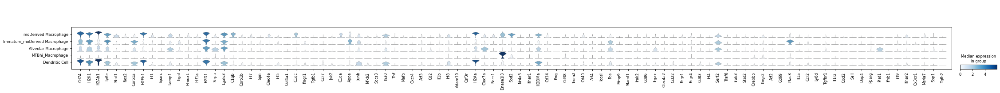

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


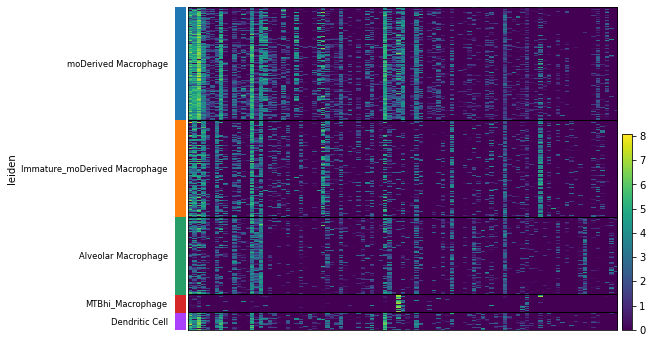

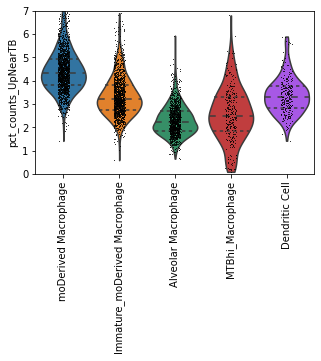

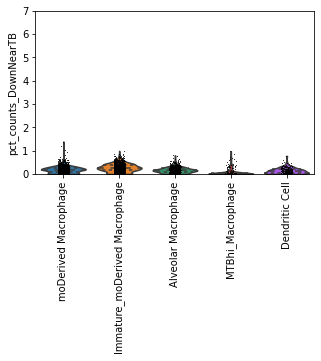

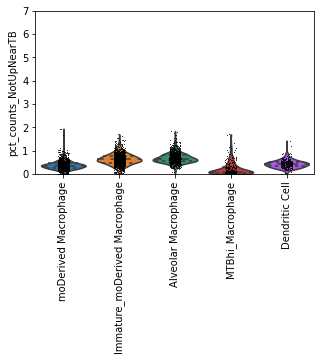

0.001
         sample_stat  average_stat  p_value
Lyve1      -2.081053      0.005120   0.0009
Jun        -1.080656     -0.002140   0.0009
Itga6      -1.056471      0.000597   0.0009
Dusp1      -0.977017      0.000649   0.0009
Scarf2     -0.842130     -0.001826   0.0009
Icam2      -0.422702      0.000419   0.0009
Car4       -0.293292     -0.002599   0.0009
Mrc1       -0.181884      0.002334   0.0009
Ly6c2      -0.116279      0.001958   0.0009
Ccl6       -0.067911      0.000317   0.0020
Siglec1    -0.023968     -0.000232   0.0780
Nr4a1      -0.013533      0.002393   0.4070
Xcr1       -0.001321      0.000164   0.4860
Blank9      0.002190     -0.000054   0.2050
Krt79       0.004410      0.000061   0.2920
Blank12     0.011496      0.000122   0.0009
Blank3      0.011929     -0.000122   0.0009
Myl6        0.014564     -0.000273   0.3050
Blank14     0.015244      0.000052   0.0009
Eif4e       0.018545      0.000301   0.0220
        sample_stat  average_stat  p_value
Cd74      47.374809     -0.

100%|██████████| 140/140 [06:07<00:00,  2.63s/it]


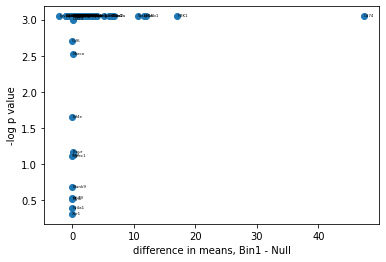

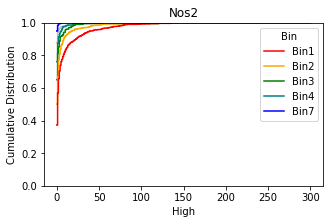

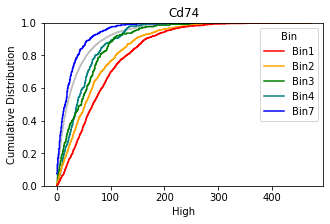

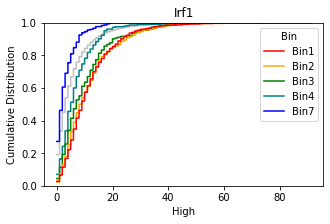

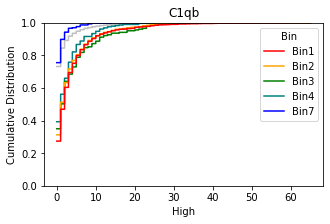

...

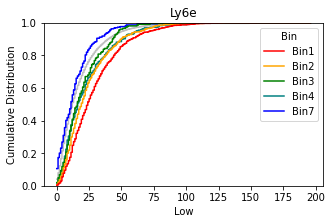

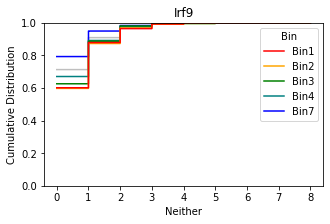

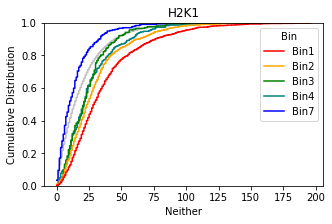

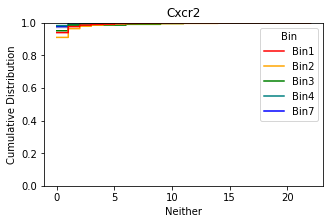

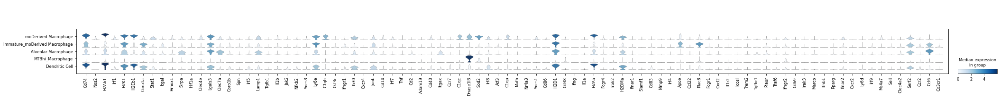

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


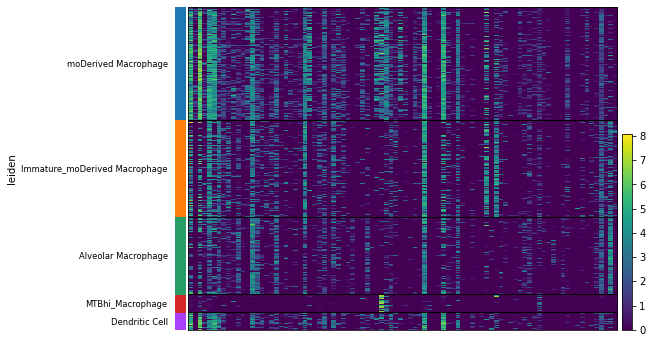

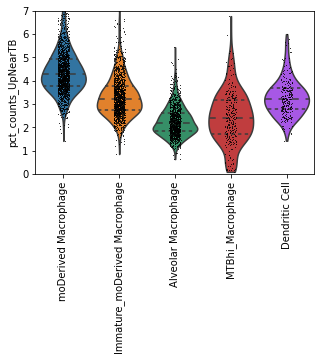

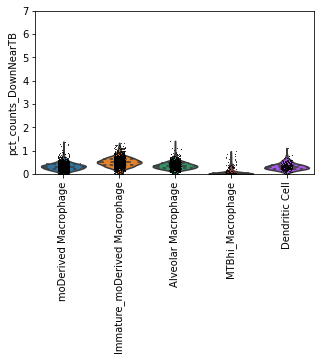

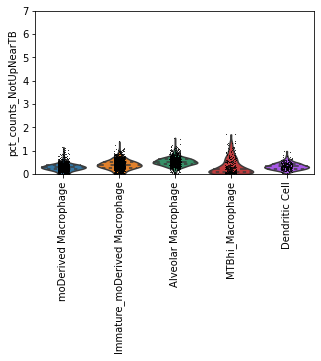

0.001
        sample_stat  average_stat  p_value
Dusp1     -1.443864      0.000766   0.0009
Scarf2    -1.192211      0.000441   0.0009
Sparc     -1.115809     -0.006931   0.0010
Jun       -1.011499      0.000534   0.0009
Lyve1     -0.695080      0.000362   0.0009
Itga6     -0.690018      0.000171   0.0009
Icam2     -0.375864      0.001261   0.0009
Car4      -0.310202     -0.000339   0.0009
Nr4a1     -0.229819     -0.000620   0.0009
Irs2      -0.176385      0.000754   0.0009
Mrc1      -0.167941     -0.001288   0.0009
Atf4      -0.147896     -0.000121   0.0009
Stat2     -0.130376     -0.000022   0.0009
Myl6      -0.115304     -0.000830   0.0009
Dpp4      -0.114320      0.000357   0.0009
Ly6c2     -0.107241     -0.000088   0.0009
Plet1     -0.095142      0.000120   0.0009
Tgfb2     -0.063215      0.000781   0.0009
Spp1      -0.053052     -0.000657   0.0009
Col4a1    -0.048672     -0.002609   0.3180
        sample_stat  average_stat  p_value
Cd74      24.341214      0.033892   0.0009
Nos2 

100%|██████████| 140/140 [10:09<00:00,  4.36s/it]


too little data for stacked violin


/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:1179: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  im = heatmap_ax.imshow(obs_tidy.values, aspect='auto', norm=norm, **kwds)
/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:1182: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  heatmap_ax.set_xlim(-0.5, obs_tidy.shape[1] - 0.5)
/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


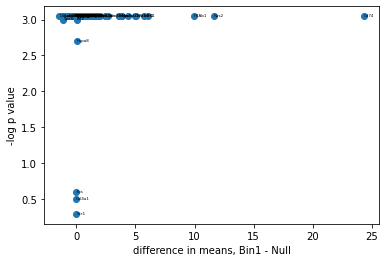

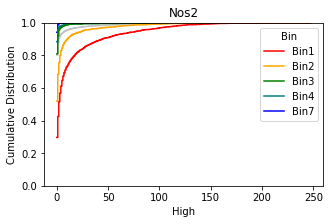

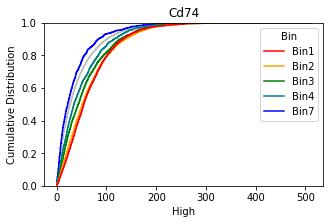

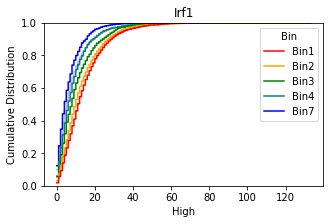

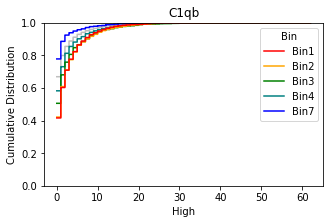

...

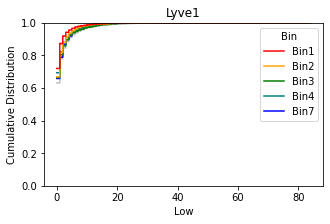

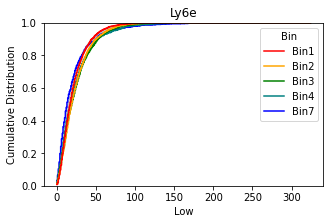

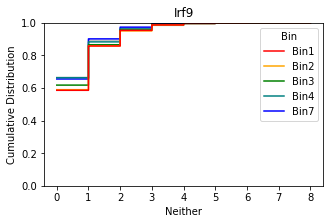

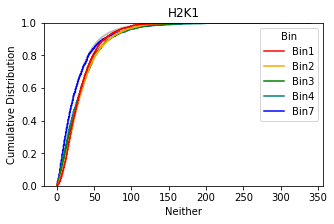

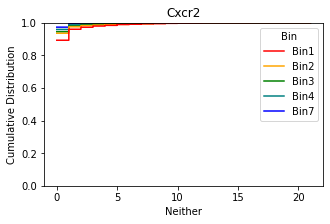

<Figure size 108x198 with 0 Axes>

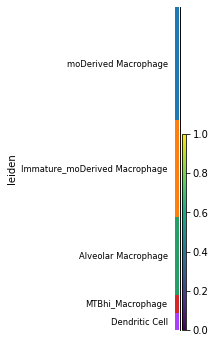

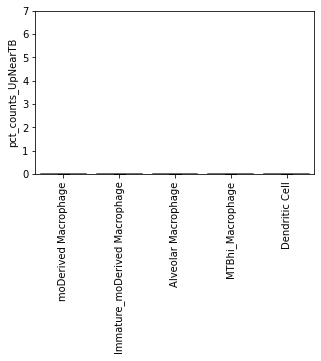

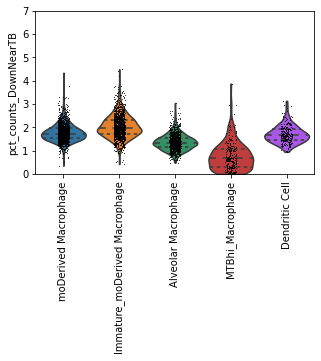

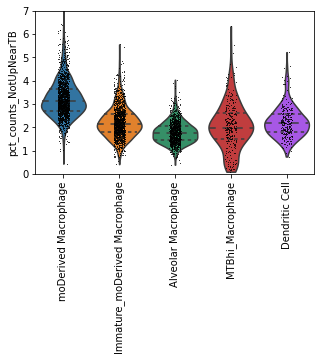

0.001
        sample_stat  average_stat  p_value
Ly6e      -7.662894      0.063745   0.0009
Sparc     -3.536417     -0.023456   0.0090
Col4a1    -3.457507      0.003115   0.0009
H2K1      -3.319105      0.026648   0.0009
Cd74      -3.154162     -0.016110   0.0009
Dusp1     -2.770829      0.012707   0.0009
Lamp1     -2.477691     -0.013622   0.0009
Jun       -2.143582      0.003493   0.0009
Fos       -1.758985      0.007232   0.0009
H2D1      -1.621319      0.009594   0.0009
Lyve1     -1.575444     -0.001286   0.0009
Scarf2    -1.387218     -0.007230   0.0009
Nr4a1     -1.118023     -0.016020   0.0009
Atf4      -1.038661      0.000344   0.0009
Irf1      -0.994575     -0.000375   0.0009
Itga6     -0.984503     -0.000795   0.0009
Ifngr1    -0.923488      0.006768   0.0009
Junb      -0.888793     -0.002007   0.0009
H2Ab1     -0.797248     -0.018936   0.0020
Cxcr4     -0.673691      0.003339   0.0009
         sample_stat  average_stat  p_value
Apoe        0.976516     -0.039392    0.024
C1q

100%|██████████| 140/140 [09:35<00:00,  4.11s/it]


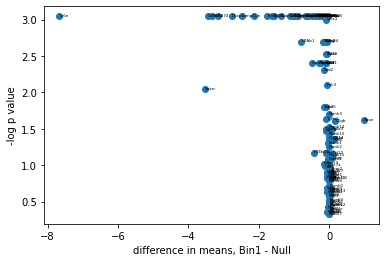

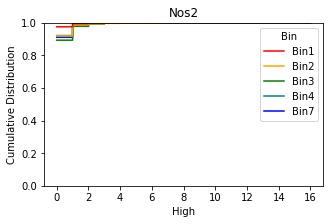

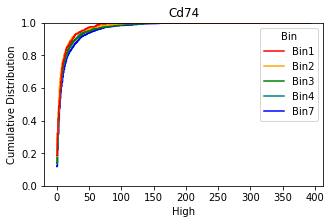

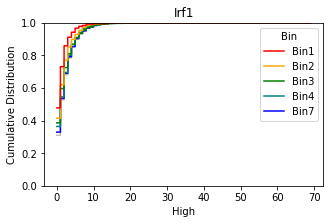

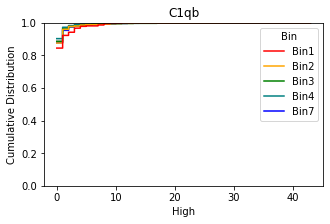

...

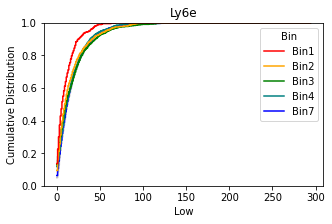

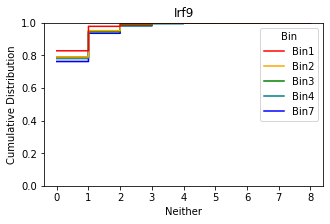

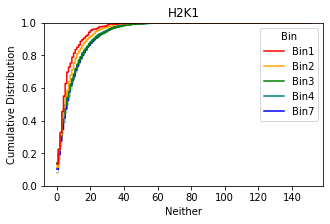

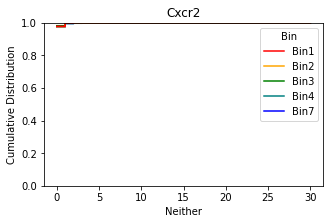

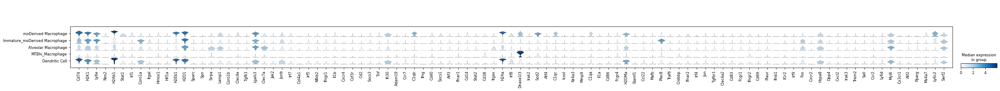

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


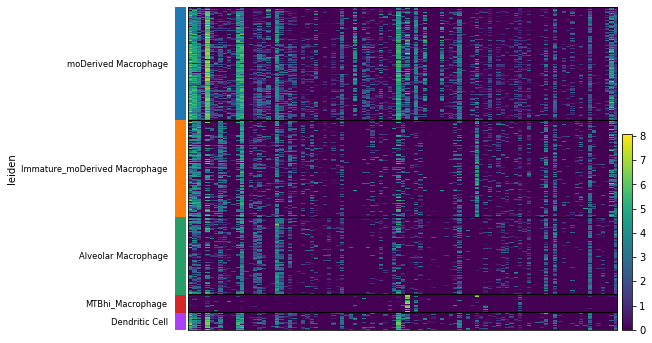

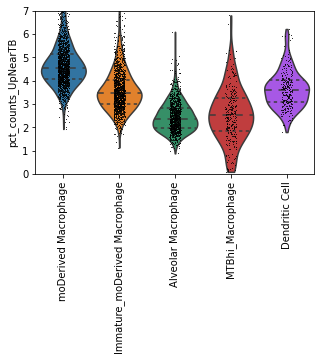

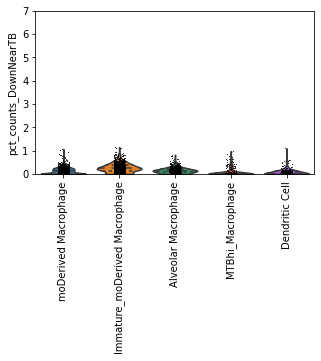

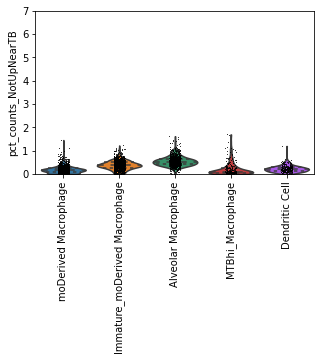

0.002
         sample_stat  average_stat  p_value
Apoe       -0.937512      0.005803   0.0009
Lyve1      -0.768073     -0.001186   0.0009
Dusp1      -0.407120     -0.000325   0.0009
Scarf2     -0.298099      0.001951   0.0009
Mrc1       -0.293130     -0.000102   0.0009
Itga6      -0.166982     -0.002000   0.0020
Car4       -0.130389      0.001169   0.0009
Marco      -0.084900     -0.000908   0.0450
Ccl6       -0.066056      0.000105   0.0070
Icam2      -0.047485      0.000422   0.0360
Irs2       -0.046130      0.000216   0.0610
Siglec1    -0.026367      0.000079   0.0090
Fabp4      -0.019596     -0.001377   0.3100
Xcr1        0.004869     -0.000376   0.3910
Krt79       0.009075      0.000023   0.0630
Blank9      0.009511     -0.000124   0.0009
Ccl9        0.010903      0.000653   0.1820
Blank14     0.014654     -0.000049   0.0009
Blank12     0.014972     -0.000037   0.0009
Blank3      0.015310      0.000031   0.0009
        sample_stat  average_stat  p_value
Cd74      39.265899      0.

100%|██████████| 140/140 [00:46<00:00,  3.02it/s]


too little data for stacked violin


/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:1179: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  im = heatmap_ax.imshow(obs_tidy.values, aspect='auto', norm=norm, **kwds)
/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:1182: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  heatmap_ax.set_xlim(-0.5, obs_tidy.shape[1] - 0.5)
/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


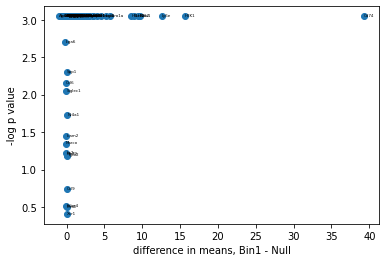

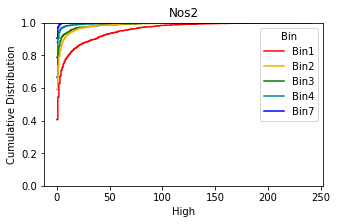

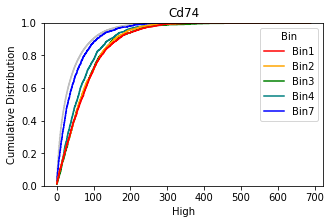

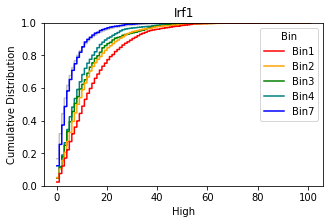

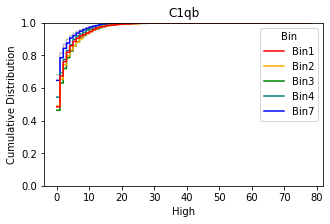

...

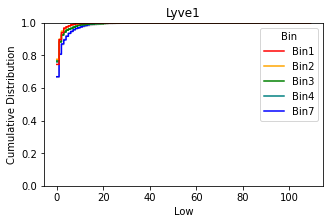

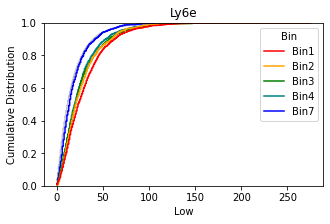

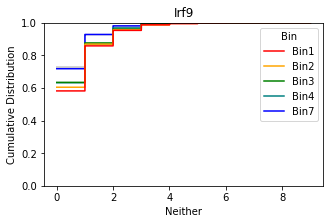

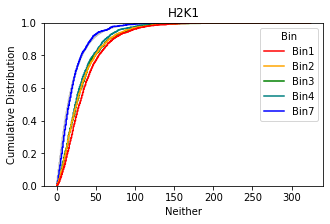

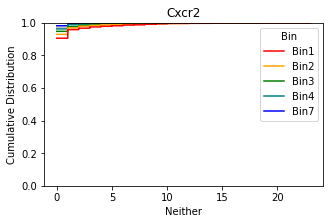

<Figure size 108x198 with 0 Axes>

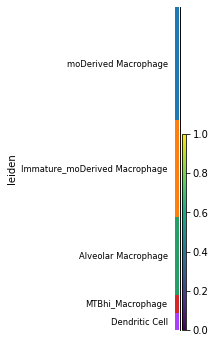

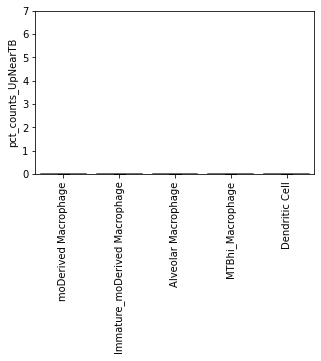

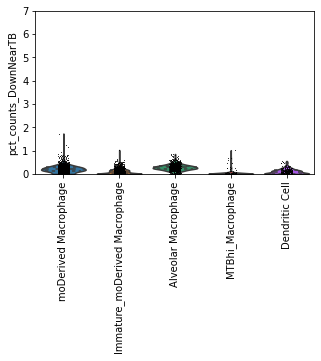

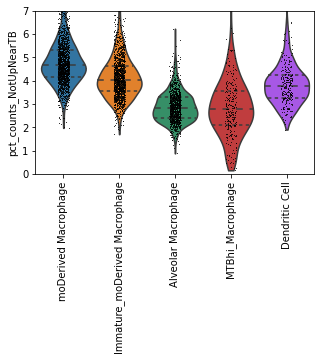

0.004
        sample_stat  average_stat  p_value
Ly6e      -1.559321      0.172612   0.3170
Coro1a    -0.619310     -0.022910   0.3020
Sirpa     -0.573678      0.006988   0.0220
Icosl     -0.450028      0.000039   0.0040
Stat2     -0.409126     -0.006593   0.0070
Apoe      -0.398831     -0.055031   0.4460
Icam2     -0.380134     -0.011534   0.2850
Car4      -0.359599     -0.016199   0.2740
Plet1     -0.346522     -0.008322   0.1750
Lyve1     -0.290985      0.015482   0.5060
Ccl22     -0.278909     -0.020709   0.0280
Itgal     -0.250640     -0.012840   0.1930
Junb      -0.245353      0.003913   0.2810
Irf5      -0.238008      0.010592   0.1030
Mrc1      -0.215359     -0.012159   0.0009
Tgfbr1    -0.210684     -0.002884   0.0950
Pparg     -0.185309      0.001091   0.0009
Cd40      -0.184808     -0.010808   0.1630
Irf9      -0.183639     -0.003506   0.0009
Irf8      -0.169560     -0.004760   0.0750
        sample_stat  average_stat  p_value
Sparc      3.150640      0.006840    0.216
Col4a

100%|██████████| 140/140 [06:04<00:00,  2.60s/it]


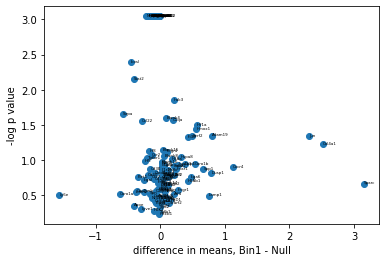

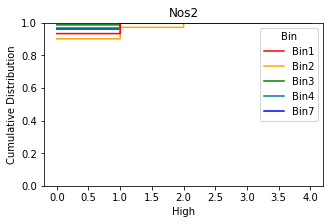

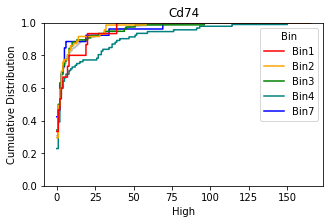

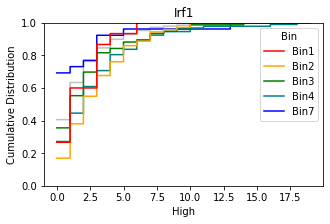

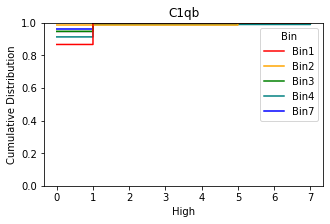

...

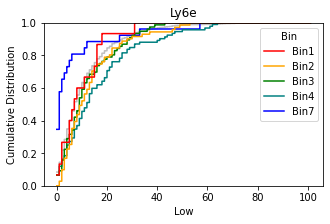

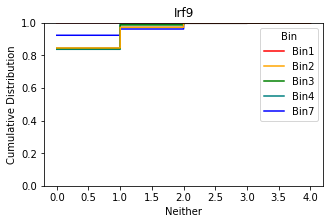

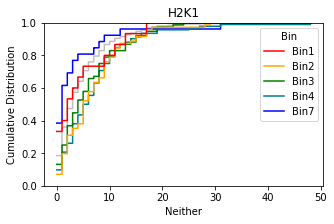

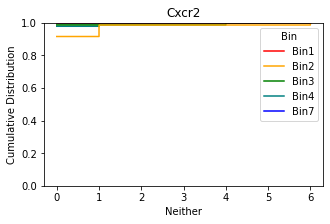

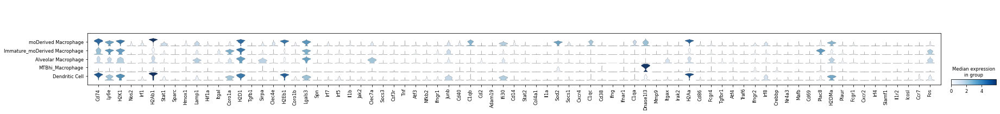

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


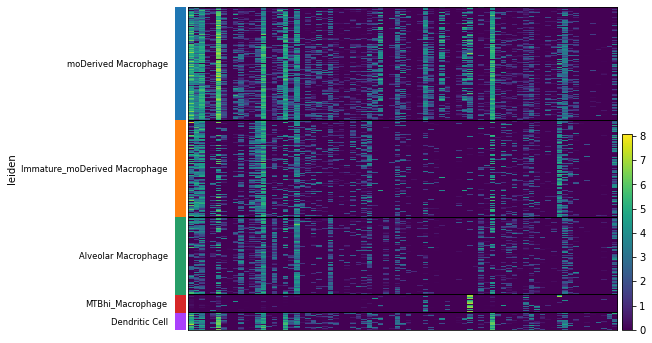

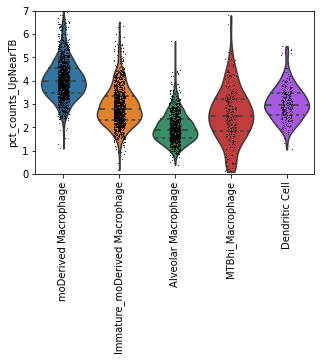

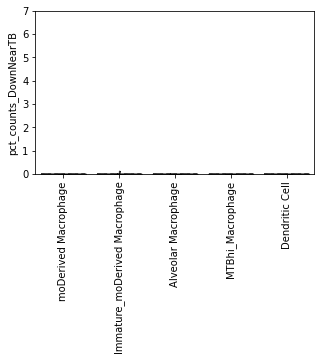

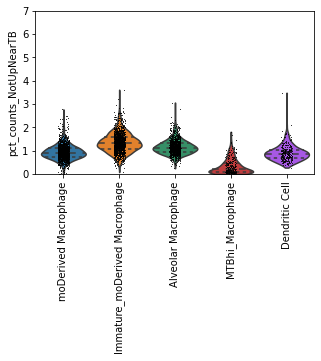

0.001
         sample_stat  average_stat  p_value
Lyve1      -0.610251     -0.000355   0.0009
Itga6      -0.115044      0.001671   0.0010
Scarf2     -0.096528      0.000767   0.0009
Dusp1      -0.089303     -0.000501   0.0009
Mrc1       -0.078523      0.000153   0.0009
Car4       -0.047995      0.000134   0.0009
Icam2      -0.033899      0.000269   0.0030
Irs2       -0.027864     -0.000194   0.0220
Marco      -0.008436      0.000371   0.1910
Xcr1       -0.008313     -0.000149   0.2250
Krt79      -0.002754      0.000005   0.1880
Blank11     0.001176     -0.000047   0.3140
Myl6        0.001688     -0.000188   0.4040
Blank9      0.002609      0.000186   0.1140
Blank14     0.003552      0.000125   0.0520
Blank12     0.003640     -0.000117   0.0210
Blank3      0.004793     -0.000139   0.0140
Spp1        0.005899     -0.000175   0.2670
Siglec1     0.006110     -0.000098   0.0850
Blank6      0.010106      0.000004   0.0009
        sample_stat  average_stat  p_value
Cd74      16.889881      0.

100%|██████████| 140/140 [1:26:11<00:00, 36.94s/it]


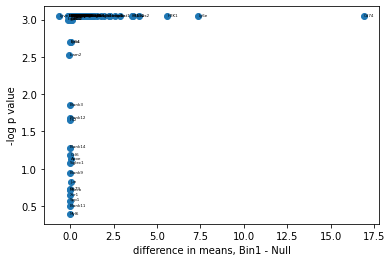

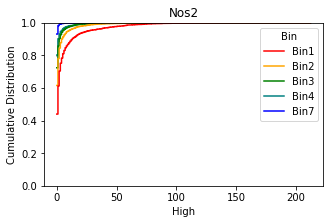

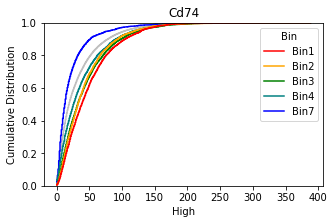

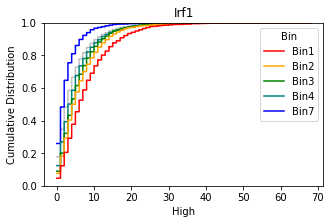

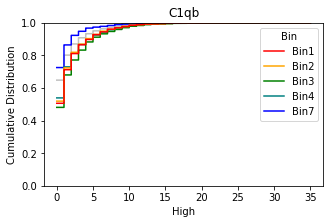

...

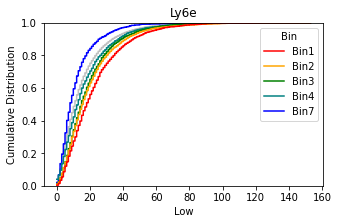

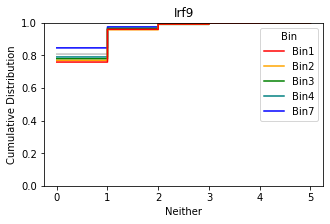

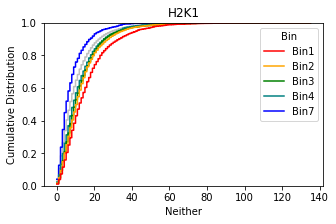

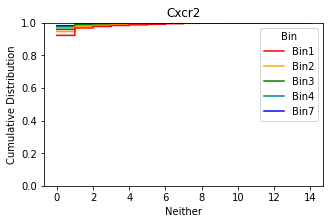

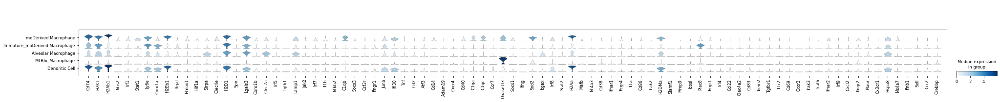

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


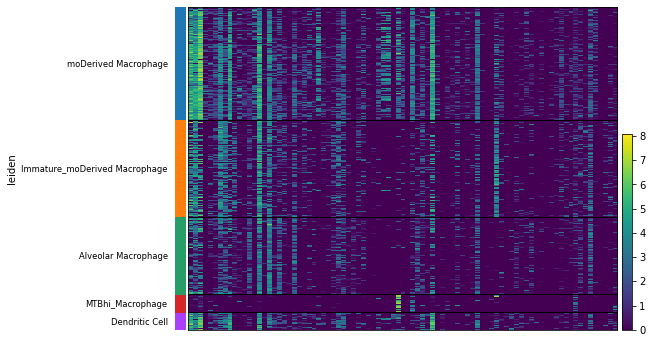

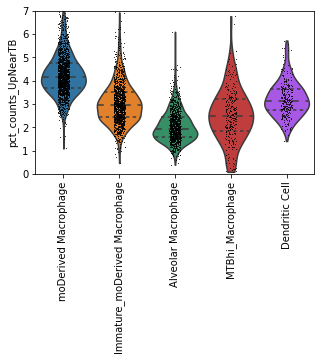

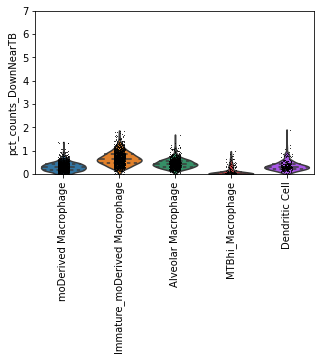

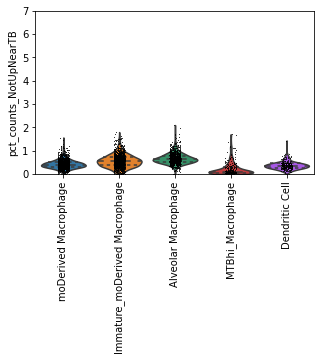

0.004
        sample_stat  average_stat  p_value
Lyve1     -1.173971      0.001178   0.0009
Dusp1     -1.146137      0.000365   0.0009
Scarf2    -0.975055     -0.000356   0.0009
Jun       -0.796372     -0.000196   0.0009
Itga6     -0.703416     -0.000495   0.0009
Sparc     -0.607445     -0.001716   0.0009
Icam2     -0.456780     -0.000239   0.0009
Apoe      -0.442579     -0.000608   0.0009
Car4      -0.366306      0.000494   0.0009
Nr4a1     -0.299408      0.000228   0.0009
Fos       -0.211394     -0.000038   0.0009
Mrc1      -0.198510     -0.000086   0.0009
Irs2      -0.152689     -0.000150   0.0009
Atf4      -0.147188     -0.000161   0.0009
Myl6      -0.122979      0.000150   0.0009
Col4a1    -0.103872     -0.002142   0.0040
Dpp4      -0.062345     -0.000039   0.0009
Ly6d      -0.060178      0.000327   0.0009
Spp1      -0.056184      0.000278   0.0009
Tgfb2     -0.042748      0.000218   0.0009
        sample_stat  average_stat  p_value
Cd74      31.878192     -0.004892   0.0009
H2K1 

100%|██████████| 140/140 [13:52<00:00,  5.94s/it]


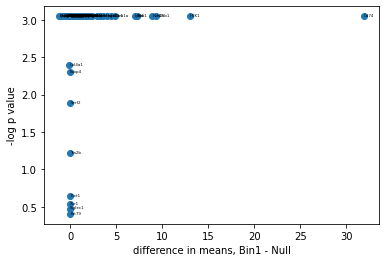

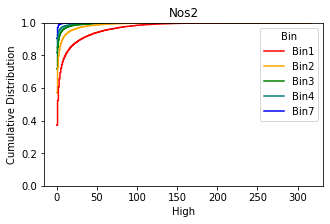

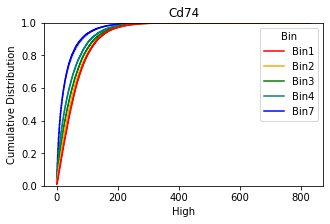

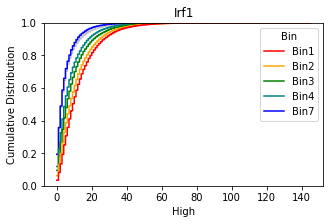

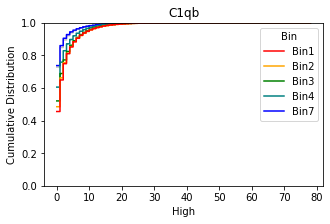

...

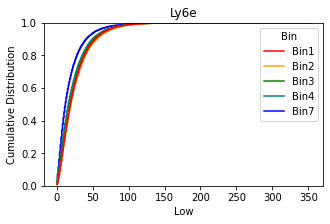

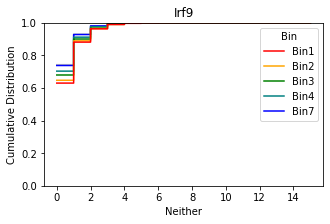

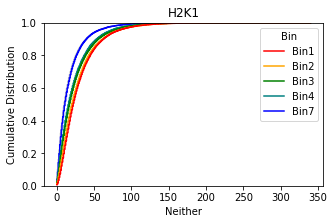

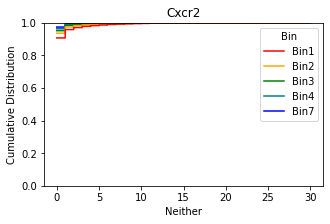

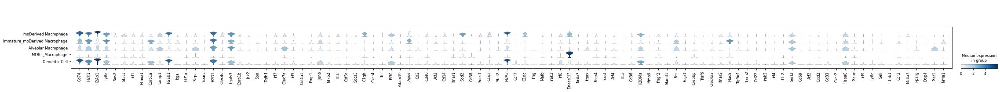

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


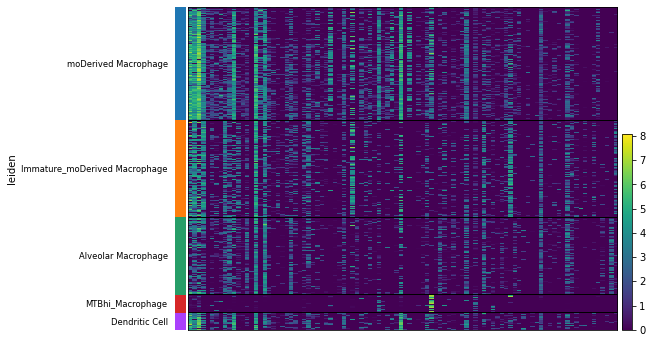

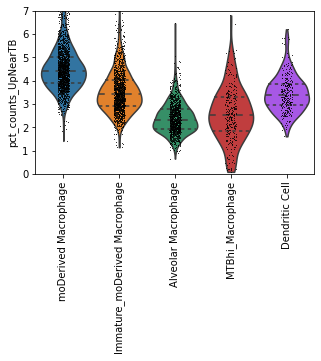

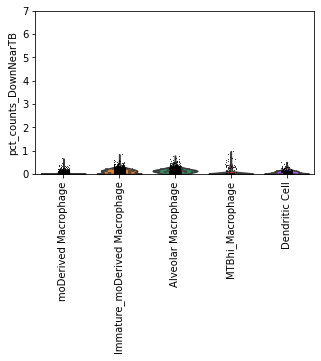

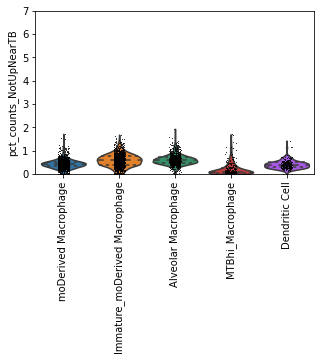

0.001
         sample_stat  average_stat  p_value
Lyve1      -0.832114      0.000663   0.0009
Itga6      -0.535387     -0.001672   0.0009
Scarf2     -0.424903      0.000615   0.0009
Dusp1      -0.366082      0.000006   0.0009
Car4       -0.262394      0.000534   0.0009
Icam2      -0.251416      0.000141   0.0009
Mrc1       -0.139199      0.000303   0.0009
Jun        -0.135678      0.001060   0.0010
Xcr1       -0.040036      0.000066   0.0009
Spp1       -0.018200      0.000209   0.0720
Irs2       -0.004203     -0.000676   0.3890
Ccl6        0.002916      0.000251   0.4110
Siglec1     0.004079      0.000093   0.2460
Marco       0.004575     -0.000102   0.3570
Krt79       0.008545     -0.000031   0.0070
Blank9      0.009053     -0.000010   0.0009
Blank3      0.009277      0.000024   0.0009
Blank12     0.010784      0.000039   0.0009
Blank14     0.011228     -0.000024   0.0009
Ly6c2       0.012199      0.001008   0.1850
        sample_stat  average_stat  p_value
Cd74      29.924171      0.

100%|██████████| 140/140 [13:33<00:00,  5.81s/it]


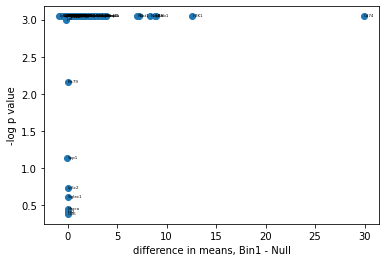

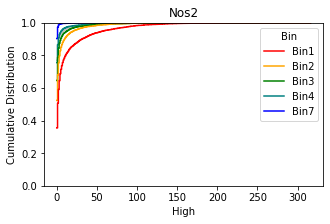

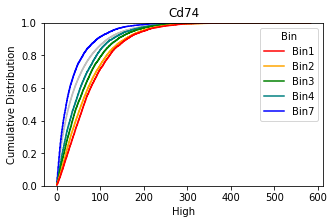

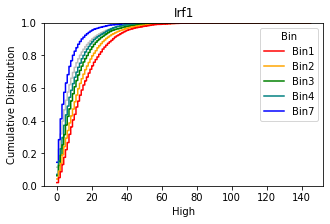

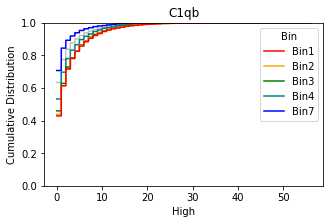

...

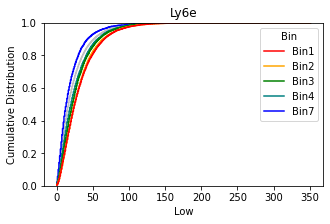

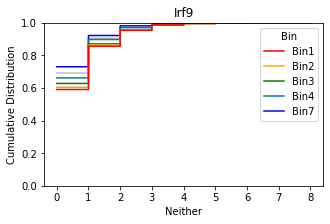

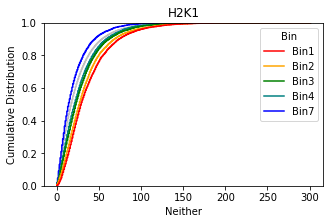

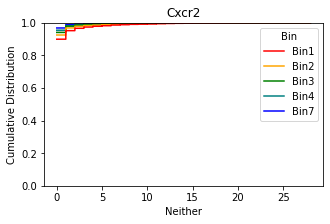

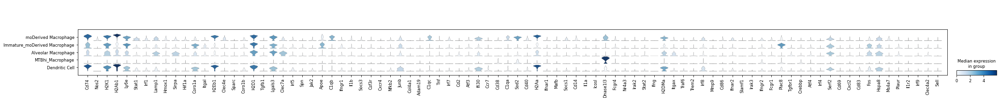

/home/leah.dorman/.conda/envs/popv/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


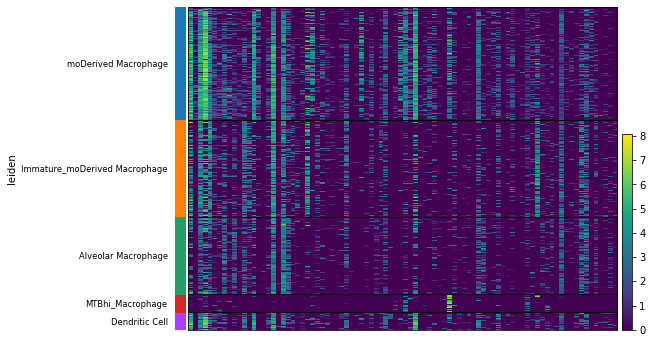

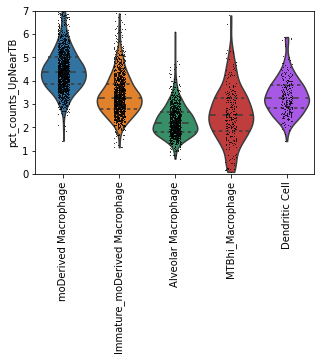

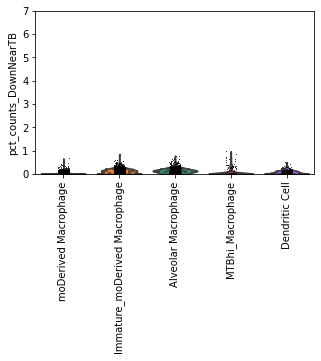

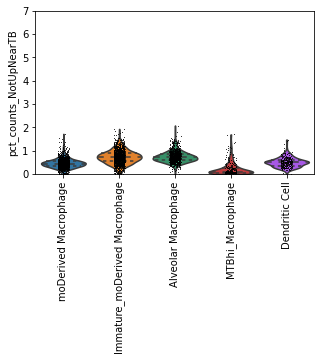

0.003
         sample_stat  average_stat  p_value
Lyve1      -0.797391  1.559860e-03   0.0009
Dusp1      -0.241352  1.613592e-03   0.0009
Scarf2     -0.198534 -5.220847e-04   0.0009
Itga6      -0.141154 -9.777831e-04   0.0009
Icam2      -0.111982  3.600913e-04   0.0009
Car4       -0.111884 -9.665966e-04   0.0009
Mrc1       -0.103722 -4.074201e-04   0.0009
Plet1      -0.096223 -1.851304e-03   0.0009
Xcr1       -0.062470 -2.039051e-04   0.0009
Ccl6       -0.027527  1.791207e-04   0.0300
Marco       0.000396  3.368044e-04   0.4570
Ly6c2       0.002532  1.860978e-04   0.4260
Krt79       0.005433  1.591732e-05   0.0780
Blank12     0.009016  2.009224e-05   0.0009
Blank3      0.009387  5.887576e-05   0.0009
Spp1        0.010421  2.377662e-04   0.1900
Ccl22       0.014416  2.674150e-03   0.3630
Blank14     0.014736  6.196466e-08   0.0009
Siglec1     0.017492 -1.237496e-04   0.0050
Blank9      0.018341  4.465666e-05   0.0009
        sample_stat  average_stat  p_value
Cd74      26.995699     -0.

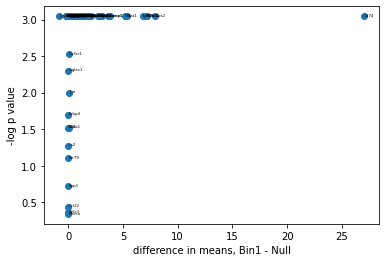

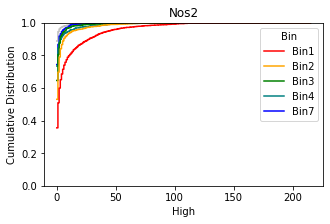

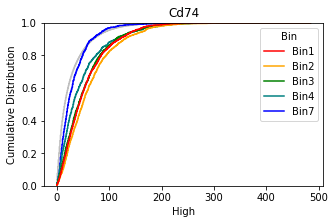

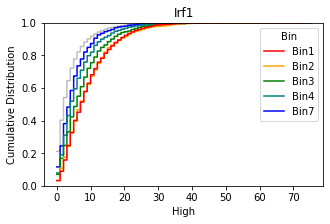

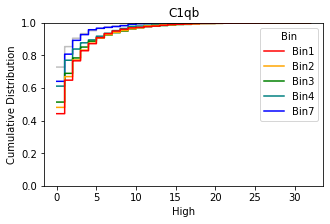

...

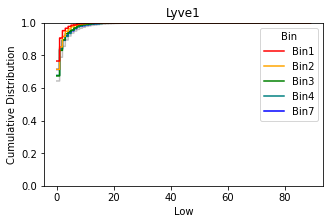

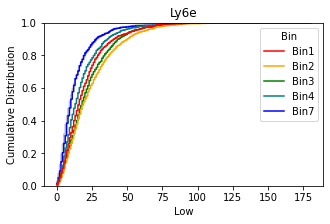

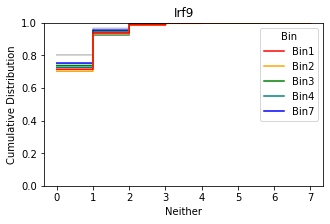

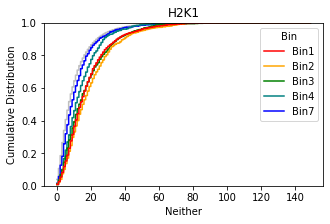

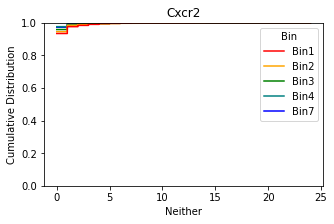

In [1709]:
#could try loading in each each experiment from the folder, running the permutation test on raw counts, finding the merged;
folder = '/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Annotated_h5ad/'
for file in os.listdir(folder):
    adata = sc.read_h5ad(folder+file)
    experiment = file.split(".")[0]
    print(experiment)
    #repeating with raw counts to see if I get the same results
#could also repeat by comparing the 100 um to some other distance

#run the permutation test on A) all the controls, B) all the TB cells
# condition='TB'
# adata = adata_keep[adata_keep.obs.Condition==condition].copy()
    layer = 'counts'

    adata_df = pd.DataFrame.sparse.from_spmatrix(adata.layers[layer])
    adata_df = adata_df.sparse.to_dense()
    adata_df.columns = adata.var.index
    adata_df.index = adata.obs.index
    adata_df['distance_real'] = adata.obs['distance_to_tb'].copy()
    adata_df.columns = [i.replace('-','') for i in adata_df.columns]

    adata_df['Bin'] = 'Null'
    binsize = 100

#for the first 4 bins, plot the distribution on top of this one in a different color
    adata_df.distance_real = adata_df.distance_real.astype('float')
    adata_df.loc[(adata_df.distance_real>=6*binsize) & (adata_df.distance_real<7*binsize),'Bin'] = 'Bin7'
    adata_df.loc[(adata_df.distance_real>=3*binsize) & (adata_df.distance_real<4*binsize),'Bin'] = 'Bin4'
    adata_df.loc[(adata_df.distance_real>=2*binsize) & (adata_df.distance_real<3*binsize),'Bin'] = 'Bin3'
    adata_df.loc[(adata_df.distance_real>=binsize) & (adata_df.distance_real<2*binsize),'Bin'] = 'Bin2'
    adata_df.loc[adata_df.distance_real<binsize,'Bin'] = 'Bin1'
    print("number of cells per bin: ",adata_df.Bin.value_counts())
    adata_df = adata_df.sort_values('Bin',ascending=True)

#permutation test ~43 iterations/second
    perm_iterations = 1000
    df_results = pd.DataFrame(columns=['sample_stat','average_stat','p_value'])
    for transcript in tqdm(adata_df.columns[:140]):
        sample_stat = np.mean(adata_df.loc[adata_df['Bin']=='Bin1',transcript]) - np.mean(adata_df[transcript]) #calculate the difference in means between your bin1 distribution and the null distribution
        stats = np.zeros(perm_iterations)
        for k in range(perm_iterations):
            labels = np.random.permutation((adata_df['Bin'] == 'Bin1').values) #randomly rearrange the bin labels so you get another sample in 'Bin1'
            stats[k] = np.mean(adata_df[transcript][labels]) - np.mean(adata_df[transcript]) #for each of 1000 iterations, calculate the difference between the random Bin1 Nos2 values and the null distribution
    
        if sample_stat>=0:
            p_value = np.mean(stats > sample_stat)
        if sample_stat<0:
            p_value = np.mean(stats < sample_stat)
    #save the stat and p-value per transcript
        df_results.loc[transcript] = [sample_stat,np.mean(stats),p_value] 

    df_results = df_results.sort_values('p_value',ascending=True)

#increased close to TB
    top_hits = df_results[(df_results.p_value<0.001)].sort_values('sample_stat',ascending=False)
    top_hits = list(top_hits[top_hits.sample_stat>0.1].index)
    top_hits = [i for i in top_hits if not i.startswith('Blank')]

    bottom_hits =df_results[(df_results.p_value<0.001) & (df_results.sample_stat<-0.1)].index
    bottom_hits = [i for i in bottom_hits if not i.startswith('Blank')]

#show violin or feature plots of these genes in the smartseq data
    sc_data = sc.read_h5ad('/hpc/projects/data_lg/shoshana/Smartseq2nd/adataMNPNEW.h5ad')
    sc_data = sc_data[sc_data.obs.leiden!='Neutrophil'].copy()
    #sc.pl.umap(sc_data,color = 'leiden')
    sc_data.var_names = [i.replace('-','') for i in sc_data.var_names]

    try:
        sc.pl.stacked_violin(sc_data,top_hits,groupby='leiden',rotation=90)
    except:
        print('too little data for stacked violin')
    allprobes = [i for i in list(df_results.index) if not i.startswith('Blank')]

    sc_data.var['UpNearTB'] = False
    sc_data.var.loc[sc_data.var.index.isin(top_hits),'UpNearTB'] = True

    sc_data.var['DownNearTB'] = False
    sc_data.var.loc[sc_data.var.index.isin(bottom_hits),'DownNearTB'] = True

    sc_data.var['NotUpNearTB'] = False
    sc_data.var.loc[sc_data.var.index.isin(allprobes),'NotUpNearTB'] = True
    sc_data.var.loc[sc_data.var['UpNearTB']==True,'NotUpNearTB'] = False
    sc_data.var.loc[sc_data.var['DownNearTB']==True,'NotUpNearTB'] = False

    try:
        sc.pl.heatmap(sc_data,top_hits,groupby='leiden')
    except:
        print('too little data')
    sc.pp.calculate_qc_metrics(sc_data,qc_vars=['UpNearTB','DownNearTB','NotUpNearTB'],inplace=True)
    #sc.pl.umap(sc_data,color = ['leiden'])
    #sc.pl.umap(sc_data,color = ['total_counts_UpNearTB','pct_counts_UpNearTB','total_counts_DownNearTB','pct_counts_DownNearTB'])
    #sc.pl.umap(sc_data,color = ['total_counts_NotUpNearTB','pct_counts_NotUpNearTB'])

    fig,ax = plt.subplots(figsize=(5,3))
    ax.set_ylim(0,7)
    sc.pl.violin(sc_data,['pct_counts_UpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = experiment+'_'+layer+'_ViolinPlot_UP_TB.pdf',ax=ax)
    fig,ax = plt.subplots(figsize=(5,3))
    ax.set_ylim(0,7)
    sc.pl.violin(sc_data,['pct_counts_DownNearTB'],groupby='leiden',rotation=90,inner='quartile',save = experiment+'_'+layer+'_ViolinPlot_Down_TB.pdf',ax=ax)

    fig,ax = plt.subplots(figsize=(5,3))
    ax.set_ylim(0,7)
    sc.pl.violin(sc_data,['pct_counts_NotUpNearTB'],groupby='leiden',rotation=90,inner='quartile',save = experiment+'_'+layer+'_ViolinPlot_NOTUP_TB.pdf',ax=ax)
             
    print(df_results.p_value[df_results.p_value>0].min())
    df_results.loc[df_results.p_value==0,'p_value'] = 0.9/perm_iterations


    df_results.to_csv('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Stats/stats_'+experiment+'_'+layer+'.csv')

    plt.scatter(x = df_results.sample_stat, y=-np.log10(df_results.p_value))
    plt.xlabel('difference in means, Bin1 - Null')
    plt.ylabel('-log p value')

    for i in range(df_results.shape[0]):
     plt.text(x=df_results.sample_stat[i],y=-np.log10(df_results.p_value[i]),s=df_results.index[i], 
          fontdict=dict(color='black',size=4))

    plt.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/volcano_'+experiment+'_'+layer+'_'+'.pdf')

    print(df_results.sort_values('sample_stat',ascending=True)[:20])
    print(df_results.sort_values('sample_stat',ascending=False)[:20])   


    marker_dict = {'High':['Nos2', 'Cd74', 'Irf1','C1qb'], 'Low':['Sparc','Jun','Lyve1','Ly6e'],'Neither':['Irf9','H2K1','Cxcr2']}


    #run for each set of marker genes
    for celltype in list(marker_dict.keys()):
   
        for transcript in marker_dict[celltype]:
    #if transcript not in ['Nos2','C1qa','C1qb','C1qc','Fcgr4','Lyve1']:
        #continue

        
  
            fig,ax = plt.subplots(figsize=(5,3))
            sns.histplot(data = adata_df,
                 x=transcript, 
                 bins=10000, 
                 binrange=(0,max(adata_df[transcript])),
                 stat="density",
                 element="step", 
                 fill=False, 
                 cumulative=True,
                color='Grey',
                alpha=0.5)
        
    
            sns.histplot(data = adata_df[adata_df.Bin!='Null'],
                 x=transcript, 
                 hue='Bin', 
                 bins=10000, 
                 binrange=(0,max(adata_df[transcript])),
                 stat="density",
                 element="step", 
                 fill=False, 
                 cumulative=True, 
                 common_norm=False,
                palette = ['Red','Orange','Green','Teal','Blue'])
            ax.set_xlabel(celltype)
            ax.set_ylabel('Cumulative Distribution')
            ax.set_title(transcript)
            ax.set_ylim(0,1)
            fig.savefig('/hpc/projects/data.science/leah.dorman/Spatial/Vizgen/Shoshana/Figures/'+experiment+'_'+transcript+'_'+layer+'_histogram.pdf')        
        
    print(experiment, "Up: ",sc_data.var.UpNearTB.value_counts())
    print("Down: ", sc_data.var.DownNearTB.value_counts())
    print("Neither: ",sc_data.var.NotUpNearTB.value_counts())


